In [64]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, accuracy_score
from transformers import Trainer, TrainingArguments
from transformers import GPT2TokenizerFast
from transformers import GPT2Tokenizer, GPT2ForTokenClassification, Trainer, TrainingArguments
from peft import LoraConfig, TaskType, get_peft_model
import torch
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from datasets import DatasetDict, load_dataset


In [65]:
# Wybór urządzenia
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


## PEFT

In [66]:
# dataset = load_dataset("jnlpba", trust_remote_code = True)
# train, val = dataset['train'].train_test_split(test_size=0.2).values()

# # Próbkowanie danych 
# train_dataset = train.shuffle(seed=42).select(range(int(len(train) * 0.05)))
# val_dataset = val.shuffle(seed=42).select(range(int(len(val) * 0.05)))


# Load the dataset
dataset = load_dataset("jnlpba", trust_remote_code=True)

# Split the dataset into training and validation sets
train, val = dataset['train'].train_test_split(test_size=0.2).values()

# Define a sampling function
def sample_dataset(data, ratio):
    sample_size = int(len(data) * ratio)  # Calculate the sample size
    return data.shuffle(seed=42).select(range(sample_size))  # Shuffle and select the first 'sample_size' examples

# Set the ratio
ratio = 0.05  # 5% of the original dataset

# Apply sampling to both train and validation datasets
train_sampled = sample_dataset(train, ratio)
val_sampled = sample_dataset(val, ratio)

# Combine sampled datasets into a DatasetDict
dataset_sampled = DatasetDict({
    "train": train_sampled,
    "validation": val_sampled
})

# Print sizes of the sampled datasets
print(f"Sampled train size: {len(dataset_sampled['train'])}")
print(f"Sampled validation size: {len(dataset_sampled['validation'])}")


Sampled train size: 741
Sampled validation size: 185


In [67]:
label_list = dataset["train"].features[f"ner_tags"].feature.names
num_labels = len(label_list)

In [68]:
# sample_data = dataset["train"].select(range(10)) 

# df = pd.DataFrame({
#     "tokens": [" ".join(example["tokens"]) for example in sample_data],
#     "ner_tags": [example["ner_tags"] for example in sample_data]
# })

# df

In [69]:
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
model = GPT2ForTokenClassification.from_pretrained("gpt2", num_labels=num_labels) 

tokenizer.pad_token = tokenizer.eos_token

Some weights of GPT2ForTokenClassification were not initialized from the model checkpoint at gpt2 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [70]:
tokenizer = GPT2TokenizerFast.from_pretrained("gpt2", add_prefix_space=True)

tokenizer.pad_token = tokenizer.eos_token

def tokenize_and_align_labels(examples):
    # Tokenizacja
    tokenized_inputs = tokenizer(
        examples["tokens"],
        truncation=True,
        is_split_into_words=True,
        padding='max_length',
        max_length=128
    )
    
    labels = []
    
    # Dopasowanie etykiet do tokenów
    for i, label in enumerate(examples['ner_tags']):
        word_ids = tokenized_inputs.word_ids(batch_index=i)  # Identyfikatory słów
        label_ids = []
        previous_word_idx = None
        
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)  # Ignorowanie tokenów typu padding (None)
            elif word_idx != previous_word_idx:
                label_ids.append(label[word_idx])  
            else:
                label_ids.append(-100)  # Ignorowanie sub-tokenów (części słów)
            previous_word_idx = word_idx
        
        labels.append(label_ids)

    tokenized_inputs["labels"] = labels
    return tokenized_inputs

# Tokenizowanie danych
tokenized_datasets = train.map(tokenize_and_align_labels, batched=True)


Map: 100%|██████████| 14836/14836 [00:01<00:00, 8351.51 examples/s]


In [71]:
# tokenized_datasets['train']

In [72]:
# Konfiguracja LoRA
lora_config = LoraConfig(
    task_type=TaskType.TOKEN_CLS,  
    r=8,  # Ranga LoRA
    lora_alpha=1,
    lora_dropout=0.1
)

# Aplikowanie LoRA do modelu
model = get_peft_model(model, lora_config)

/home/iza/Desktop/Studia/sem2/nlp/NLP_task1/.venv/lib/python3.10/site-packages/peft/tuners/lora/layer.py:1150: UserWarning: fan_in_fan_out is set to False but the target module is `Conv1D`. Setting fan_in_fan_out to True.
  warnings.warn(


In [73]:
# Funkcja tokenizująca
def tokenize_function(examples):
    return tokenizer(examples['tokens'], padding="max_length", truncation=True, is_split_into_words=True)

# train_dataset = train_dataset.map(tokenize_function, batched=True)
# val_dataset = val_dataset.map(tokenize_function, batched=True)
train_sampled = train_sampled.map(tokenize_function, batched=True)
val_sampled = val_sampled.map(tokenize_function, batched=True)


Map: 100%|██████████| 185/185 [00:00<00:00, 4241.02 examples/s]


In [74]:
def compute_metrics(p):
    predictions, labels = p
    predictions = np.argmax(predictions, axis=2)

    # Usunięcie indeksów ignorowanych (specjalne tokeny)
    true_predictions = [
        [p for (p, l) in zip(prediction, label) if l != -100]
        for prediction, label in zip(predictions, labels)
    ]
    true_labels = [
        [l for (p, l) in zip(prediction, label) if l != -100]
        for prediction, label in zip(predictions, labels)
    ]

    # Spłaszczanie list
    true_predictions_flat = [item for sublist in true_predictions for item in sublist]
    true_labels_flat = [item for sublist in true_labels for item in sublist]

    # Obliczanie dokładności i F1
    accuracy = np.sum(np.array(true_predictions_flat) == np.array(true_labels_flat)) / len(true_labels_flat)

    # Obliczanie F1
    f1 = f1_score(true_labels_flat, true_predictions_flat, average="weighted")
    
    # Obliczenie macierzy pomyłek
    cm = confusion_matrix(true_labels_flat, true_predictions_flat)
    
    # Wyświetlenie macierzy pomyłek
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap="Blues", xticks_rotation="vertical")
    plt.title("Confusion Matrix for NER Labels")
    plt.show()

    return {"accuracy": accuracy, "f1": f1}




In [75]:
# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=2e-4,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=50,
    weight_decay=0.1,
    # optim="adamw_torch_fused",  # fused AdamW
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets["train"],
    eval_dataset=tokenized_datasets["validation"],
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)


/home/iza/Desktop/Studia/sem2/nlp/NLP_task1/.venv/lib/python3.10/site-packages/transformers/training_args.py:1545: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


KeyError: "Column train not in the dataset. Current columns in the dataset: ['id', 'tokens', 'ner_tags', 'input_ids', 'attention_mask', 'labels']"

In [ ]:
trainer.train()
trainer.save_model("./saved_model_gpt2_for_tokens")

  0%|          | 409/115950 [00:51<4:07:59,  7.77it/s]

KeyboardInterrupt: 

próba

In [76]:
from datasets import load_dataset, DatasetDict
from transformers import GPT2TokenizerFast, GPT2ForTokenClassification, Trainer, TrainingArguments
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import torch
import random
import os
from peft import get_peft_config, PeftModel, PeftConfig, get_peft_model, LoraConfig, TaskType
import matplotlib.pyplot as plt

# Set device to CUDA if available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"


Using device: cuda


In [77]:
# Load the dataset
dataset = load_dataset("jnlpba", trust_remote_code=True)

# Split the dataset into training and validation sets
train, val = dataset['train'].train_test_split(test_size=0.2).values()


In [78]:
# Define a sampling function
def sample_dataset(data, ratio):
    sample_size = int(len(data) * ratio)  # Calculate the sample size
    return data.shuffle(seed=42).select(range(sample_size))  # Shuffle and select the first 'sample_size' examples

# Set the ratio for sampling
ratio = 0.05  # 5% of the original dataset

# Sample each subset (train and validation)
train_sampled = sample_dataset(train, ratio)
val_sampled = sample_dataset(val, ratio)

# Combine sampled datasets into a DatasetDict
dataset_sampled = DatasetDict({
    "train": train_sampled,
    "validation": val_sampled
})

# Print the sizes of the sampled datasets
print(f"Sampled train size: {len(dataset_sampled['train'])}")
print(f"Sampled validation size: {len(dataset_sampled['validation'])}")


Sampled train size: 741
Sampled validation size: 185


In [79]:
# Get the label list and number of labels
label_list = dataset["train"].features[f"ner_tags"].feature.names
num_labels = len(label_list)

In [80]:
# Initialize the tokenizer
tokenizer = GPT2TokenizerFast.from_pretrained("gpt2", add_prefix_space=True)
tokenizer.pad_token = tokenizer.eos_token


In [ ]:
# Define the function for tokenizing and aligning labels
def tokenize_and_align_labels(examples):
    tokenized_inputs = tokenizer(
        examples["tokens"],
        truncation=True,
        is_split_into_words=True,
        padding='max_length',
        max_length=128
    )
    labels = []
    for i, label in enumerate(examples['ner_tags']):
        word_ids = tokenized_inputs.word_ids(batch_index=i)
        label_ids = []
        previous_word_idx = None
        for word_idx in word_ids:
            if word_idx is None:
                label_ids.append(-100)  # Ignore padding tokens
            elif word_idx != previous_word_idx:
                label_ids.append(label[word_idx])  # Assign label for new word
            else:
                label_ids.append(-100)  # Ignore sub-token (part of the same word)
            previous_word_idx = word_idx
        labels.append(label_ids)

    tokenized_inputs["labels"] = labels
    return tokenized_inputs

# Tokenize the sampled datasets
train_sampled = train_sampled.map(tokenize_and_align_labels, batched=True)
val_sampled = val_sampled.map(tokenize_and_align_labels, batched=True)

# Initialize the model
model = GPT2ForTokenClassification.from_pretrained("gpt2", num_labels=num_labels)
model.to(device)


Map: 100%|██████████| 185/185 [00:00<00:00, 7861.74 examples/s]
Some weights of GPT2ForTokenClassification were not initialized from the model checkpoint at gpt2 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


GPT2ForTokenClassification(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-11): 12 x GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2SdpaAttention(
          (c_attn): Conv1D(nf=2304, nx=768)
          (c_proj): Conv1D(nf=768, nx=768)
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D(nf=3072, nx=768)
          (c_proj): Conv1D(nf=768, nx=3072)
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (dropout): Dropout(p=0.1, inplace=False)
  (classifier): Linear(in_features=768, out_features=11, bias=True

In [82]:

# Define a simple compute_metrics function
def compute_metrics(p):
    predictions, labels = p
    predictions = np.argmax(predictions, axis=2)

    # Remove ignored indices (padding tokens)
    true_predictions = [
        [p for (p, l) in zip(prediction, label) if l != -100]
        for prediction, label in zip(predictions, labels)
    ]
    true_labels = [
        [l for (p, l) in zip(prediction, label) if l != -100]
        for prediction, label in zip(predictions, labels)
    ]

    # Flatten the lists
    true_predictions_flat = [item for sublist in true_predictions for item in sublist]
    true_labels_flat = [item for sublist in true_labels for item in sublist]

    # Calculate accuracy and F1 score
    accuracy = np.sum(np.array(true_predictions_flat) == np.array(true_labels_flat)) / len(true_labels_flat)
    f1 = f1_score(true_labels_flat, true_predictions_flat, average="weighted")
    
    # Confusion matrix
    cm = confusion_matrix(true_labels_flat, true_predictions_flat)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap="Blues", xticks_rotation="vertical")
    plt.title("Confusion Matrix for NER Labels")
    plt.show()

    return {"accuracy": accuracy, "f1": f1}


In [ ]:
# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=2e-4,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=50,
    weight_decay=0.1,
    logging_dir='./logs',
)

# Define the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_sampled,
    eval_dataset=val_sampled,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)


/home/iza/Desktop/Studia/sem2/nlp/NLP_task1/.venv/lib/python3.10/site-packages/transformers/training_args.py:1545: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
  0%|          | 409/115950 [08:56<42:07:08,  1.31s/it]


  2%|▏         | 93/4650 [00:18<14:13,  5.34it/s]

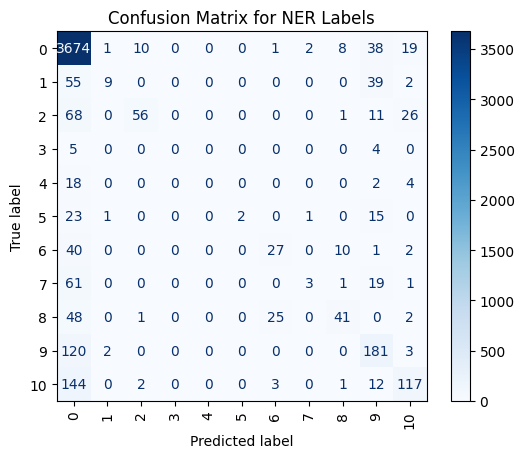


  2%|▏         | 94/4650 [00:20<47:35,  1.60it/s]

{'eval_loss': 0.5313030481338501, 'eval_accuracy': 0.8282950423216445, 'eval_f1': 0.7965494836241537, 'eval_runtime': 1.4882, 'eval_samples_per_second': 124.313, 'eval_steps_per_second': 16.127, 'epoch': 1.0}


  4%|▍         | 186/4650 [00:39<13:43,  5.42it/s]

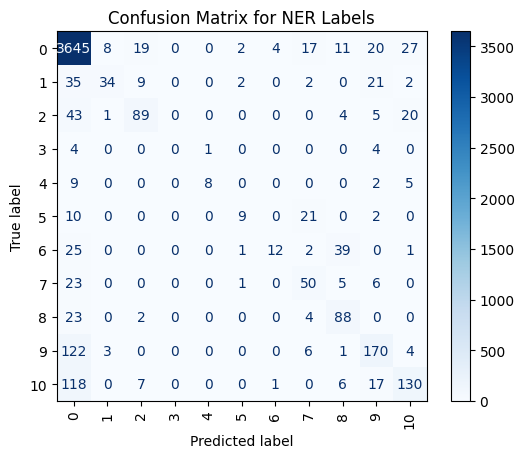


  4%|▍         | 187/4650 [00:40<46:04,  1.61it/s]

{'eval_loss': 0.44967159628868103, 'eval_accuracy': 0.8534864973800886, 'eval_f1': 0.8383314550958776, 'eval_runtime': 1.4727, 'eval_samples_per_second': 125.623, 'eval_steps_per_second': 16.297, 'epoch': 2.0}


  6%|▌         | 279/4650 [00:59<13:31,  5.39it/s]

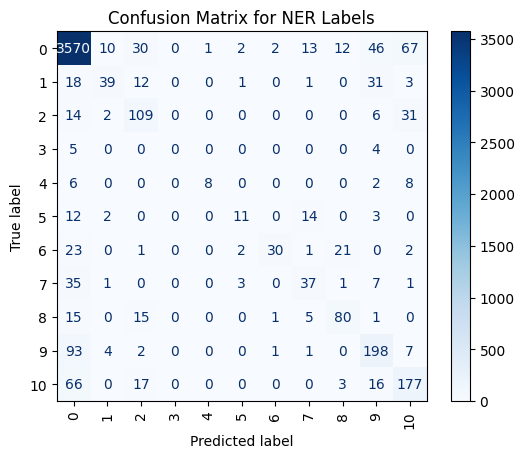


  6%|▌         | 280/4650 [01:01<45:16,  1.61it/s]

{'eval_loss': 0.45986756682395935, 'eval_accuracy': 0.8583232567513099, 'eval_f1': 0.85229840809816, 'eval_runtime': 1.4728, 'eval_samples_per_second': 125.615, 'eval_steps_per_second': 16.296, 'epoch': 3.0}


  8%|▊         | 372/4650 [01:19<13:24,  5.32it/s]

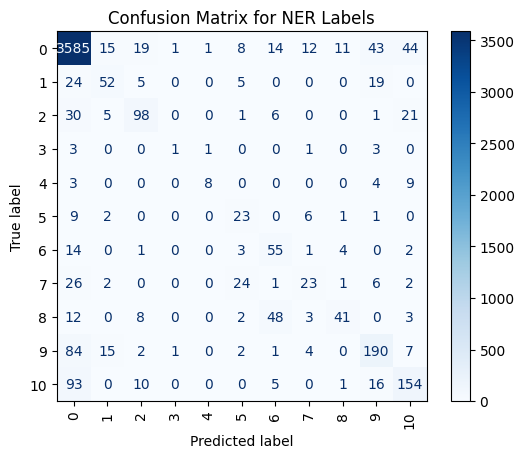


  8%|▊         | 373/4650 [01:21<44:38,  1.60it/s]

{'eval_loss': 0.5280852317810059, 'eval_accuracy': 0.8524788391777509, 'eval_f1': 0.8468115271826969, 'eval_runtime': 1.484, 'eval_samples_per_second': 124.663, 'eval_steps_per_second': 16.172, 'epoch': 4.0}


 10%|█         | 465/4650 [01:40<13:13,  5.27it/s]

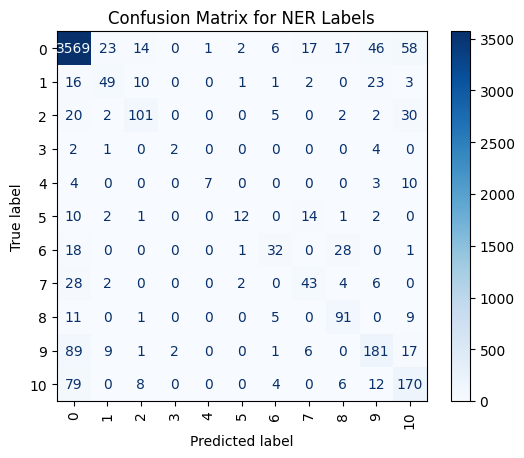


 10%|█         | 466/4650 [01:42<44:02,  1.58it/s]

{'eval_loss': 0.605966329574585, 'eval_accuracy': 0.8579201934703748, 'eval_f1': 0.8533470988585552, 'eval_runtime': 1.4982, 'eval_samples_per_second': 123.486, 'eval_steps_per_second': 16.02, 'epoch': 5.0}


 11%|█         | 500/4650 [01:49<14:22,  4.81it/s]

{'loss': 0.3499, 'grad_norm': 1.3211302757263184, 'learning_rate': 0.00017849462365591398, 'epoch': 5.38}


 12%|█▏        | 558/4650 [02:08<12:54,  5.29it/s]  

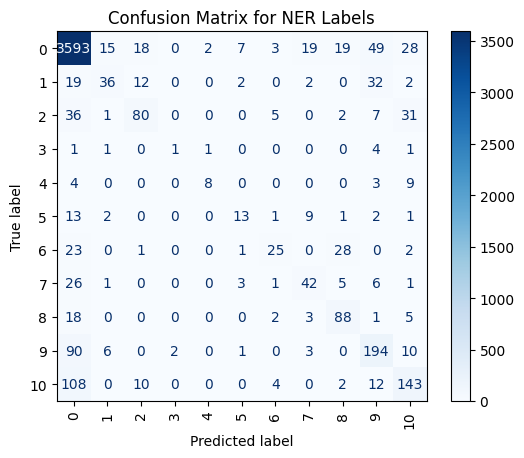


 12%|█▏        | 559/4650 [02:10<43:12,  1.58it/s]

{'eval_loss': 0.7257776260375977, 'eval_accuracy': 0.851068117694478, 'eval_f1': 0.8421946876679594, 'eval_runtime': 1.5017, 'eval_samples_per_second': 123.19, 'eval_steps_per_second': 15.981, 'epoch': 6.0}


 14%|█▍        | 651/4650 [02:29<12:42,  5.24it/s]

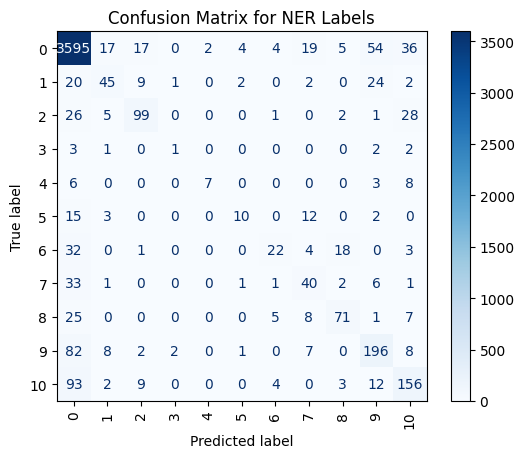


 14%|█▍        | 652/4650 [02:31<42:28,  1.57it/s]

{'eval_loss': 0.7370532751083374, 'eval_accuracy': 0.8548972188633616, 'eval_f1': 0.8468617869021808, 'eval_runtime': 1.5074, 'eval_samples_per_second': 122.727, 'eval_steps_per_second': 15.921, 'epoch': 7.0}


 16%|█▌        | 744/4650 [02:50<12:20,  5.27it/s]

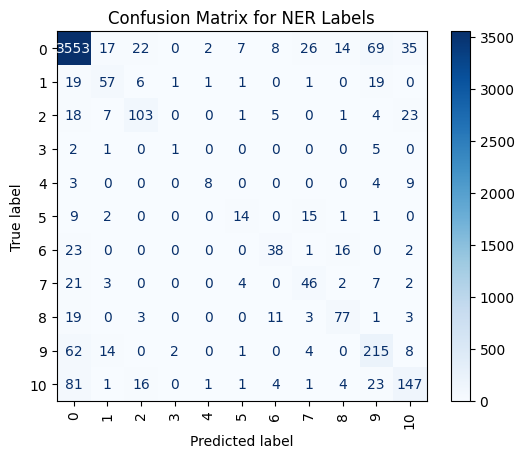


 16%|█▌        | 745/4650 [02:52<41:28,  1.57it/s]

{'eval_loss': 0.7594096660614014, 'eval_accuracy': 0.8583232567513099, 'eval_f1': 0.8554131898426438, 'eval_runtime': 1.5157, 'eval_samples_per_second': 122.057, 'eval_steps_per_second': 15.834, 'epoch': 8.0}


 18%|█▊        | 837/4650 [03:11<12:10,  5.22it/s]

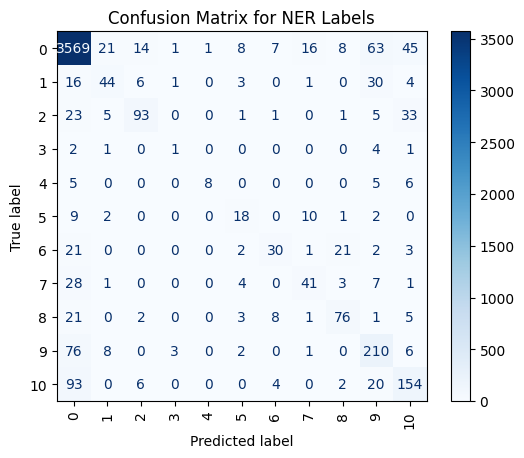


 18%|█▊        | 838/4650 [03:13<40:53,  1.55it/s]

{'eval_loss': 0.8248655796051025, 'eval_accuracy': 0.8553002821442967, 'eval_f1': 0.8504410473394265, 'eval_runtime': 1.53, 'eval_samples_per_second': 120.919, 'eval_steps_per_second': 15.687, 'epoch': 9.0}


 20%|██        | 930/4650 [03:32<11:42,  5.29it/s]

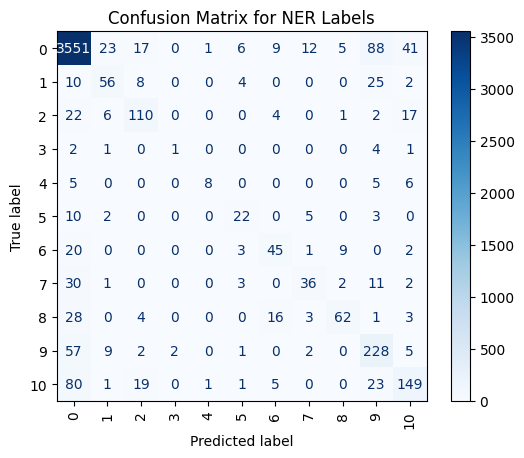


 20%|██        | 931/4650 [03:33<39:35,  1.57it/s]

{'eval_loss': 0.8210274577140808, 'eval_accuracy': 0.860137041515518, 'eval_f1': 0.8568811305161099, 'eval_runtime': 1.5178, 'eval_samples_per_second': 121.888, 'eval_steps_per_second': 15.813, 'epoch': 10.0}


 22%|██▏       | 1000/4650 [03:48<12:43,  4.78it/s]

{'loss': 0.055, 'grad_norm': 0.5999323129653931, 'learning_rate': 0.00015698924731182796, 'epoch': 10.75}


 22%|██▏       | 1023/4650 [04:01<11:46,  5.13it/s]  

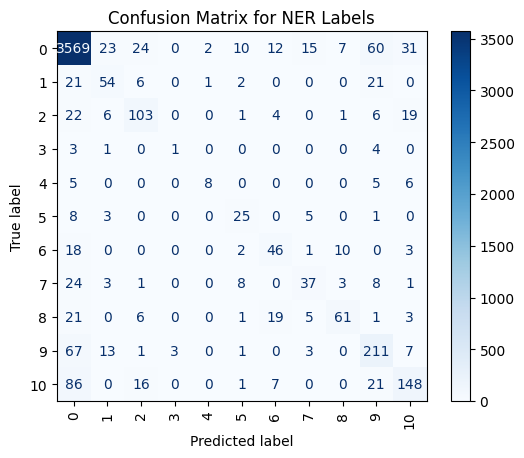


 22%|██▏       | 1024/4650 [04:03<39:57,  1.51it/s]

{'eval_loss': 0.865666389465332, 'eval_accuracy': 0.8591293833131801, 'eval_f1': 0.8553393187585271, 'eval_runtime': 1.571, 'eval_samples_per_second': 117.76, 'eval_steps_per_second': 15.277, 'epoch': 11.0}


 24%|██▍       | 1116/4650 [04:22<11:06,  5.30it/s]

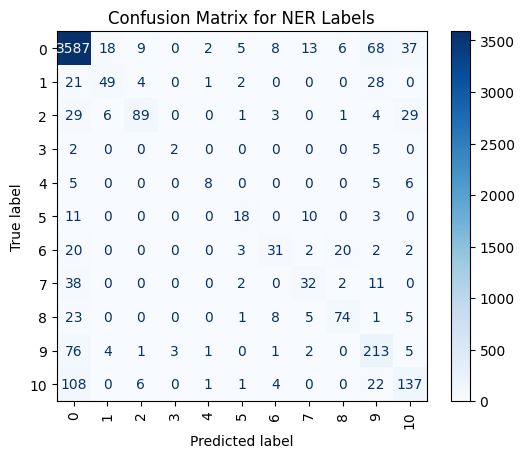


 24%|██▍       | 1117/4650 [04:24<37:35,  1.57it/s]

{'eval_loss': 0.9326516389846802, 'eval_accuracy': 0.8544941555824265, 'eval_f1': 0.8474365293986921, 'eval_runtime': 1.5208, 'eval_samples_per_second': 121.65, 'eval_steps_per_second': 15.782, 'epoch': 12.0}


 26%|██▌       | 1209/4650 [04:43<11:05,  5.17it/s]

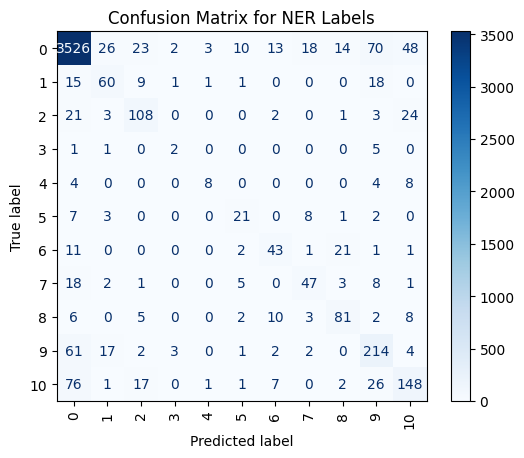


 26%|██▌       | 1210/4650 [04:45<40:53,  1.40it/s]

{'eval_loss': 0.8773548007011414, 'eval_accuracy': 0.8581217251108424, 'eval_f1': 0.8577412100253923, 'eval_runtime': 1.7578, 'eval_samples_per_second': 105.247, 'eval_steps_per_second': 13.654, 'epoch': 13.0}


 28%|██▊       | 1302/4650 [05:04<10:38,  5.24it/s]

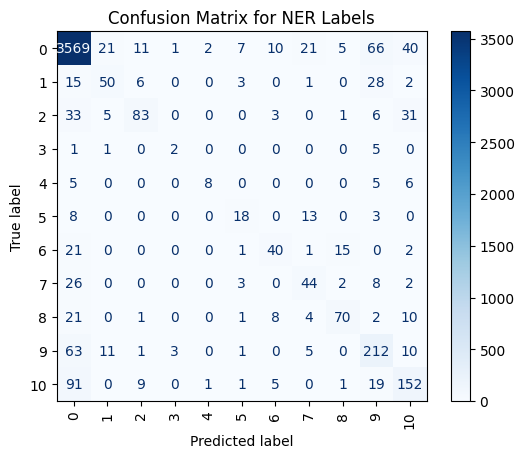


 28%|██▊       | 1303/4650 [05:06<36:07,  1.54it/s]

{'eval_loss': 0.9767797589302063, 'eval_accuracy': 0.8561064087061668, 'eval_f1': 0.8520479006698944, 'eval_runtime': 1.5358, 'eval_samples_per_second': 120.455, 'eval_steps_per_second': 15.627, 'epoch': 14.0}


 30%|███       | 1395/4650 [05:26<10:26,  5.19it/s]

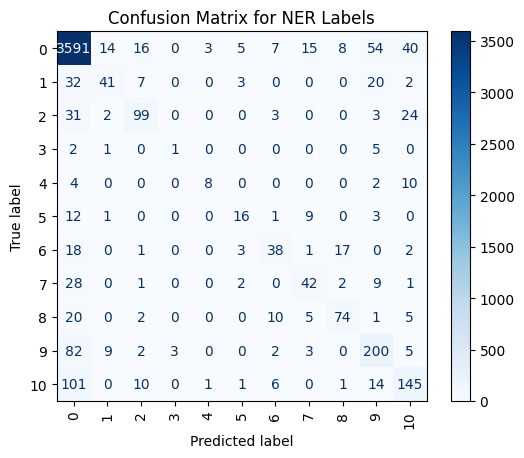


 30%|███       | 1396/4650 [05:28<35:17,  1.54it/s]

{'eval_loss': 0.9504973292350769, 'eval_accuracy': 0.8575171301894398, 'eval_f1': 0.8506539263008337, 'eval_runtime': 1.5473, 'eval_samples_per_second': 119.565, 'eval_steps_per_second': 15.511, 'epoch': 15.0}


 32%|███▏      | 1488/4650 [05:47<10:14,  5.15it/s]

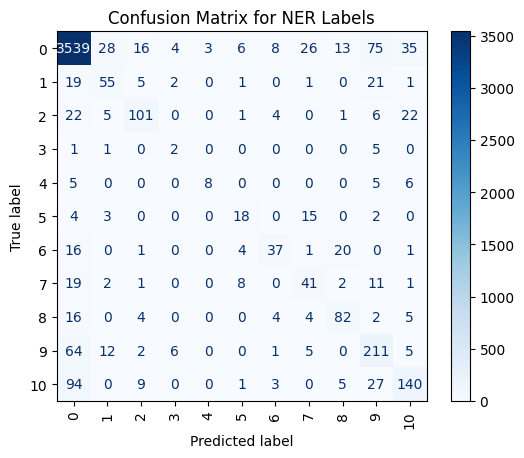


 32%|███▏      | 1489/4650 [05:49<34:45,  1.52it/s]

{'eval_loss': 0.9834854006767273, 'eval_accuracy': 0.8532849657396211, 'eval_f1': 0.8514083244877488, 'eval_runtime': 1.5741, 'eval_samples_per_second': 117.524, 'eval_steps_per_second': 15.246, 'epoch': 16.0}


 32%|███▏      | 1500/4650 [05:51<11:29,  4.57it/s]

{'loss': 0.0225, 'grad_norm': 0.1865595579147339, 'learning_rate': 0.00013548387096774193, 'epoch': 16.13}


 34%|███▍      | 1581/4650 [06:16<09:47,  5.22it/s]  

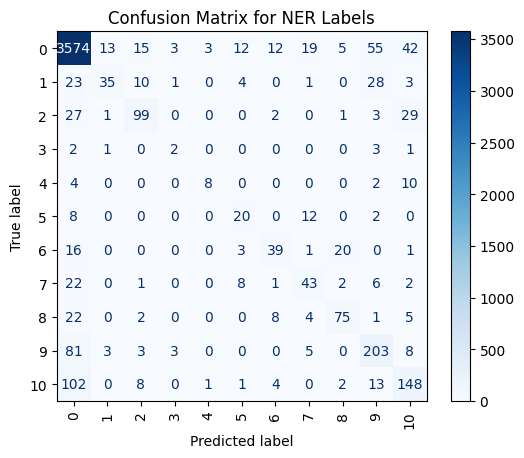


 34%|███▍      | 1582/4650 [06:18<33:06,  1.54it/s]

{'eval_loss': 0.9434618353843689, 'eval_accuracy': 0.8557033454252317, 'eval_f1': 0.8504203809054771, 'eval_runtime': 1.5358, 'eval_samples_per_second': 120.455, 'eval_steps_per_second': 15.627, 'epoch': 17.0}


 36%|███▌      | 1674/4650 [06:37<08:58,  5.53it/s]

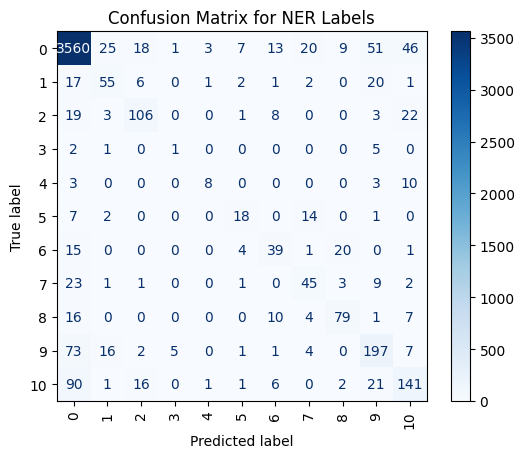


 36%|███▌      | 1675/4650 [06:39<30:34,  1.62it/s]

{'eval_loss': 1.031078577041626, 'eval_accuracy': 0.8563079403466344, 'eval_f1': 0.8533800321479763, 'eval_runtime': 1.4626, 'eval_samples_per_second': 126.485, 'eval_steps_per_second': 16.409, 'epoch': 18.0}


 38%|███▊      | 1767/4650 [06:58<08:41,  5.53it/s]

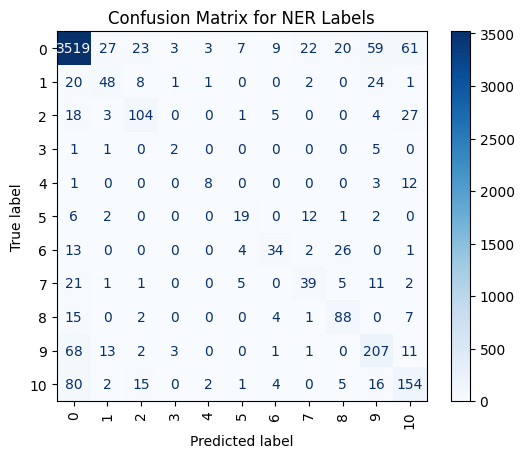


 38%|███▊      | 1768/4650 [06:59<29:22,  1.63it/s]

{'eval_loss': 1.0327149629592896, 'eval_accuracy': 0.8508665860540104, 'eval_f1': 0.8496029092140815, 'eval_runtime': 1.4504, 'eval_samples_per_second': 127.548, 'eval_steps_per_second': 16.547, 'epoch': 19.0}


 40%|████      | 1860/4650 [07:18<08:32,  5.44it/s]

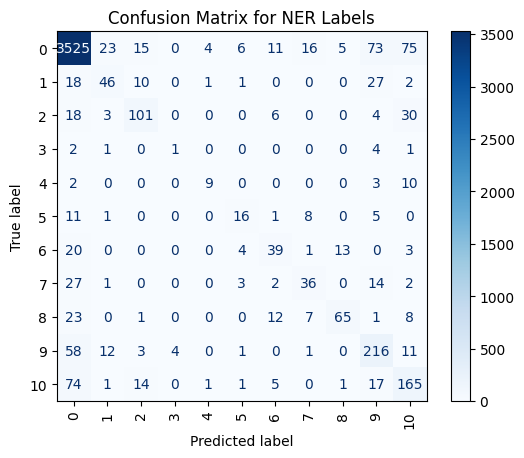


 40%|████      | 1861/4650 [07:20<29:19,  1.58it/s]

{'eval_loss': 1.0641039609909058, 'eval_accuracy': 0.8502619911326078, 'eval_f1': 0.8485783134304521, 'eval_runtime': 1.5026, 'eval_samples_per_second': 123.119, 'eval_steps_per_second': 15.972, 'epoch': 20.0}


 42%|████▏     | 1953/4650 [07:39<07:34,  5.94it/s]

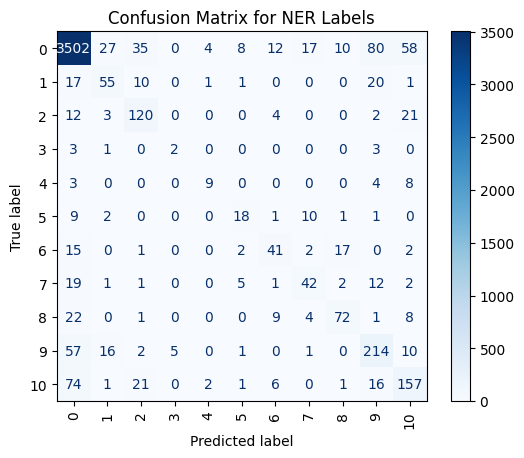


 42%|████▏     | 1954/4650 [07:41<25:59,  1.73it/s]

{'eval_loss': 1.0803983211517334, 'eval_accuracy': 0.852881902458686, 'eval_f1': 0.8527583240086566, 'eval_runtime': 1.366, 'eval_samples_per_second': 135.43, 'eval_steps_per_second': 17.569, 'epoch': 21.0}


 43%|████▎     | 2000/4650 [07:50<09:10,  4.81it/s]

{'loss': 0.0124, 'grad_norm': 0.3948145806789398, 'learning_rate': 0.00011397849462365593, 'epoch': 21.51}


 44%|████▍     | 2046/4650 [08:08<07:52,  5.51it/s]  

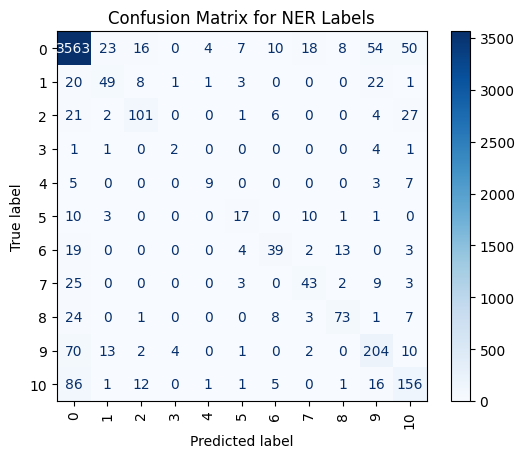


 44%|████▍     | 2047/4650 [08:09<26:39,  1.63it/s]

{'eval_loss': 1.105822205543518, 'eval_accuracy': 0.8577186618299073, 'eval_f1': 0.8542657167888436, 'eval_runtime': 1.4552, 'eval_samples_per_second': 127.127, 'eval_steps_per_second': 16.492, 'epoch': 22.0}


 46%|████▌     | 2139/4650 [08:29<07:31,  5.56it/s]

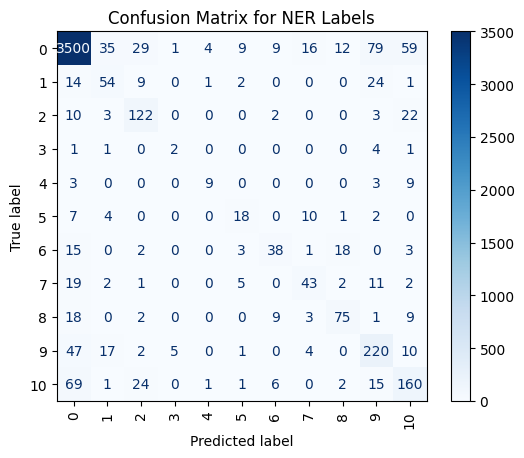


 46%|████▌     | 2140/4650 [08:30<25:22,  1.65it/s]

{'eval_loss': 1.11908757686615, 'eval_accuracy': 0.854695687222894, 'eval_f1': 0.8555967131140763, 'eval_runtime': 1.4311, 'eval_samples_per_second': 129.271, 'eval_steps_per_second': 16.77, 'epoch': 23.0}


 48%|████▊     | 2232/4650 [08:49<07:11,  5.60it/s]

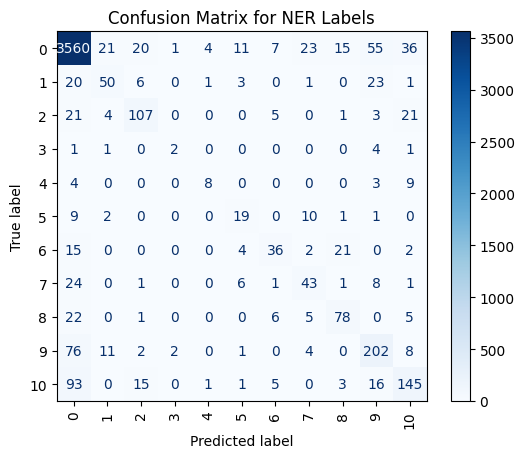


 48%|████▊     | 2233/4650 [08:50<24:16,  1.66it/s]

{'eval_loss': 1.1049517393112183, 'eval_accuracy': 0.8565094719871019, 'eval_f1': 0.8527208305849597, 'eval_runtime': 1.4262, 'eval_samples_per_second': 129.716, 'eval_steps_per_second': 16.828, 'epoch': 24.0}


 50%|█████     | 2325/4650 [09:10<07:06,  5.45it/s]

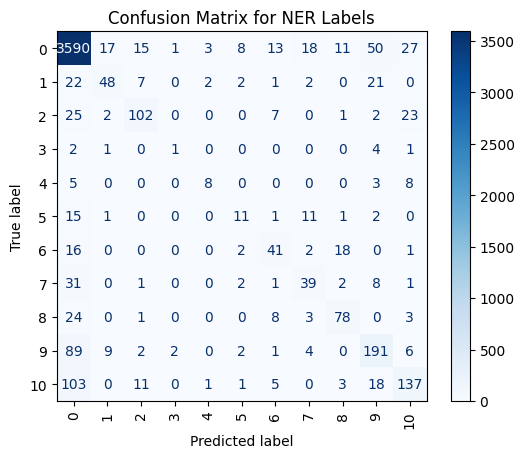


 50%|█████     | 2326/4650 [09:11<24:45,  1.56it/s]

{'eval_loss': 1.1623741388320923, 'eval_accuracy': 0.8557033454252317, 'eval_f1': 0.8488473841389462, 'eval_runtime': 1.5307, 'eval_samples_per_second': 120.859, 'eval_steps_per_second': 15.679, 'epoch': 25.0}


 52%|█████▏    | 2418/4650 [09:31<07:14,  5.13it/s]

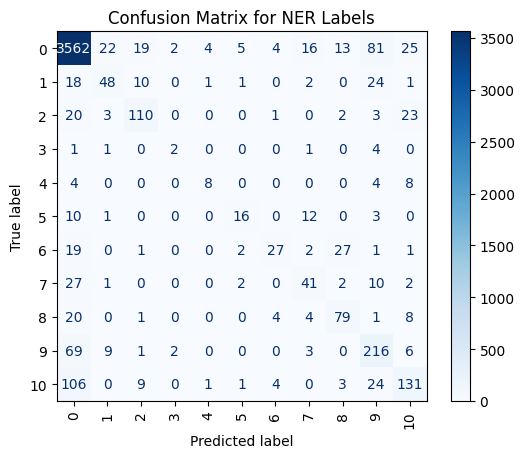


 52%|█████▏    | 2419/4650 [09:33<25:46,  1.44it/s]

{'eval_loss': 1.2140474319458008, 'eval_accuracy': 0.8544941555824265, 'eval_f1': 0.8490602569940813, 'eval_runtime': 1.6873, 'eval_samples_per_second': 109.641, 'eval_steps_per_second': 14.224, 'epoch': 26.0}


 54%|█████▍    | 2500/4650 [09:49<07:02,  5.09it/s]

{'loss': 0.0094, 'grad_norm': 1.4547698497772217, 'learning_rate': 9.247311827956989e-05, 'epoch': 26.88}


 54%|█████▍    | 2511/4650 [10:00<09:03,  3.94it/s]  

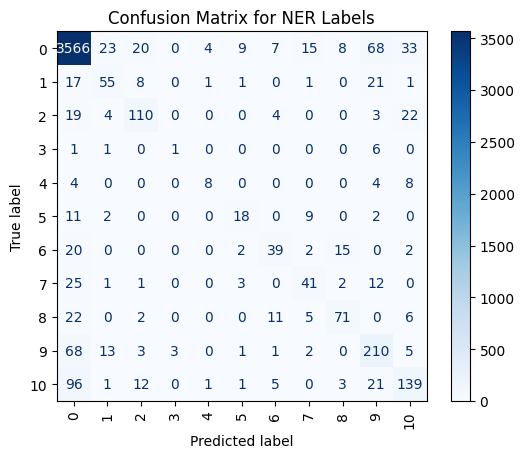


 54%|█████▍    | 2512/4650 [10:02<24:00,  1.48it/s]

{'eval_loss': 1.1587014198303223, 'eval_accuracy': 0.8581217251108424, 'eval_f1': 0.8538783905912938, 'eval_runtime': 1.4752, 'eval_samples_per_second': 125.404, 'eval_steps_per_second': 16.269, 'epoch': 27.0}


 56%|█████▌    | 2604/4650 [10:21<06:06,  5.59it/s]

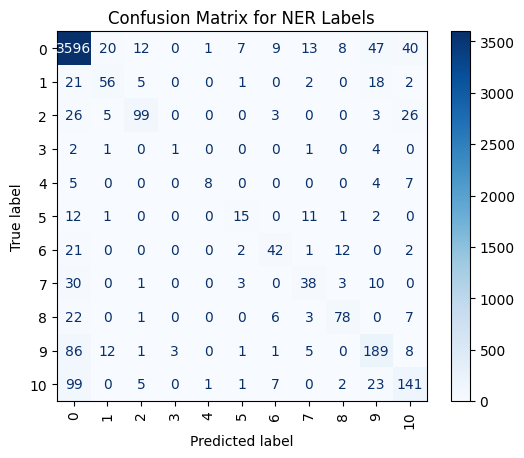


 56%|█████▌    | 2605/4650 [10:22<20:39,  1.65it/s]

{'eval_loss': 1.1990233659744263, 'eval_accuracy': 0.8591293833131801, 'eval_f1': 0.852887706551515, 'eval_runtime': 1.4347, 'eval_samples_per_second': 128.946, 'eval_steps_per_second': 16.728, 'epoch': 28.0}


 58%|█████▊    | 2697/4650 [10:41<05:50,  5.56it/s]

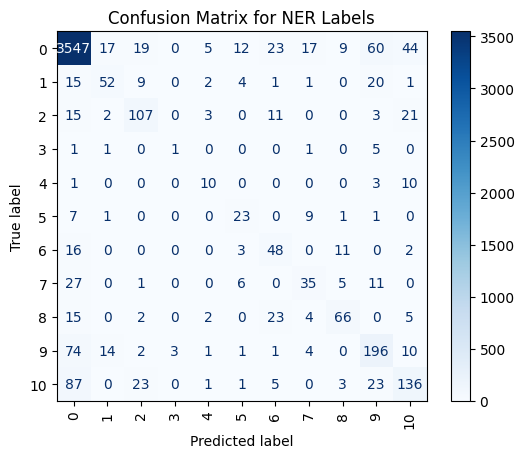


 58%|█████▊    | 2698/4650 [10:43<19:37,  1.66it/s]

{'eval_loss': 1.1491011381149292, 'eval_accuracy': 0.8506650544135429, 'eval_f1': 0.8484298372685817, 'eval_runtime': 1.4278, 'eval_samples_per_second': 129.574, 'eval_steps_per_second': 16.81, 'epoch': 29.0}


 60%|██████    | 2790/4650 [11:02<05:41,  5.45it/s]

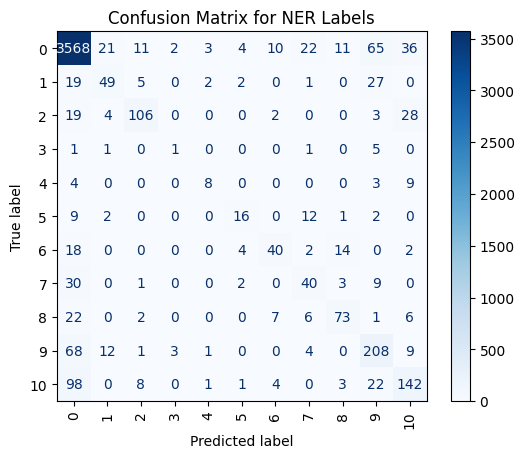


 60%|██████    | 2791/4650 [11:03<19:01,  1.63it/s]

{'eval_loss': 1.094829797744751, 'eval_accuracy': 0.8567110036275696, 'eval_f1': 0.8525499368465291, 'eval_runtime': 1.45, 'eval_samples_per_second': 127.589, 'eval_steps_per_second': 16.552, 'epoch': 30.0}


 62%|██████▏   | 2883/4650 [11:22<05:28,  5.37it/s]

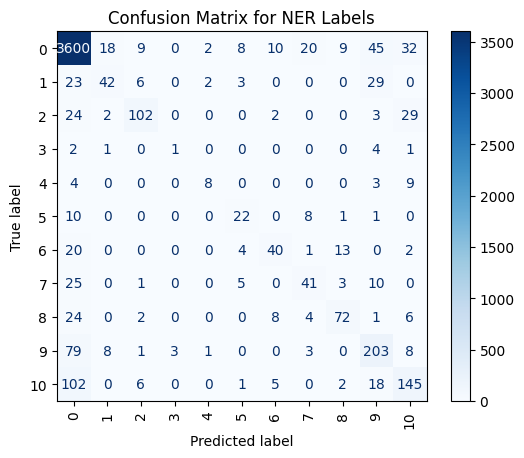


 62%|██████▏   | 2884/4650 [11:24<18:28,  1.59it/s]

{'eval_loss': 1.1685088872909546, 'eval_accuracy': 0.8617492946392583, 'eval_f1': 0.8555802660174459, 'eval_runtime': 1.4887, 'eval_samples_per_second': 124.272, 'eval_steps_per_second': 16.122, 'epoch': 31.0}


 64%|██████▍   | 2976/4650 [11:43<05:18,  5.26it/s]

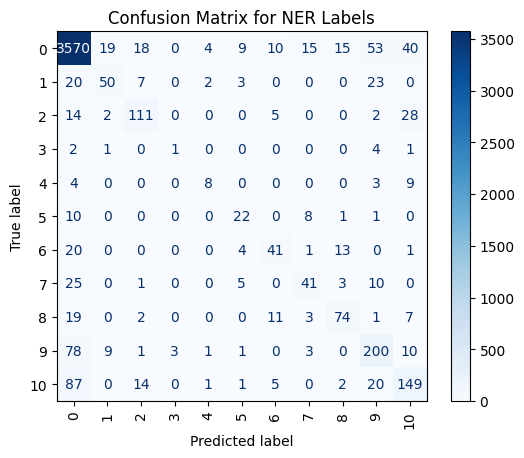


 64%|██████▍   | 2977/4650 [11:45<17:53,  1.56it/s]

{'eval_loss': 1.1807055473327637, 'eval_accuracy': 0.8599355098750504, 'eval_f1': 0.8559731724988717, 'eval_runtime': 1.5298, 'eval_samples_per_second': 120.931, 'eval_steps_per_second': 15.688, 'epoch': 32.0}


 65%|██████▍   | 3000/4650 [11:50<05:54,  4.65it/s]

{'loss': 0.0087, 'grad_norm': 0.16949334740638733, 'learning_rate': 7.096774193548388e-05, 'epoch': 32.26}


 66%|██████▌   | 3069/4650 [12:09<04:32,  5.80it/s]

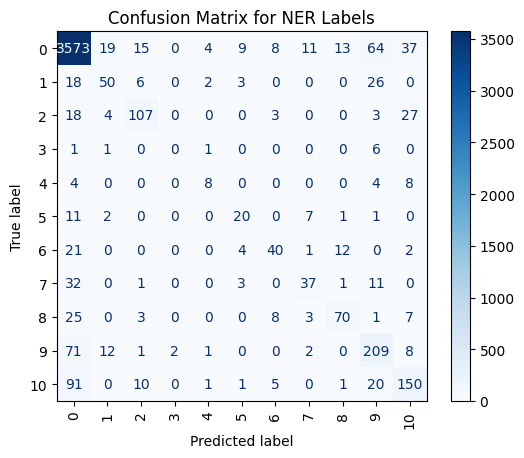


 66%|██████▌   | 3070/4650 [12:11<16:08,  1.63it/s]

{'eval_loss': 1.1937888860702515, 'eval_accuracy': 0.8593309149536478, 'eval_f1': 0.8545280152071973, 'eval_runtime': 1.4877, 'eval_samples_per_second': 124.356, 'eval_steps_per_second': 16.133, 'epoch': 33.0}


 68%|██████▊   | 3162/4650 [12:28<04:14,  5.84it/s]

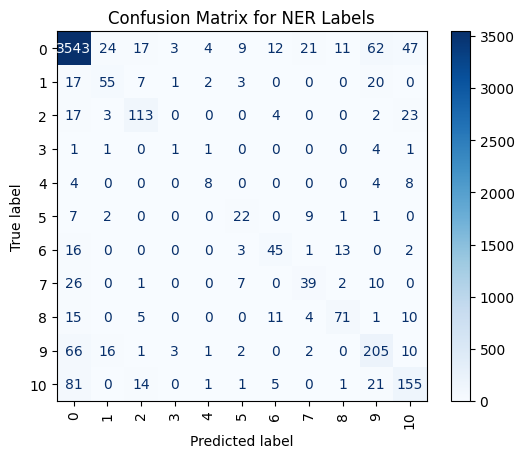


 68%|██████▊   | 3163/4650 [12:29<14:37,  1.70it/s]

{'eval_loss': 1.120316505432129, 'eval_accuracy': 0.8579201934703748, 'eval_f1': 0.8562621398867609, 'eval_runtime': 1.4126, 'eval_samples_per_second': 130.96, 'eval_steps_per_second': 16.989, 'epoch': 34.0}


 70%|███████   | 3255/4650 [12:47<04:07,  5.63it/s]

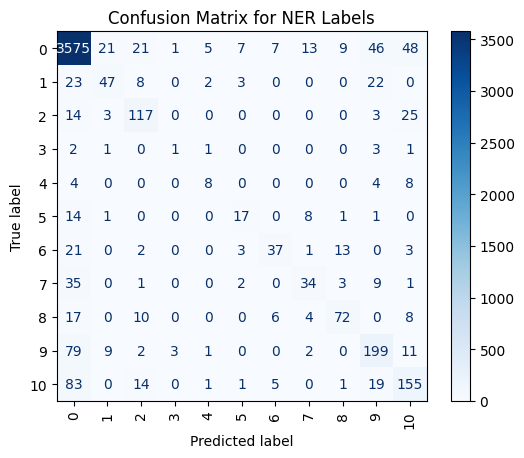


 70%|███████   | 3256/4650 [12:49<13:51,  1.68it/s]

{'eval_loss': 1.1798588037490845, 'eval_accuracy': 0.8589278516727126, 'eval_f1': 0.8538668110928748, 'eval_runtime': 1.4069, 'eval_samples_per_second': 131.491, 'eval_steps_per_second': 17.058, 'epoch': 35.0}


 72%|███████▏  | 3348/4650 [13:07<03:56,  5.52it/s]

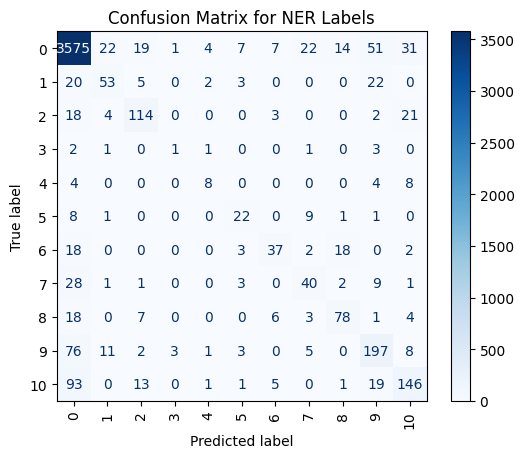


 72%|███████▏  | 3349/4650 [13:08<13:11,  1.64it/s]

{'eval_loss': 1.1861563920974731, 'eval_accuracy': 0.8607416364369206, 'eval_f1': 0.8564239149723651, 'eval_runtime': 1.437, 'eval_samples_per_second': 128.741, 'eval_steps_per_second': 16.702, 'epoch': 36.0}


 74%|███████▍  | 3441/4650 [13:27<03:49,  5.27it/s]

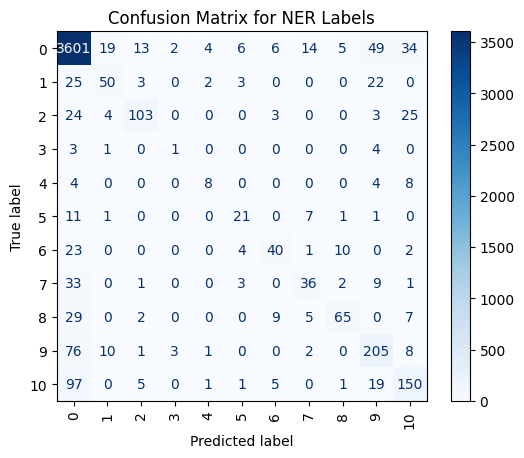


 74%|███████▍  | 3442/4650 [13:28<12:43,  1.58it/s]

{'eval_loss': 1.2043465375900269, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8562744284700025, 'eval_runtime': 1.5109, 'eval_samples_per_second': 122.445, 'eval_steps_per_second': 15.885, 'epoch': 37.0}


 75%|███████▌  | 3500/4650 [13:40<03:43,  5.14it/s]

{'loss': 0.0061, 'grad_norm': 0.05308177322149277, 'learning_rate': 4.9462365591397855e-05, 'epoch': 37.63}


 76%|███████▌  | 3534/4650 [13:52<03:18,  5.63it/s]

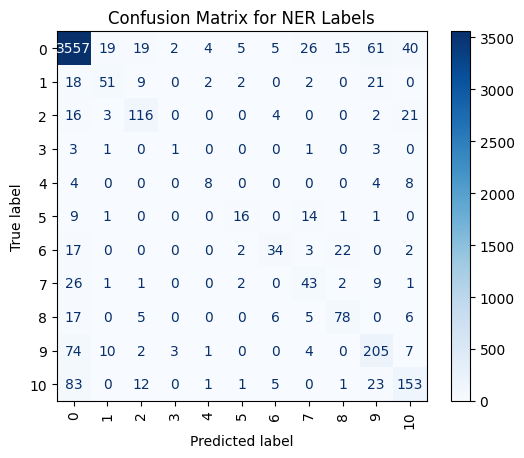


 76%|███████▌  | 3535/4650 [13:53<10:59,  1.69it/s]

{'eval_loss': 1.19242262840271, 'eval_accuracy': 0.8589278516727126, 'eval_f1': 0.8556268687682541, 'eval_runtime': 1.4065, 'eval_samples_per_second': 131.536, 'eval_steps_per_second': 17.064, 'epoch': 38.0}


 78%|███████▊  | 3627/4650 [14:11<03:09,  5.39it/s]

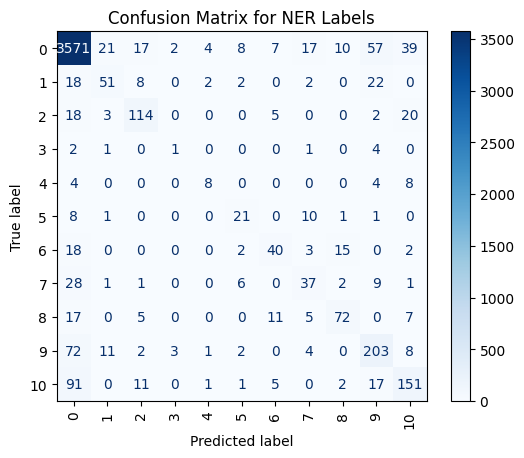


 78%|███████▊  | 3628/4650 [14:13<11:50,  1.44it/s]

{'eval_loss': 1.1720980405807495, 'eval_accuracy': 0.8603385731559855, 'eval_f1': 0.8565452095138045, 'eval_runtime': 1.7199, 'eval_samples_per_second': 107.562, 'eval_steps_per_second': 13.954, 'epoch': 39.0}


 80%|████████  | 3720/4650 [14:31<02:42,  5.74it/s]

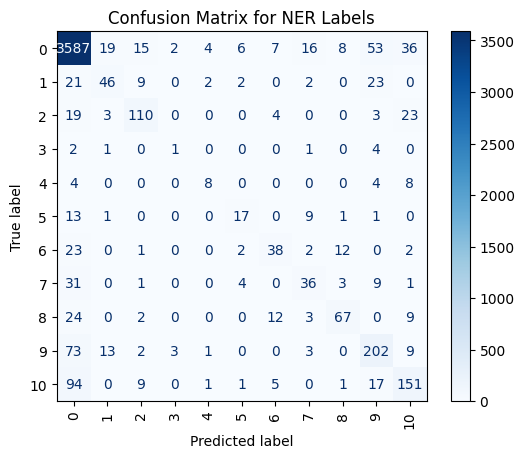


 80%|████████  | 3721/4650 [14:32<09:05,  1.70it/s]

{'eval_loss': 1.1988993883132935, 'eval_accuracy': 0.8591293833131801, 'eval_f1': 0.8535615910057093, 'eval_runtime': 1.3937, 'eval_samples_per_second': 132.736, 'eval_steps_per_second': 17.22, 'epoch': 40.0}


 82%|████████▏ | 3813/4650 [14:50<02:30,  5.57it/s]

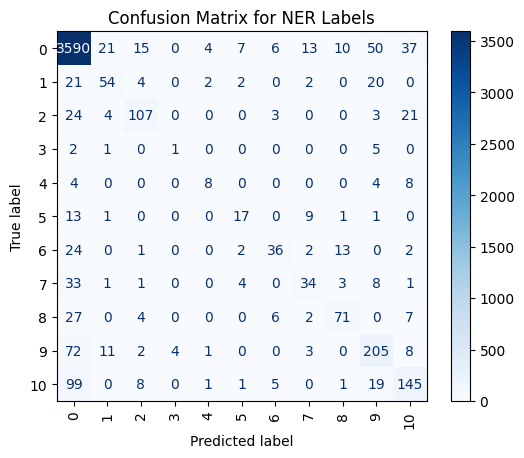


 82%|████████▏ | 3814/4650 [14:52<08:24,  1.66it/s]

{'eval_loss': 1.219623327255249, 'eval_accuracy': 0.860137041515518, 'eval_f1': 0.8539396026425385, 'eval_runtime': 1.4369, 'eval_samples_per_second': 128.749, 'eval_steps_per_second': 16.703, 'epoch': 41.0}


 84%|████████▍ | 3906/4650 [15:10<02:10,  5.72it/s]

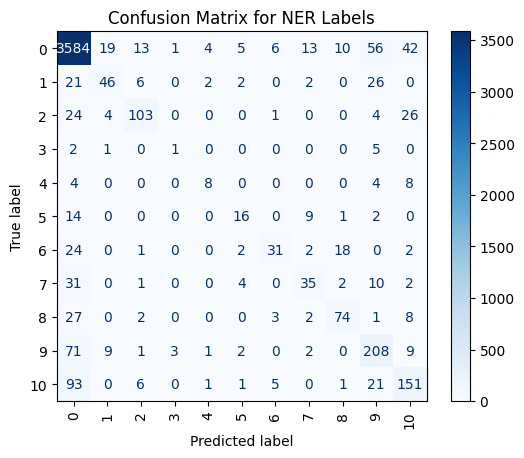


 84%|████████▍ | 3907/4650 [15:12<07:23,  1.67it/s]

{'eval_loss': 1.2377277612686157, 'eval_accuracy': 0.8579201934703748, 'eval_f1': 0.8518068715298881, 'eval_runtime': 1.4276, 'eval_samples_per_second': 129.59, 'eval_steps_per_second': 16.812, 'epoch': 42.0}


 86%|████████▌ | 3999/4650 [15:30<01:59,  5.47it/s]

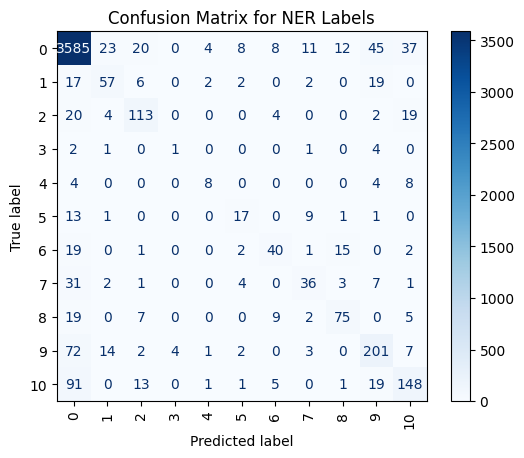


 86%|████████▌ | 4000/4650 [15:31<06:34,  1.65it/s]

{'eval_loss': 1.2063602209091187, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8578748917277728, 'eval_runtime': 1.4362, 'eval_samples_per_second': 128.813, 'eval_steps_per_second': 16.711, 'epoch': 43.0}
{'loss': 0.0051, 'grad_norm': 0.5809593796730042, 'learning_rate': 2.7956989247311828e-05, 'epoch': 43.01}


 88%|████████▊ | 4092/4650 [15:54<01:40,  5.53it/s]

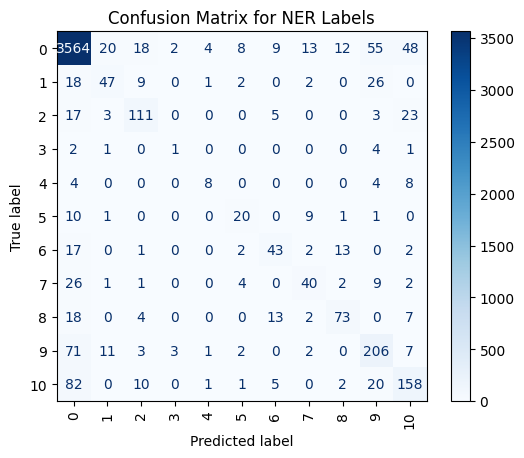


 88%|████████▊ | 4093/4650 [15:56<05:46,  1.61it/s]

{'eval_loss': 1.204048752784729, 'eval_accuracy': 0.8607416364369206, 'eval_f1': 0.8574308938417136, 'eval_runtime': 1.48, 'eval_samples_per_second': 124.998, 'eval_steps_per_second': 16.216, 'epoch': 44.0}


 90%|█████████ | 4185/4650 [16:14<01:21,  5.74it/s]

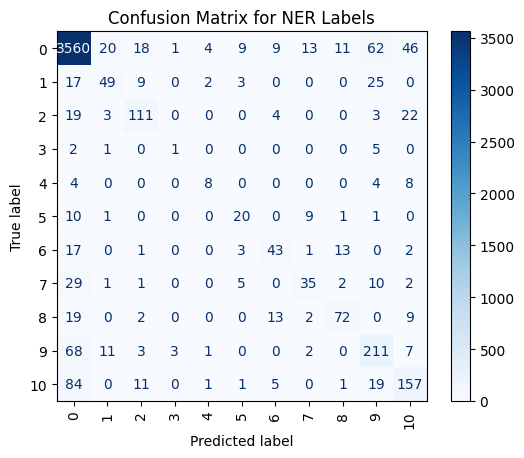


 90%|█████████ | 4186/4650 [16:16<04:38,  1.67it/s]

{'eval_loss': 1.2062911987304688, 'eval_accuracy': 0.8599355098750504, 'eval_f1': 0.8564632375402067, 'eval_runtime': 1.424, 'eval_samples_per_second': 129.915, 'eval_steps_per_second': 16.854, 'epoch': 45.0}


 92%|█████████▏| 4278/4650 [16:33<01:06,  5.58it/s]

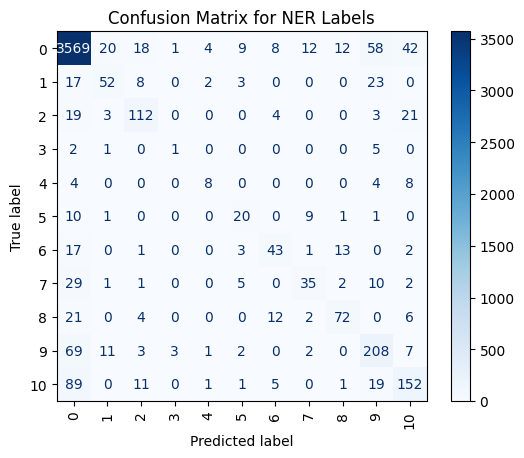


 92%|█████████▏| 4279/4650 [16:35<03:45,  1.65it/s]

{'eval_loss': 1.2106308937072754, 'eval_accuracy': 0.8609431680773881, 'eval_f1': 0.8569568177106645, 'eval_runtime': 1.4376, 'eval_samples_per_second': 128.684, 'eval_steps_per_second': 16.694, 'epoch': 46.0}


 94%|█████████▍| 4371/4650 [16:53<00:53,  5.19it/s]

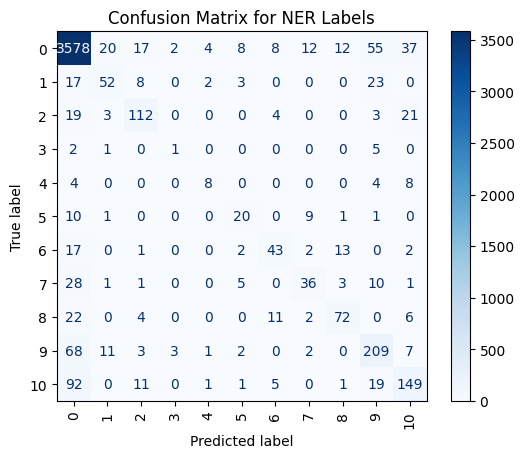


 94%|█████████▍| 4372/4650 [16:55<02:49,  1.64it/s]

{'eval_loss': 1.2211798429489136, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.858219783600357, 'eval_runtime': 1.4152, 'eval_samples_per_second': 130.724, 'eval_steps_per_second': 16.959, 'epoch': 47.0}


 96%|█████████▌| 4464/4650 [17:13<00:33,  5.62it/s]

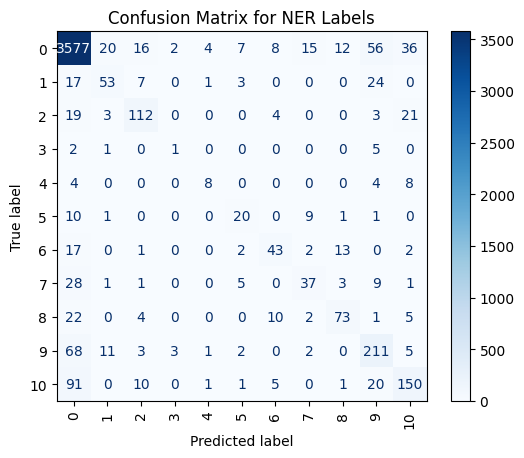


 96%|█████████▌| 4465/4650 [17:15<01:52,  1.65it/s]

{'eval_loss': 1.2306064367294312, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8593794654956391, 'eval_runtime': 1.4384, 'eval_samples_per_second': 128.615, 'eval_steps_per_second': 16.685, 'epoch': 48.0}


 97%|█████████▋| 4500/4650 [17:22<00:28,  5.31it/s]

{'loss': 0.0042, 'grad_norm': 0.2762451767921448, 'learning_rate': 6.451612903225806e-06, 'epoch': 48.39}


 98%|█████████▊| 4557/4650 [17:38<00:17,  5.31it/s]

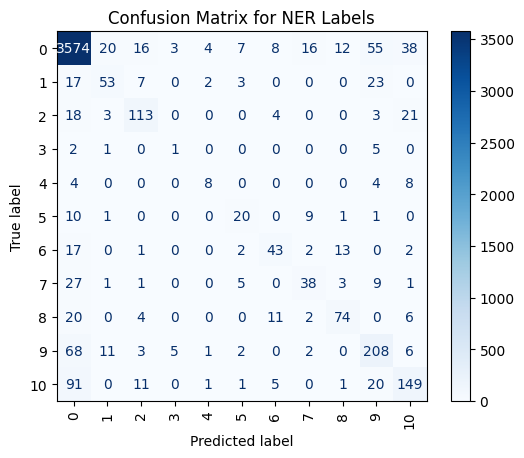


 98%|█████████▊| 4558/4650 [17:40<00:57,  1.60it/s]

{'eval_loss': 1.2262994050979614, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8589877976161259, 'eval_runtime': 1.4667, 'eval_samples_per_second': 126.134, 'eval_steps_per_second': 16.363, 'epoch': 49.0}


100%|██████████| 4650/4650 [17:58<00:00,  5.62it/s]

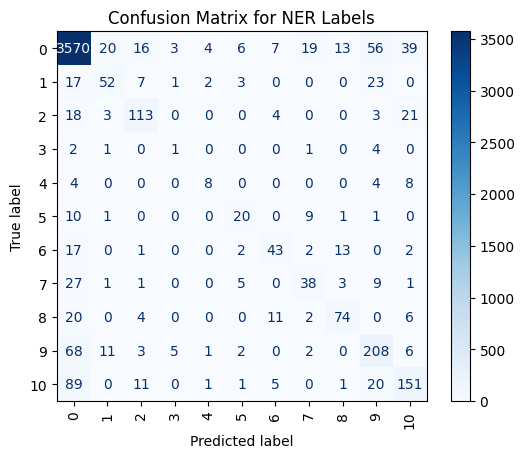


100%|██████████| 4650/4650 [18:01<00:00,  4.30it/s]


{'eval_loss': 1.224859595298767, 'eval_accuracy': 0.8621523579201935, 'eval_f1': 0.8586568790972989, 'eval_runtime': 1.4883, 'eval_samples_per_second': 124.306, 'eval_steps_per_second': 16.126, 'epoch': 50.0}
{'train_runtime': 1081.0731, 'train_samples_per_second': 34.272, 'train_steps_per_second': 4.301, 'train_loss': 0.051011253608170375, 'epoch': 50.0}


In [84]:
# Train the model
trainer.train()

# Save the model
trainer.save_model("./saved_model_gpt2_for_tokens")


In [87]:
# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=100,
    weight_decay=0.1,
    logging_dir='./logs',
)

# Define the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_sampled,
    eval_dataset=val_sampled,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)


/home/iza/Desktop/Studia/sem2/nlp/NLP_task1/.venv/lib/python3.10/site-packages/transformers/training_args.py:1545: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


  1%|          | 93/9300 [00:19<27:46,  5.53it/s]

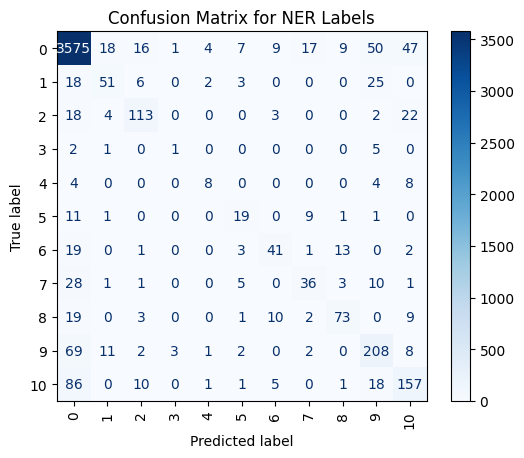


  1%|          | 94/9300 [00:20<1:34:42,  1.62it/s]

{'eval_loss': 1.324644684791565, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8590079250199136, 'eval_runtime': 1.4739, 'eval_samples_per_second': 125.521, 'eval_steps_per_second': 16.284, 'epoch': 1.0}


  2%|▏         | 186/9300 [00:39<28:02,  5.42it/s] 

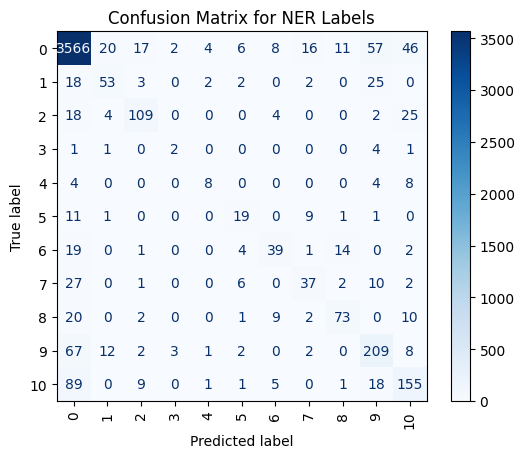


  2%|▏         | 187/9300 [00:40<1:33:56,  1.62it/s]

{'eval_loss': 1.3200349807739258, 'eval_accuracy': 0.860540104796453, 'eval_f1': 0.857067962932426, 'eval_runtime': 1.4695, 'eval_samples_per_second': 125.897, 'eval_steps_per_second': 16.333, 'epoch': 2.0}


  3%|▎         | 279/9300 [00:59<27:23,  5.49it/s]  

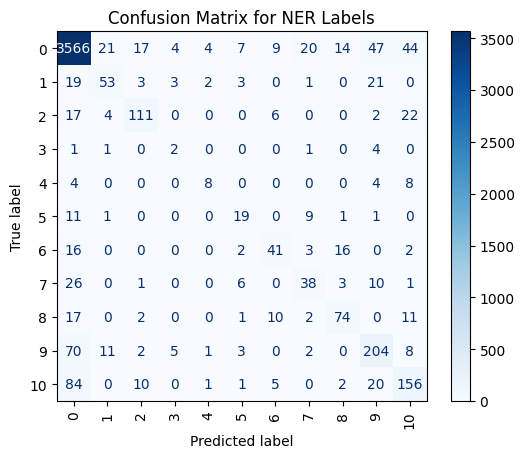


  3%|▎         | 280/9300 [01:01<1:33:04,  1.62it/s]

{'eval_loss': 1.2956485748291016, 'eval_accuracy': 0.8609431680773881, 'eval_f1': 0.8582258484021023, 'eval_runtime': 1.47, 'eval_samples_per_second': 125.853, 'eval_steps_per_second': 16.327, 'epoch': 3.0}


  4%|▍         | 372/9300 [01:19<27:11,  5.47it/s]  

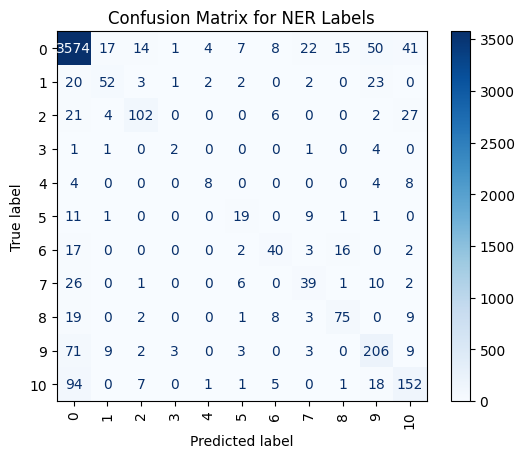


  4%|▍         | 373/9300 [01:21<1:31:58,  1.62it/s]

{'eval_loss': 1.3268482685089111, 'eval_accuracy': 0.8603385731559855, 'eval_f1': 0.8564797329086288, 'eval_runtime': 1.4681, 'eval_samples_per_second': 126.017, 'eval_steps_per_second': 16.348, 'epoch': 4.0}


  5%|▌         | 465/9300 [01:39<26:59,  5.46it/s]  

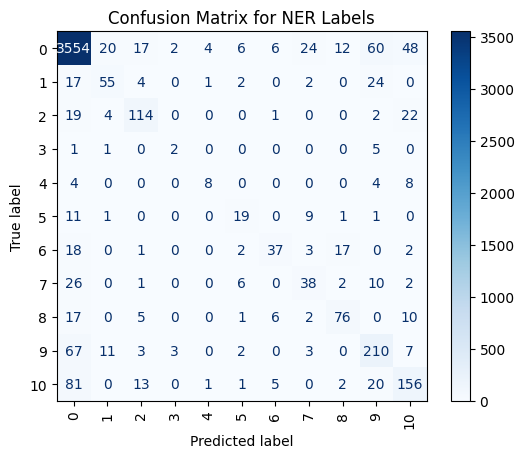


  5%|▌         | 466/9300 [01:41<1:30:31,  1.63it/s]

{'eval_loss': 1.3262590169906616, 'eval_accuracy': 0.8603385731559855, 'eval_f1': 0.857578987633532, 'eval_runtime': 1.4631, 'eval_samples_per_second': 126.447, 'eval_steps_per_second': 16.404, 'epoch': 5.0}


  5%|▌         | 500/9300 [01:48<29:19,  5.00it/s]  

{'loss': 0.0036, 'grad_norm': 0.05520854517817497, 'learning_rate': 1.89247311827957e-05, 'epoch': 5.38}


  6%|▌         | 558/9300 [02:07<26:23,  5.52it/s]  

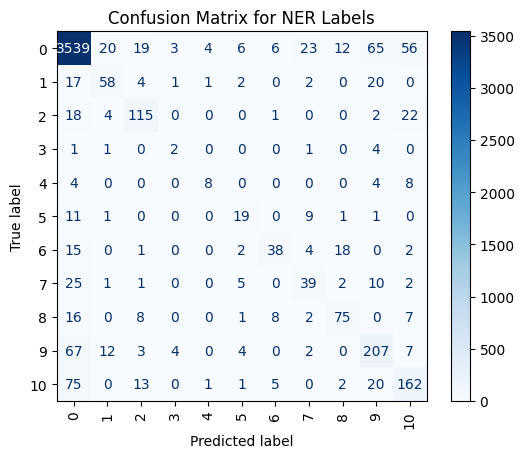


  6%|▌         | 559/9300 [02:08<1:29:12,  1.63it/s]

{'eval_loss': 1.3440485000610352, 'eval_accuracy': 0.8589278516727126, 'eval_f1': 0.8572790142972581, 'eval_runtime': 1.4517, 'eval_samples_per_second': 127.44, 'eval_steps_per_second': 16.533, 'epoch': 6.0}


  7%|▋         | 651/9300 [02:27<26:14,  5.49it/s]  

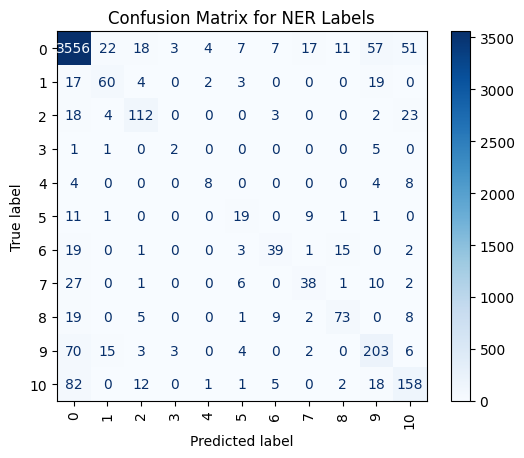


  7%|▋         | 652/9300 [02:28<1:29:08,  1.62it/s]

{'eval_loss': 1.3441393375396729, 'eval_accuracy': 0.860137041515518, 'eval_f1': 0.8573311053703709, 'eval_runtime': 1.4728, 'eval_samples_per_second': 125.614, 'eval_steps_per_second': 16.296, 'epoch': 7.0}


  8%|▊         | 744/9300 [02:47<25:57,  5.49it/s]  

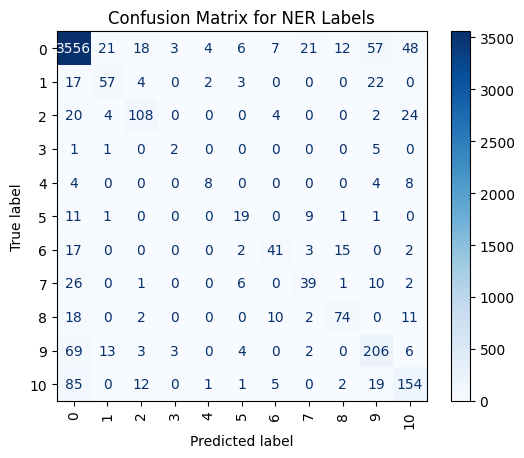


  8%|▊         | 745/9300 [02:48<1:27:42,  1.63it/s]

{'eval_loss': 1.3336328268051147, 'eval_accuracy': 0.8593309149536478, 'eval_f1': 0.8565527065509573, 'eval_runtime': 1.4628, 'eval_samples_per_second': 126.469, 'eval_steps_per_second': 16.407, 'epoch': 8.0}


  9%|▉         | 837/9300 [03:07<25:39,  5.50it/s]  

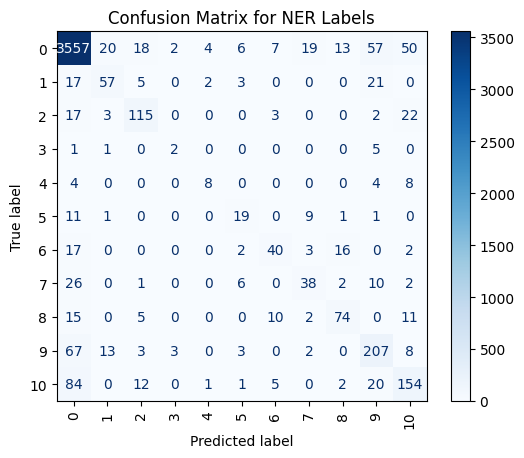


  9%|▉         | 838/9300 [03:09<1:27:35,  1.61it/s]

{'eval_loss': 1.3335081338882446, 'eval_accuracy': 0.8607416364369206, 'eval_f1': 0.8579837802974631, 'eval_runtime': 1.4828, 'eval_samples_per_second': 124.767, 'eval_steps_per_second': 16.186, 'epoch': 9.0}


 10%|█         | 930/9300 [03:27<25:26,  5.48it/s]  

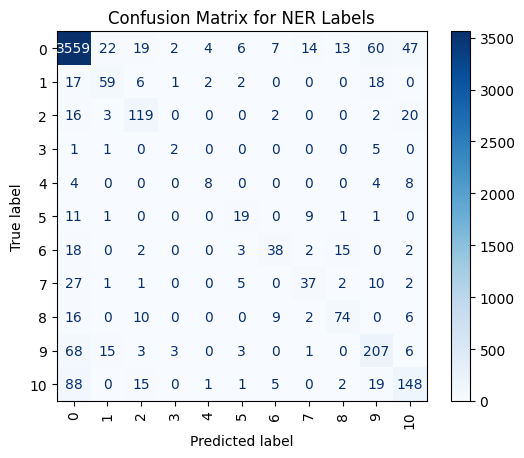


 10%|█         | 931/9300 [03:29<1:25:42,  1.63it/s]

{'eval_loss': 1.3455308675765991, 'eval_accuracy': 0.860540104796453, 'eval_f1': 0.8571851584916416, 'eval_runtime': 1.464, 'eval_samples_per_second': 126.364, 'eval_steps_per_second': 16.393, 'epoch': 10.0}


 11%|█         | 1000/9300 [03:42<27:46,  4.98it/s] 

{'loss': 0.0035, 'grad_norm': 0.0020966981537640095, 'learning_rate': 1.78494623655914e-05, 'epoch': 10.75}


 11%|█         | 1023/9300 [03:54<25:07,  5.49it/s]  

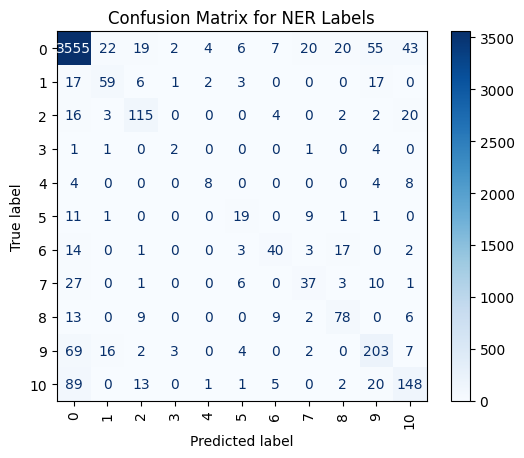


 11%|█         | 1024/9300 [03:56<1:24:24,  1.63it/s]

{'eval_loss': 1.3336740732192993, 'eval_accuracy': 0.8593309149536478, 'eval_f1': 0.8565054282211944, 'eval_runtime': 1.4502, 'eval_samples_per_second': 127.567, 'eval_steps_per_second': 16.549, 'epoch': 11.0}


 12%|█▏        | 1116/9300 [04:14<24:52,  5.48it/s]  

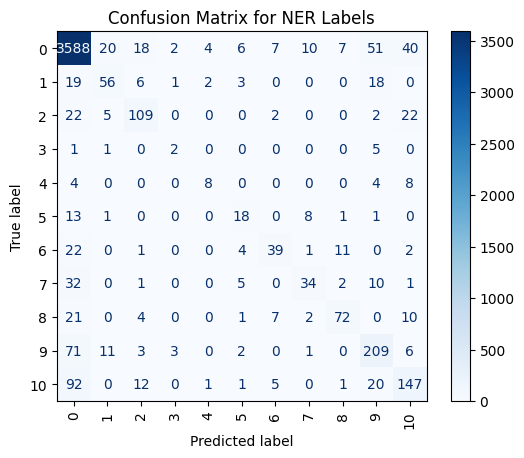


 12%|█▏        | 1117/9300 [04:16<1:23:56,  1.62it/s]

{'eval_loss': 1.3636746406555176, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8577715202540485, 'eval_runtime': 1.461, 'eval_samples_per_second': 126.624, 'eval_steps_per_second': 16.427, 'epoch': 12.0}


 13%|█▎        | 1209/9300 [04:35<24:45,  5.45it/s]  

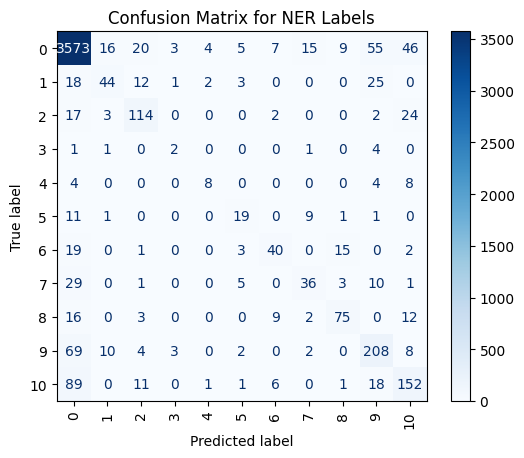


 13%|█▎        | 1210/9300 [04:36<1:32:05,  1.46it/s]

{'eval_loss': 1.331701636314392, 'eval_accuracy': 0.8607416364369206, 'eval_f1': 0.8565488833932342, 'eval_runtime': 1.6858, 'eval_samples_per_second': 109.74, 'eval_steps_per_second': 14.237, 'epoch': 13.0}


 14%|█▍        | 1302/9300 [04:55<24:18,  5.48it/s]  

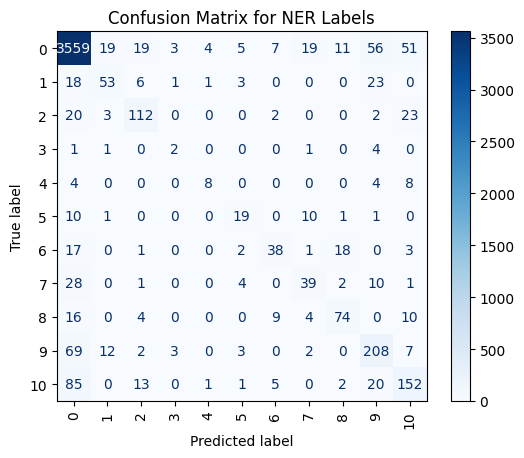


 14%|█▍        | 1303/9300 [04:56<1:21:44,  1.63it/s]

{'eval_loss': 1.3467553853988647, 'eval_accuracy': 0.8593309149536478, 'eval_f1': 0.8561484402662881, 'eval_runtime': 1.4556, 'eval_samples_per_second': 127.096, 'eval_steps_per_second': 16.488, 'epoch': 14.0}


 15%|█▌        | 1395/9300 [05:15<24:06,  5.46it/s]  

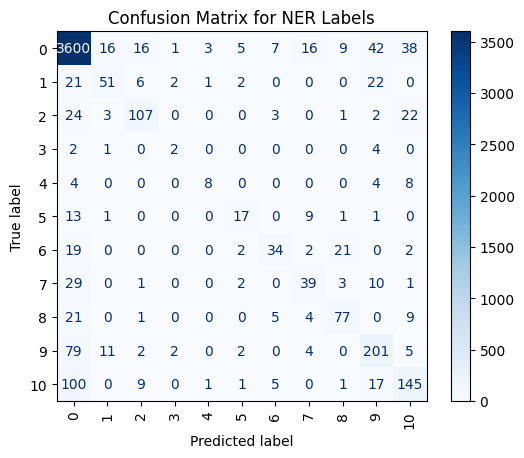


 15%|█▌        | 1396/9300 [05:16<1:20:42,  1.63it/s]

{'eval_loss': 1.3786991834640503, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8565303559592816, 'eval_runtime': 1.4534, 'eval_samples_per_second': 127.29, 'eval_steps_per_second': 16.513, 'epoch': 15.0}


 16%|█▌        | 1488/9300 [05:35<23:37,  5.51it/s]  

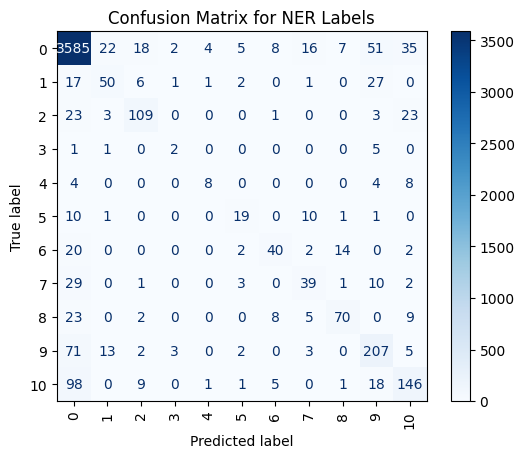


 16%|█▌        | 1489/9300 [05:36<1:20:01,  1.63it/s]

{'eval_loss': 1.373978853225708, 'eval_accuracy': 0.8615477629987908, 'eval_f1': 0.8566375549304296, 'eval_runtime': 1.4634, 'eval_samples_per_second': 126.418, 'eval_steps_per_second': 16.4, 'epoch': 16.0}


 16%|█▌        | 1500/9300 [05:39<27:05,  4.80it/s]  

{'loss': 0.0037, 'grad_norm': 0.09412695467472076, 'learning_rate': 1.6774193548387098e-05, 'epoch': 16.13}


 17%|█▋        | 1581/9300 [06:03<23:21,  5.51it/s]  

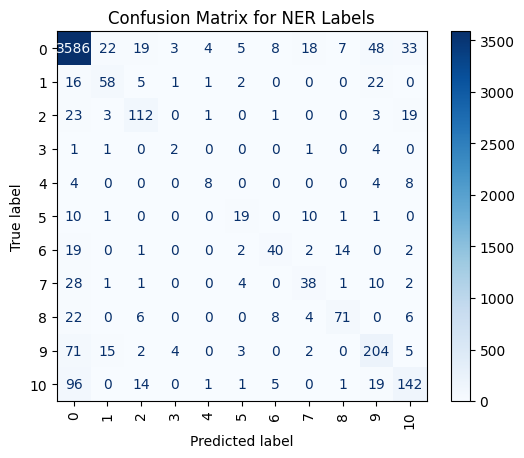


 17%|█▋        | 1582/9300 [06:05<1:18:50,  1.63it/s]

{'eval_loss': 1.3593217134475708, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8578829413230803, 'eval_runtime': 1.4567, 'eval_samples_per_second': 126.996, 'eval_steps_per_second': 16.475, 'epoch': 17.0}


 18%|█▊        | 1674/9300 [06:23<23:19,  5.45it/s]  

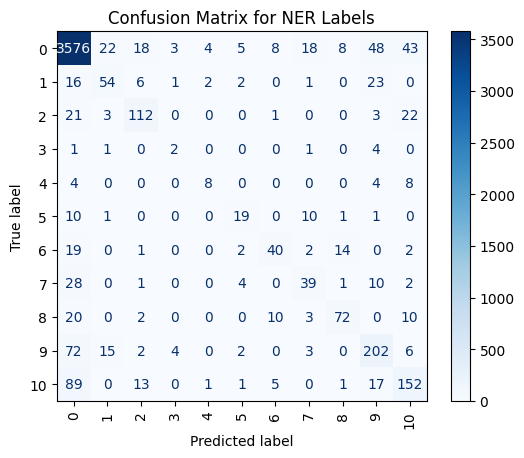


 18%|█▊        | 1675/9300 [06:25<1:18:10,  1.63it/s]

{'eval_loss': 1.3388289213180542, 'eval_accuracy': 0.8617492946392583, 'eval_f1': 0.8579107509282101, 'eval_runtime': 1.4572, 'eval_samples_per_second': 126.953, 'eval_steps_per_second': 16.47, 'epoch': 18.0}


 19%|█▉        | 1767/9300 [06:43<22:49,  5.50it/s]  

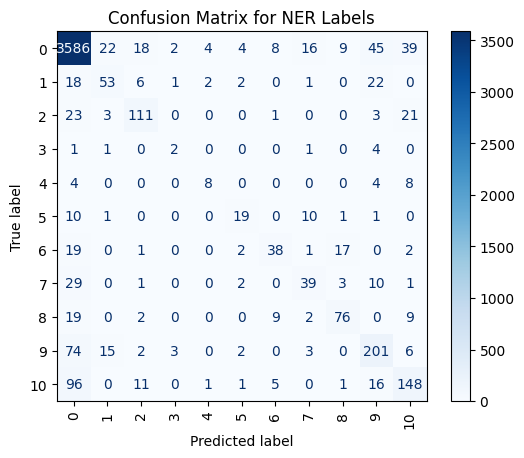


 19%|█▉        | 1768/9300 [06:45<1:17:15,  1.62it/s]

{'eval_loss': 1.3581327199935913, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8579144450033352, 'eval_runtime': 1.4639, 'eval_samples_per_second': 126.375, 'eval_steps_per_second': 16.395, 'epoch': 19.0}


 20%|██        | 1860/9300 [07:03<22:50,  5.43it/s]  

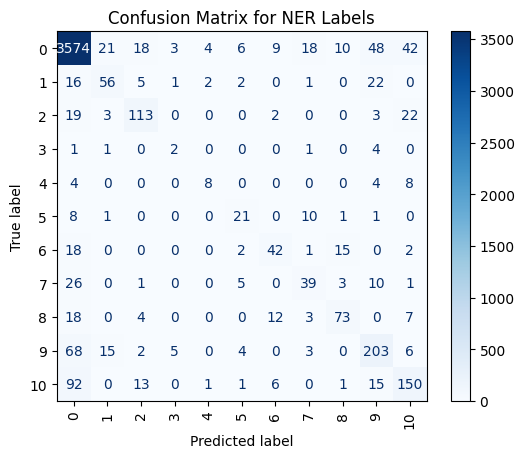


 20%|██        | 1861/9300 [07:05<1:16:22,  1.62it/s]

{'eval_loss': 1.3390254974365234, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.859400337812958, 'eval_runtime': 1.4623, 'eval_samples_per_second': 126.517, 'eval_steps_per_second': 16.413, 'epoch': 20.0}


 21%|██        | 1953/9300 [07:23<22:16,  5.50it/s]  

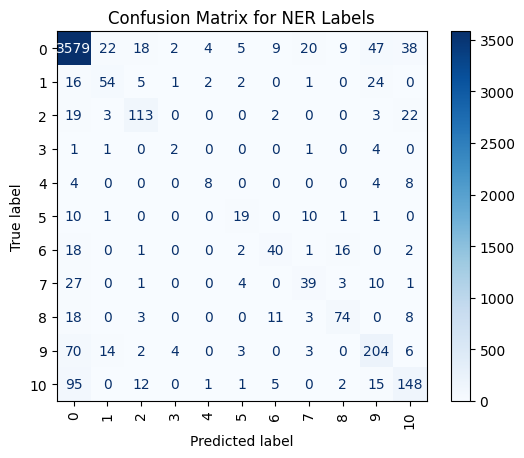


 21%|██        | 1954/9300 [07:25<1:15:04,  1.63it/s]

{'eval_loss': 1.3602535724639893, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8585489887521339, 'eval_runtime': 1.4602, 'eval_samples_per_second': 126.693, 'eval_steps_per_second': 16.436, 'epoch': 21.0}


 22%|██▏       | 2000/9300 [07:34<24:17,  5.01it/s]  

{'loss': 0.003, 'grad_norm': 0.31102877855300903, 'learning_rate': 1.5698924731182796e-05, 'epoch': 21.51}


 22%|██▏       | 2046/9300 [07:52<21:46,  5.55it/s]  

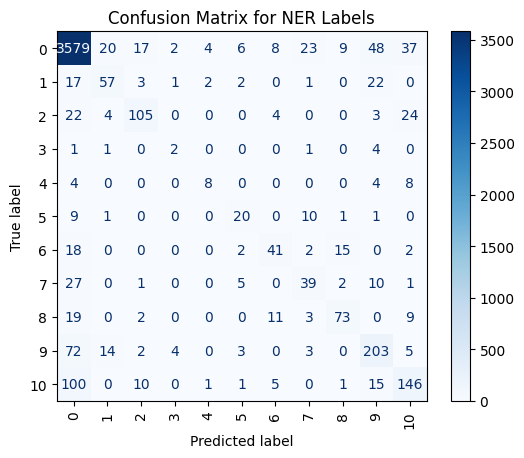


 22%|██▏       | 2047/9300 [07:54<1:14:00,  1.63it/s]

{'eval_loss': 1.3781784772872925, 'eval_accuracy': 0.8611446997178557, 'eval_f1': 0.8570500336824517, 'eval_runtime': 1.4568, 'eval_samples_per_second': 126.991, 'eval_steps_per_second': 16.475, 'epoch': 22.0}


 23%|██▎       | 2139/9300 [08:12<21:39,  5.51it/s]  

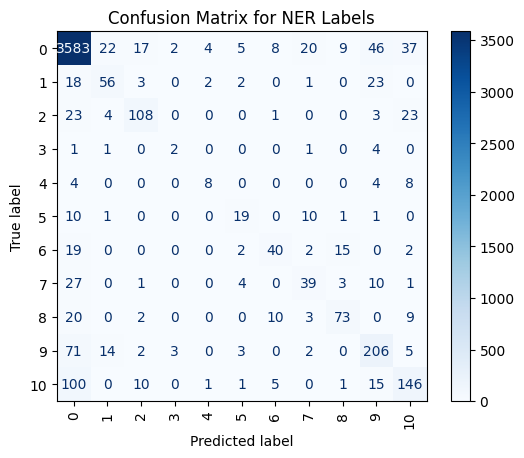


 23%|██▎       | 2140/9300 [08:14<1:13:05,  1.63it/s]

{'eval_loss': 1.3908202648162842, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8579825606323491, 'eval_runtime': 1.4502, 'eval_samples_per_second': 127.567, 'eval_steps_per_second': 16.549, 'epoch': 23.0}


 24%|██▍       | 2232/9300 [08:32<21:28,  5.48it/s]  

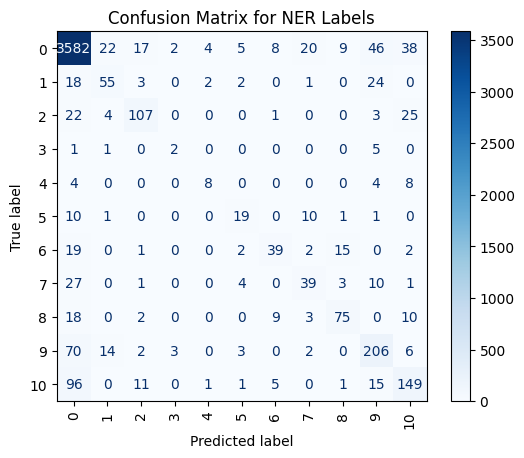


 24%|██▍       | 2233/9300 [08:34<1:12:49,  1.62it/s]

{'eval_loss': 1.3893364667892456, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8584381561853853, 'eval_runtime': 1.4694, 'eval_samples_per_second': 125.903, 'eval_steps_per_second': 16.333, 'epoch': 24.0}


 25%|██▌       | 2325/9300 [08:52<21:17,  5.46it/s]  

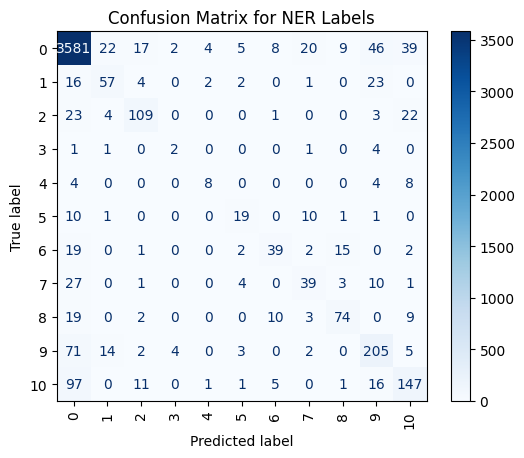


 25%|██▌       | 2326/9300 [08:54<1:11:45,  1.62it/s]

{'eval_loss': 1.3951363563537598, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8582412820330829, 'eval_runtime': 1.465, 'eval_samples_per_second': 126.282, 'eval_steps_per_second': 16.383, 'epoch': 25.0}


 26%|██▌       | 2418/9300 [09:12<20:46,  5.52it/s]  

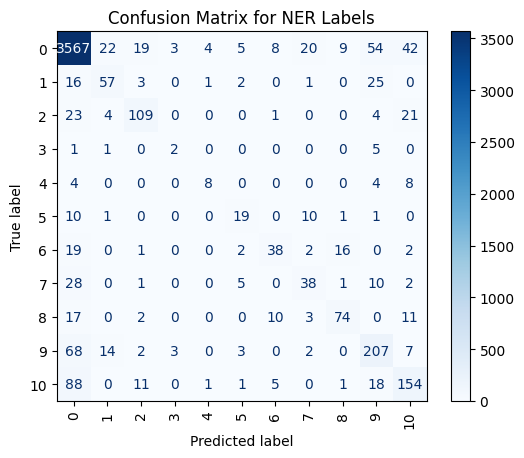


 26%|██▌       | 2419/9300 [09:14<1:18:35,  1.46it/s]

{'eval_loss': 1.4013069868087769, 'eval_accuracy': 0.8611446997178557, 'eval_f1': 0.857695531902334, 'eval_runtime': 1.7002, 'eval_samples_per_second': 108.814, 'eval_steps_per_second': 14.116, 'epoch': 26.0}


 27%|██▋       | 2500/9300 [09:30<22:38,  5.01it/s]  

{'loss': 0.0028, 'grad_norm': 0.00236801546998322, 'learning_rate': 1.4623655913978497e-05, 'epoch': 26.88}


 27%|██▋       | 2511/9300 [09:41<28:48,  3.93it/s]  

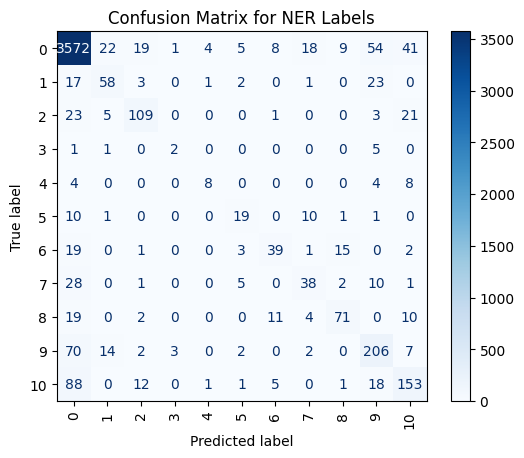


 27%|██▋       | 2512/9300 [09:43<1:14:57,  1.51it/s]

{'eval_loss': 1.4043900966644287, 'eval_accuracy': 0.8615477629987908, 'eval_f1': 0.8576983975241756, 'eval_runtime': 1.4507, 'eval_samples_per_second': 127.528, 'eval_steps_per_second': 16.544, 'epoch': 27.0}


 28%|██▊       | 2604/9300 [10:01<20:21,  5.48it/s]  

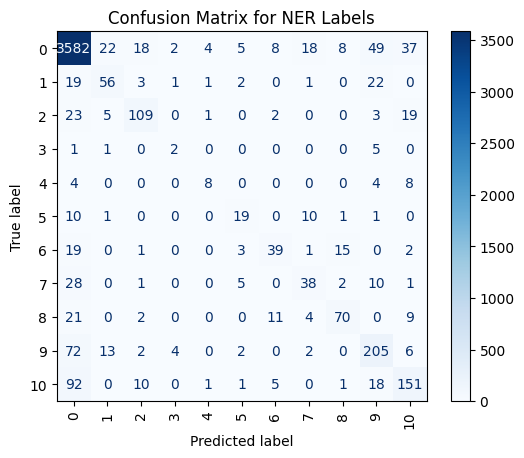


 28%|██▊       | 2605/9300 [10:03<1:08:37,  1.63it/s]

{'eval_loss': 1.4138907194137573, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.857991568318432, 'eval_runtime': 1.4613, 'eval_samples_per_second': 126.599, 'eval_steps_per_second': 16.424, 'epoch': 28.0}


 29%|██▉       | 2697/9300 [10:21<19:57,  5.52it/s]  

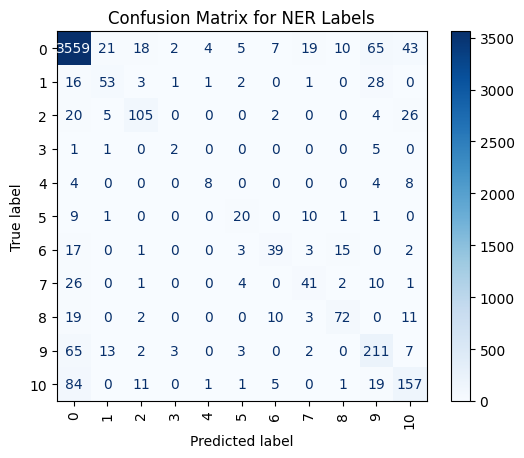


 29%|██▉       | 2698/9300 [10:23<1:07:47,  1.62it/s]

{'eval_loss': 1.4103854894638062, 'eval_accuracy': 0.8599355098750504, 'eval_f1': 0.8572017626009938, 'eval_runtime': 1.4696, 'eval_samples_per_second': 125.888, 'eval_steps_per_second': 16.331, 'epoch': 29.0}


 30%|███       | 2790/9300 [10:41<19:49,  5.47it/s]  

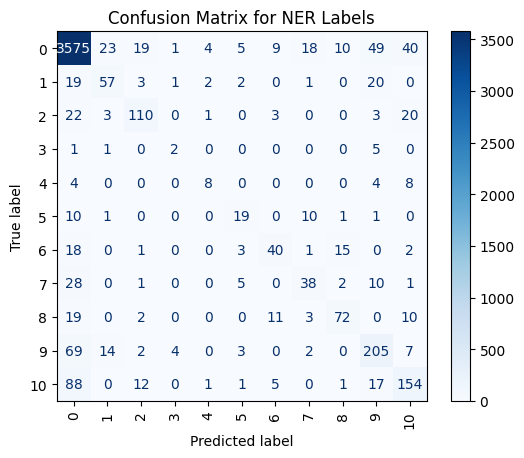


 30%|███       | 2791/9300 [10:43<1:06:35,  1.63it/s]

{'eval_loss': 1.3985257148742676, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8587822938665524, 'eval_runtime': 1.4555, 'eval_samples_per_second': 127.105, 'eval_steps_per_second': 16.489, 'epoch': 30.0}


 31%|███       | 2883/9300 [11:01<19:26,  5.50it/s]  

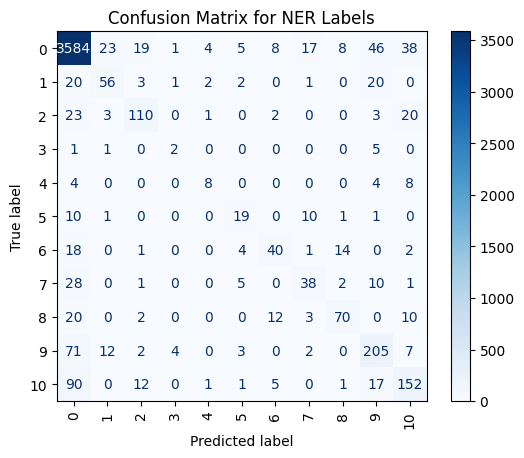


 31%|███       | 2884/9300 [11:03<1:06:04,  1.62it/s]

{'eval_loss': 1.4094198942184448, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8590472659466658, 'eval_runtime': 1.47, 'eval_samples_per_second': 125.85, 'eval_steps_per_second': 16.327, 'epoch': 31.0}


 32%|███▏      | 2976/9300 [11:21<19:21,  5.44it/s]  

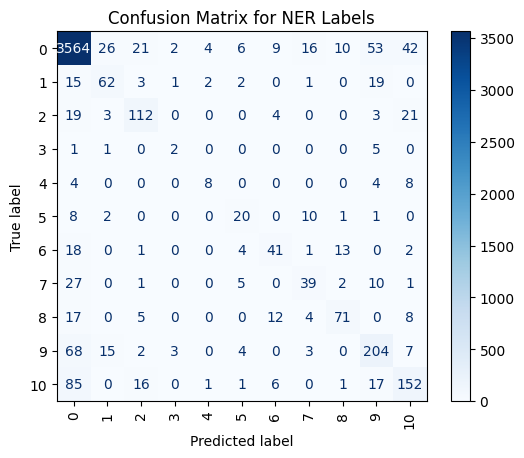


 32%|███▏      | 2977/9300 [11:23<1:05:03,  1.62it/s]

{'eval_loss': 1.4046406745910645, 'eval_accuracy': 0.8615477629987908, 'eval_f1': 0.8586823934112736, 'eval_runtime': 1.4626, 'eval_samples_per_second': 126.487, 'eval_steps_per_second': 16.409, 'epoch': 32.0}


 32%|███▏      | 3000/9300 [11:27<21:02,  4.99it/s]  

{'loss': 0.0029, 'grad_norm': 0.27805644273757935, 'learning_rate': 1.3548387096774194e-05, 'epoch': 32.26}


 33%|███▎      | 3069/9300 [11:50<18:53,  5.50it/s]  

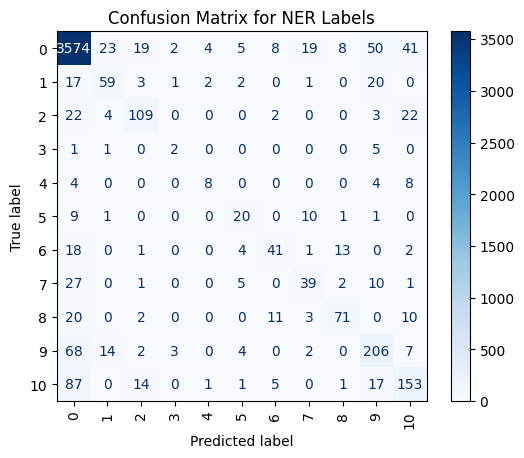


 33%|███▎      | 3070/9300 [11:51<1:03:44,  1.63it/s]

{'eval_loss': 1.419789433479309, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8594671967510568, 'eval_runtime': 1.4554, 'eval_samples_per_second': 127.11, 'eval_steps_per_second': 16.49, 'epoch': 33.0}


 34%|███▍      | 3162/9300 [12:10<18:37,  5.49it/s]  

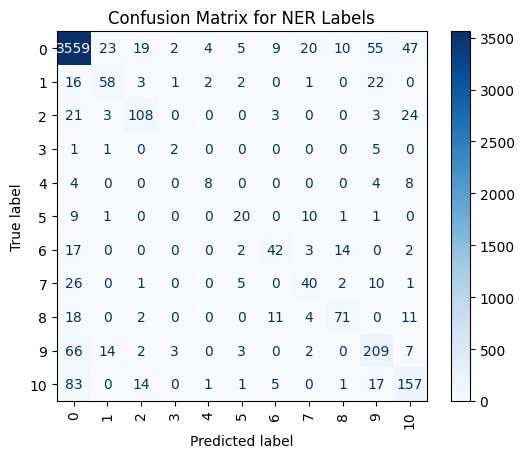


 34%|███▍      | 3163/9300 [12:11<1:02:39,  1.63it/s]

{'eval_loss': 1.4156657457351685, 'eval_accuracy': 0.8613462313583232, 'eval_f1': 0.8587594802140097, 'eval_runtime': 1.4569, 'eval_samples_per_second': 126.978, 'eval_steps_per_second': 16.473, 'epoch': 34.0}


 35%|███▌      | 3255/9300 [12:30<18:16,  5.51it/s]  

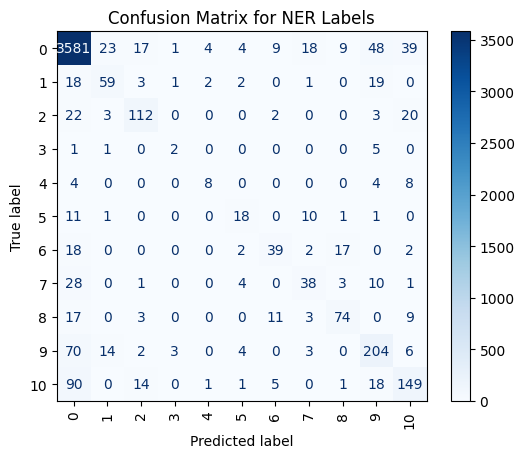


 35%|███▌      | 3256/9300 [12:31<1:01:52,  1.63it/s]

{'eval_loss': 1.4271142482757568, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8591936170484716, 'eval_runtime': 1.4623, 'eval_samples_per_second': 126.511, 'eval_steps_per_second': 16.412, 'epoch': 35.0}


 36%|███▌      | 3348/9300 [12:50<18:04,  5.49it/s]  

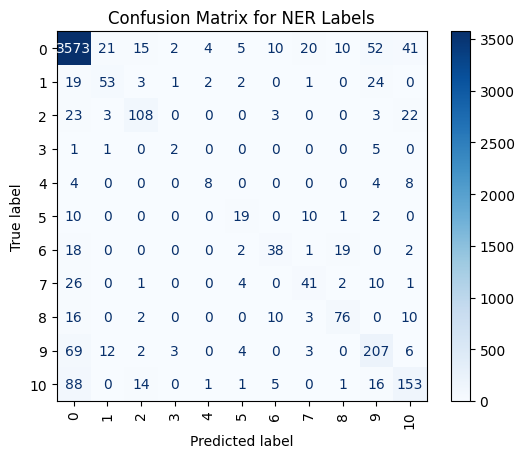


 36%|███▌      | 3349/9300 [12:51<1:01:13,  1.62it/s]

{'eval_loss': 1.434124231338501, 'eval_accuracy': 0.8621523579201935, 'eval_f1': 0.8584890314145458, 'eval_runtime': 1.4659, 'eval_samples_per_second': 126.204, 'eval_steps_per_second': 16.372, 'epoch': 36.0}


 37%|███▋      | 3441/9300 [13:10<17:58,  5.43it/s]  

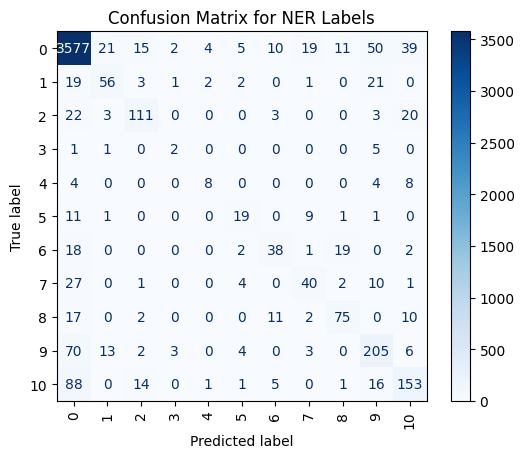


 37%|███▋      | 3442/9300 [13:12<1:00:24,  1.62it/s]

{'eval_loss': 1.4368987083435059, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8595013302064201, 'eval_runtime': 1.4648, 'eval_samples_per_second': 126.294, 'eval_steps_per_second': 16.384, 'epoch': 37.0}


 38%|███▊      | 3500/9300 [13:24<20:39,  4.68it/s]  

{'loss': 0.0026, 'grad_norm': 0.11400783807039261, 'learning_rate': 1.2473118279569894e-05, 'epoch': 37.63}


 38%|███▊      | 3534/9300 [13:38<18:21,  5.23it/s]  

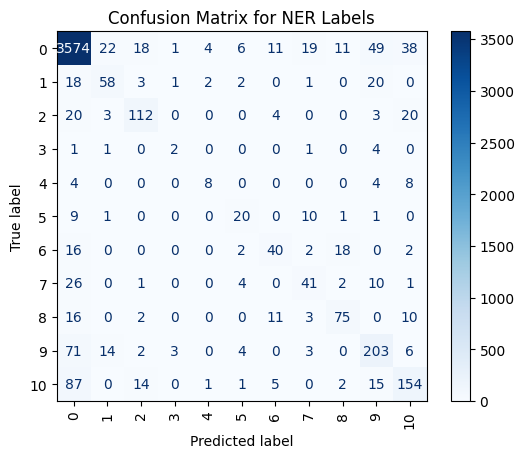


 38%|███▊      | 3535/9300 [13:40<1:01:46,  1.56it/s]

{'eval_loss': 1.4327967166900635, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8606230808231142, 'eval_runtime': 1.5228, 'eval_samples_per_second': 121.488, 'eval_steps_per_second': 15.761, 'epoch': 38.0}


 39%|███▉      | 3627/9300 [13:59<17:40,  5.35it/s]  

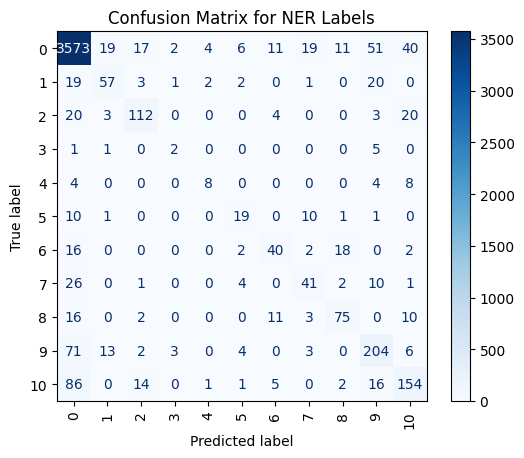


 39%|███▉      | 3628/9300 [14:01<1:06:29,  1.42it/s]

{'eval_loss': 1.4389609098434448, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8601958811219151, 'eval_runtime': 1.743, 'eval_samples_per_second': 106.141, 'eval_steps_per_second': 13.77, 'epoch': 39.0}


 40%|████      | 3720/9300 [14:20<17:21,  5.36it/s]  

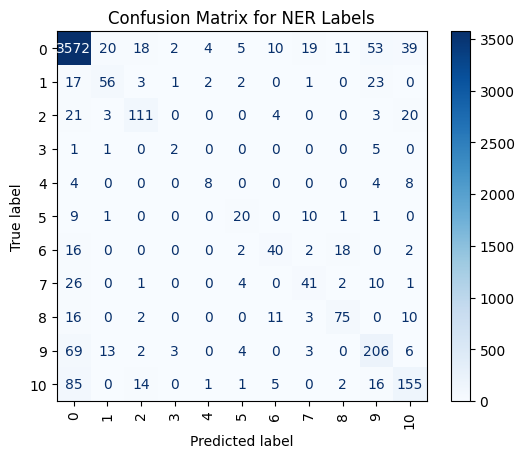


 40%|████      | 3721/9300 [14:22<58:47,  1.58it/s]

{'eval_loss': 1.4387788772583008, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8605630633639412, 'eval_runtime': 1.5057, 'eval_samples_per_second': 122.863, 'eval_steps_per_second': 15.939, 'epoch': 40.0}


 41%|████      | 3813/9300 [14:41<16:59,  5.38it/s]

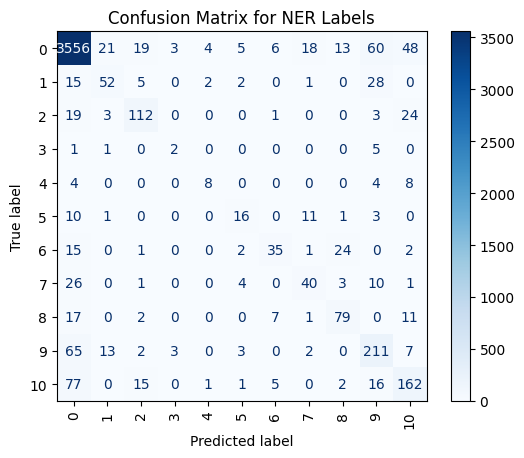


 41%|████      | 3814/9300 [14:43<58:00,  1.58it/s]

{'eval_loss': 1.454061508178711, 'eval_accuracy': 0.8611446997178557, 'eval_f1': 0.8584180746092199, 'eval_runtime': 1.5032, 'eval_samples_per_second': 123.073, 'eval_steps_per_second': 15.966, 'epoch': 41.0}


 42%|████▏     | 3906/9300 [15:02<16:51,  5.33it/s]

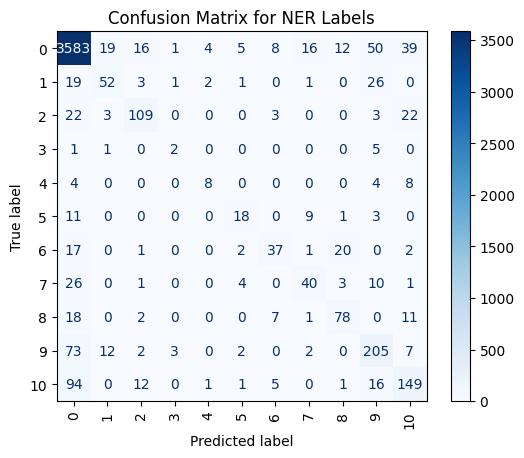


 42%|████▏     | 3907/9300 [15:04<56:14,  1.60it/s]

{'eval_loss': 1.4560903310775757, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8580891570597932, 'eval_runtime': 1.4845, 'eval_samples_per_second': 124.625, 'eval_steps_per_second': 16.168, 'epoch': 42.0}


 43%|████▎     | 3999/9300 [15:23<16:23,  5.39it/s]

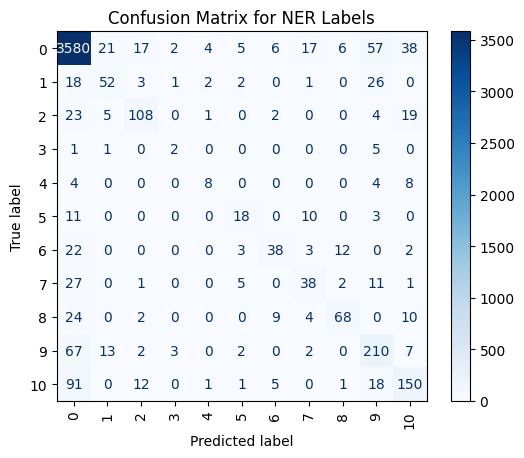


 43%|████▎     | 4000/9300 [15:24<55:28,  1.59it/s]

{'eval_loss': 1.455702543258667, 'eval_accuracy': 0.8609431680773881, 'eval_f1': 0.856498263366562, 'eval_runtime': 1.4949, 'eval_samples_per_second': 123.754, 'eval_steps_per_second': 16.055, 'epoch': 43.0}


 43%|████▎     | 4000/9300 [15:24<55:28,  1.59it/s]

{'loss': 0.0029, 'grad_norm': 0.355634480714798, 'learning_rate': 1.1397849462365593e-05, 'epoch': 43.01}


 44%|████▍     | 4092/9300 [15:51<16:08,  5.38it/s]  

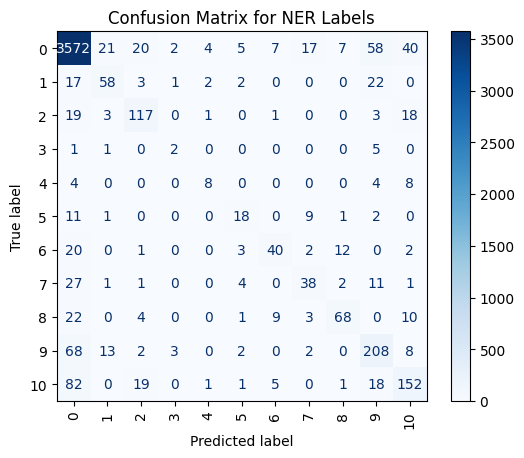


 44%|████▍     | 4093/9300 [15:53<54:37,  1.59it/s]

{'eval_loss': 1.441576600074768, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8590400518817412, 'eval_runtime': 1.5002, 'eval_samples_per_second': 123.316, 'eval_steps_per_second': 15.998, 'epoch': 44.0}


 45%|████▌     | 4185/9300 [16:12<15:49,  5.39it/s]

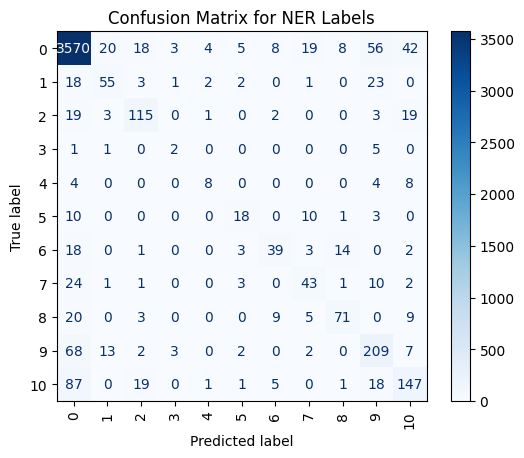


 45%|████▌     | 4186/9300 [16:13<53:42,  1.59it/s]

{'eval_loss': 1.453386902809143, 'eval_accuracy': 0.861950826279726, 'eval_f1': 0.8584457227795205, 'eval_runtime': 1.5033, 'eval_samples_per_second': 123.059, 'eval_steps_per_second': 15.964, 'epoch': 45.0}


 46%|████▌     | 4278/9300 [16:32<15:38,  5.35it/s]

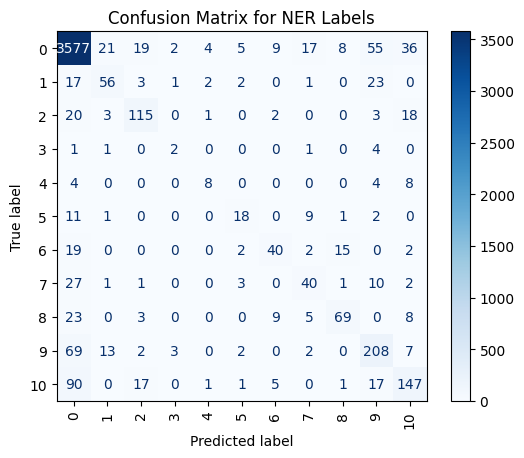


 46%|████▌     | 4279/9300 [16:34<52:59,  1.58it/s]

{'eval_loss': 1.4581513404846191, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8583696214332618, 'eval_runtime': 1.5033, 'eval_samples_per_second': 123.065, 'eval_steps_per_second': 15.965, 'epoch': 46.0}


 47%|████▋     | 4371/9300 [16:53<15:27,  5.31it/s]

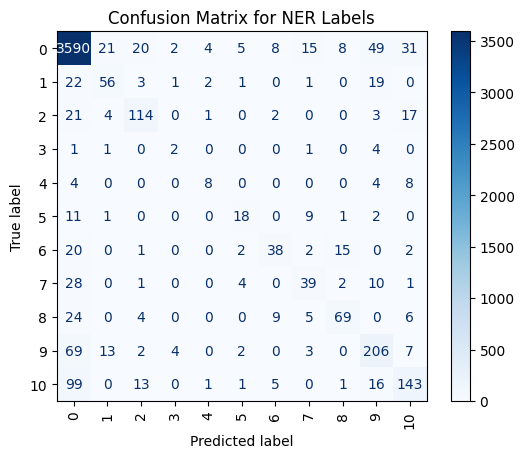


 47%|████▋     | 4372/9300 [16:55<52:32,  1.56it/s]

{'eval_loss': 1.4765559434890747, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8579317611223459, 'eval_runtime': 1.5257, 'eval_samples_per_second': 121.254, 'eval_steps_per_second': 15.73, 'epoch': 47.0}


 48%|████▊     | 4464/9300 [17:14<14:46,  5.46it/s]

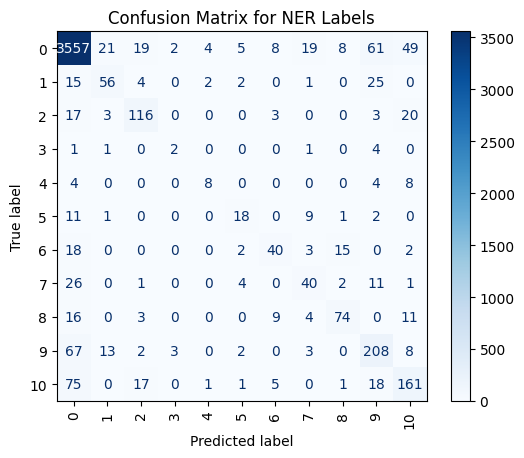


 48%|████▊     | 4465/9300 [17:16<49:55,  1.61it/s]

{'eval_loss': 1.46477210521698, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8601613646201878, 'eval_runtime': 1.4722, 'eval_samples_per_second': 125.665, 'eval_steps_per_second': 16.303, 'epoch': 48.0}


 48%|████▊     | 4500/9300 [17:23<16:48,  4.76it/s]

{'loss': 0.0029, 'grad_norm': 0.26687195897102356, 'learning_rate': 1.0322580645161291e-05, 'epoch': 48.39}


 49%|████▉     | 4557/9300 [17:44<14:45,  5.35it/s]  

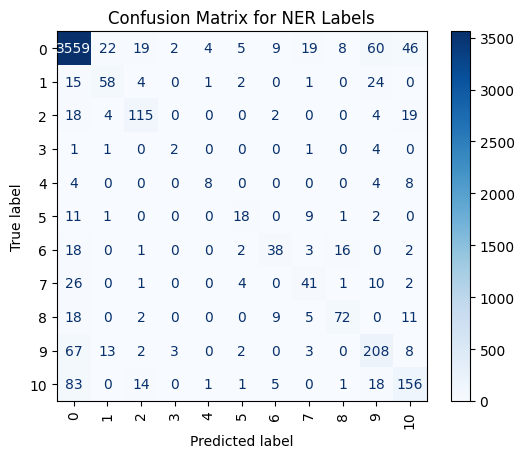


 49%|████▉     | 4558/9300 [17:45<50:05,  1.58it/s]

{'eval_loss': 1.4711639881134033, 'eval_accuracy': 0.8615477629987908, 'eval_f1': 0.8587247758655143, 'eval_runtime': 1.5095, 'eval_samples_per_second': 122.559, 'eval_steps_per_second': 15.899, 'epoch': 49.0}


 50%|█████     | 4650/9300 [18:04<14:19,  5.41it/s]

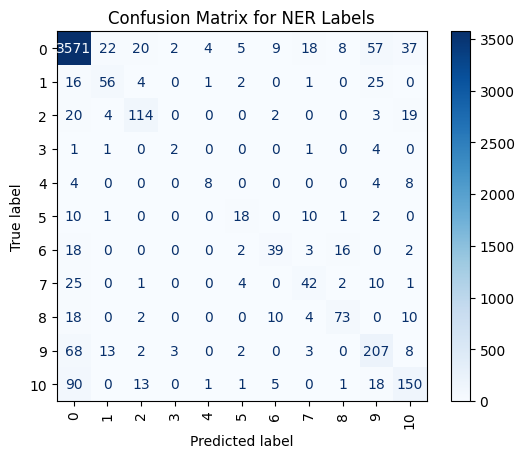


 50%|█████     | 4651/9300 [18:06<48:40,  1.59it/s]

{'eval_loss': 1.4764437675476074, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8590112037398238, 'eval_runtime': 1.4957, 'eval_samples_per_second': 123.689, 'eval_steps_per_second': 16.046, 'epoch': 50.0}


 51%|█████     | 4743/9300 [18:25<14:19,  5.30it/s]

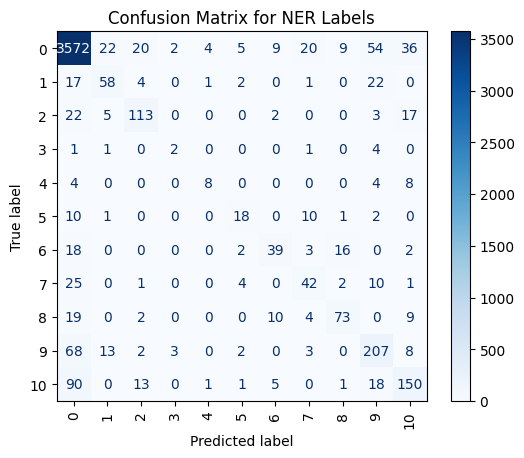


 51%|█████     | 4744/9300 [18:27<48:10,  1.58it/s]

{'eval_loss': 1.477136254310608, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8593169115327931, 'eval_runtime': 1.512, 'eval_samples_per_second': 122.355, 'eval_steps_per_second': 15.873, 'epoch': 51.0}


 52%|█████▏    | 4836/9300 [18:46<13:56,  5.34it/s]

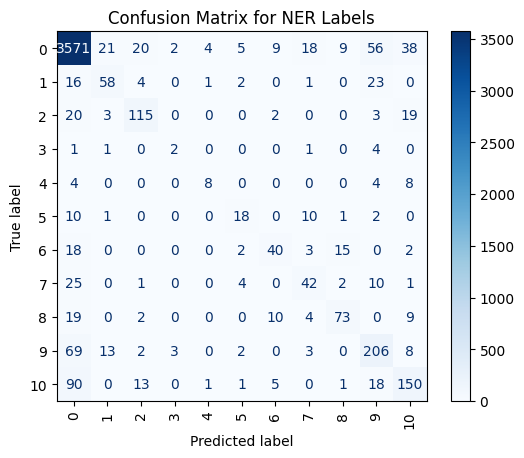


 52%|█████▏    | 4837/9300 [18:48<47:22,  1.57it/s]

{'eval_loss': 1.4743932485580444, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8595946183404739, 'eval_runtime': 1.5173, 'eval_samples_per_second': 121.927, 'eval_steps_per_second': 15.818, 'epoch': 52.0}


 53%|█████▎    | 4929/9300 [19:07<13:35,  5.36it/s]

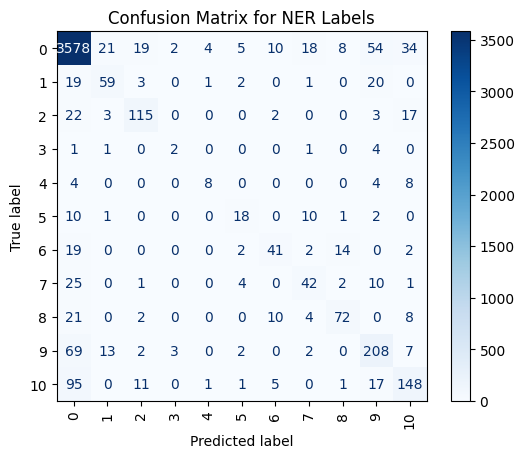


 53%|█████▎    | 4930/9300 [19:09<51:40,  1.41it/s]

{'eval_loss': 1.4960845708847046, 'eval_accuracy': 0.8647722692462717, 'eval_f1': 0.8606226870053187, 'eval_runtime': 1.7579, 'eval_samples_per_second': 105.239, 'eval_steps_per_second': 13.653, 'epoch': 53.0}


 54%|█████▍    | 5000/9300 [19:23<14:39,  4.89it/s]

{'loss': 0.0031, 'grad_norm': 0.1201808825135231, 'learning_rate': 9.24731182795699e-06, 'epoch': 53.76}


 54%|█████▍    | 5022/9300 [19:37<13:50,  5.15it/s]  

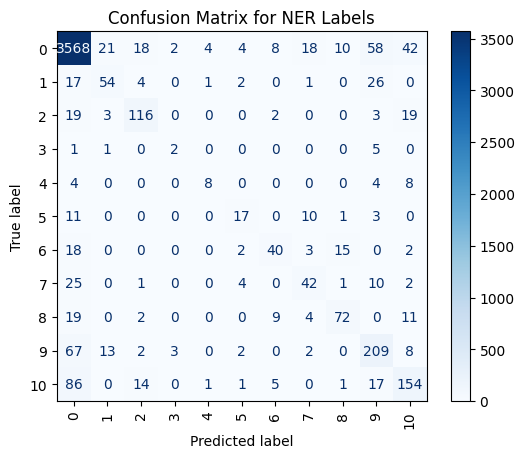


 54%|█████▍    | 5023/9300 [19:38<46:19,  1.54it/s]

{'eval_loss': 1.4626524448394775, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8595442680010026, 'eval_runtime': 1.5461, 'eval_samples_per_second': 119.654, 'eval_steps_per_second': 15.523, 'epoch': 54.0}


 55%|█████▌    | 5115/9300 [19:57<12:54,  5.40it/s]

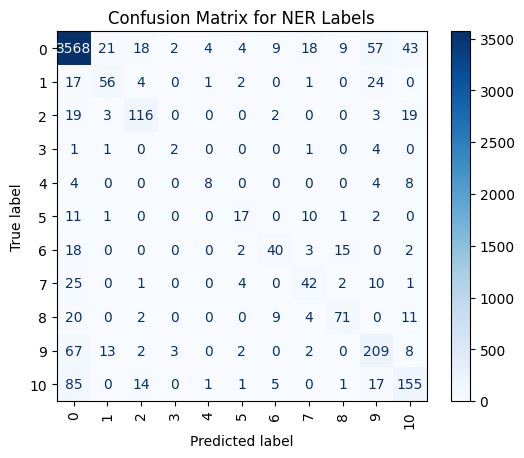


 55%|█████▌    | 5116/9300 [19:59<43:35,  1.60it/s]

{'eval_loss': 1.4598685503005981, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8600005100340703, 'eval_runtime': 1.4842, 'eval_samples_per_second': 124.647, 'eval_steps_per_second': 16.17, 'epoch': 55.0}


 56%|█████▌    | 5208/9300 [20:18<12:48,  5.33it/s]

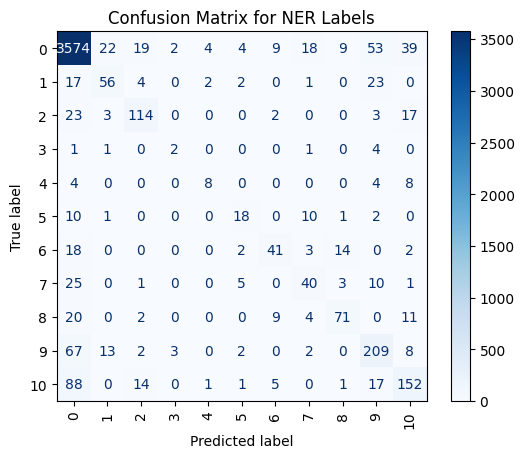


 56%|█████▌    | 5209/9300 [20:20<43:08,  1.58it/s]

{'eval_loss': 1.4582549333572388, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8598381945317326, 'eval_runtime': 1.5013, 'eval_samples_per_second': 123.223, 'eval_steps_per_second': 15.986, 'epoch': 56.0}


 57%|█████▋    | 5301/9300 [20:39<12:25,  5.37it/s]

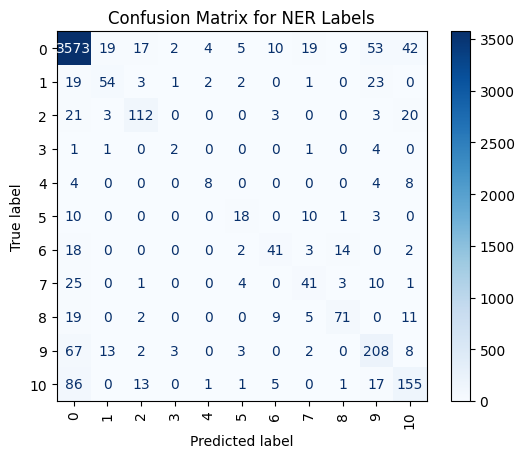


 57%|█████▋    | 5302/9300 [20:40<41:45,  1.60it/s]

{'eval_loss': 1.4653043746948242, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8597081179014433, 'eval_runtime': 1.492, 'eval_samples_per_second': 123.994, 'eval_steps_per_second': 16.086, 'epoch': 57.0}


 58%|█████▊    | 5394/9300 [21:00<12:10,  5.35it/s]

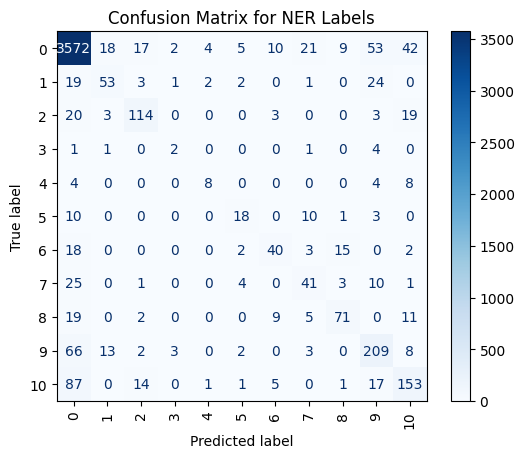


 58%|█████▊    | 5395/9300 [21:01<40:38,  1.60it/s]

{'eval_loss': 1.4698503017425537, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8592898789501936, 'eval_runtime': 1.4804, 'eval_samples_per_second': 124.963, 'eval_steps_per_second': 16.211, 'epoch': 58.0}


 59%|█████▉    | 5487/9300 [21:20<11:57,  5.31it/s]

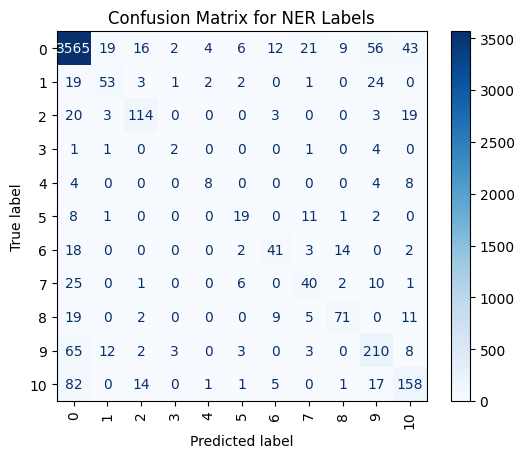


 59%|█████▉    | 5488/9300 [21:22<40:09,  1.58it/s]

{'eval_loss': 1.471419095993042, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8599509104663648, 'eval_runtime': 1.4987, 'eval_samples_per_second': 123.442, 'eval_steps_per_second': 16.014, 'epoch': 59.0}


 59%|█████▉    | 5500/9300 [21:25<13:42,  4.62it/s]

{'loss': 0.0029, 'grad_norm': 0.03236575797200203, 'learning_rate': 8.172043010752689e-06, 'epoch': 59.14}


 60%|██████    | 5580/9300 [21:50<11:31,  5.38it/s]  

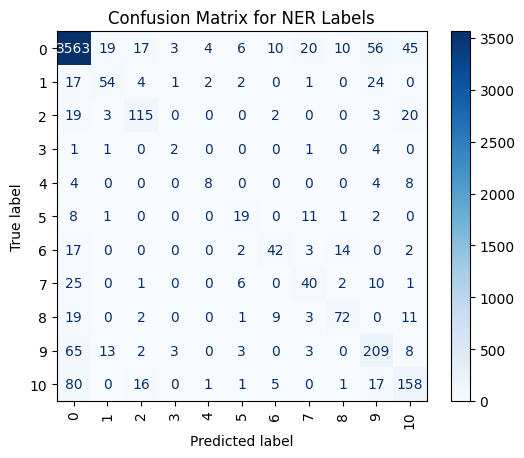


 60%|██████    | 5581/9300 [21:52<38:55,  1.59it/s]

{'eval_loss': 1.4725638628005981, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8603981692578346, 'eval_runtime': 1.4909, 'eval_samples_per_second': 124.09, 'eval_steps_per_second': 16.098, 'epoch': 60.0}


 61%|██████    | 5673/9300 [22:11<11:16,  5.36it/s]

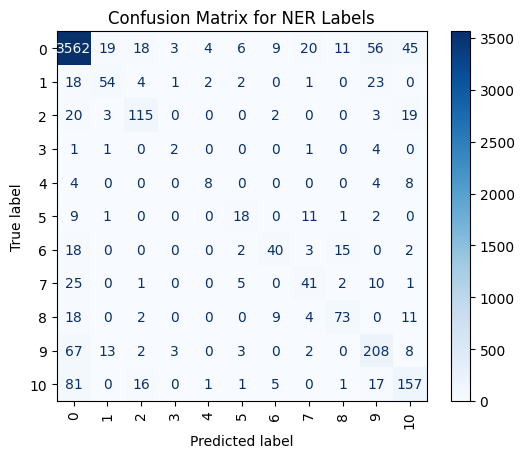


 61%|██████    | 5674/9300 [22:13<38:06,  1.59it/s]

{'eval_loss': 1.4760823249816895, 'eval_accuracy': 0.8621523579201935, 'eval_f1': 0.859337677729768, 'eval_runtime': 1.5024, 'eval_samples_per_second': 123.138, 'eval_steps_per_second': 15.975, 'epoch': 61.0}


 62%|██████▏   | 5766/9300 [22:32<10:53,  5.41it/s]

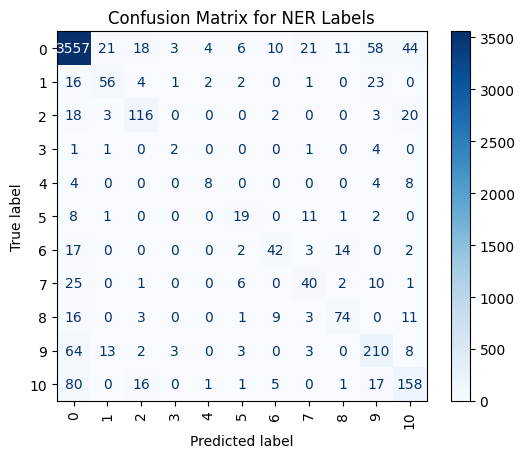


 62%|██████▏   | 5767/9300 [22:33<38:24,  1.53it/s]

{'eval_loss': 1.4699152708053589, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8607966451195755, 'eval_runtime': 1.5759, 'eval_samples_per_second': 117.391, 'eval_steps_per_second': 15.229, 'epoch': 62.0}


 63%|██████▎   | 5859/9300 [22:53<10:41,  5.37it/s]

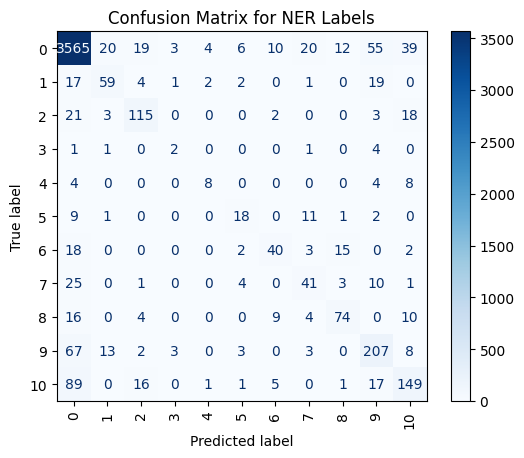


 63%|██████▎   | 5860/9300 [22:54<35:47,  1.60it/s]

{'eval_loss': 1.4741910696029663, 'eval_accuracy': 0.8621523579201935, 'eval_f1': 0.858993162875504, 'eval_runtime': 1.4882, 'eval_samples_per_second': 124.313, 'eval_steps_per_second': 16.127, 'epoch': 63.0}


 64%|██████▍   | 5952/9300 [23:14<10:28,  5.33it/s]

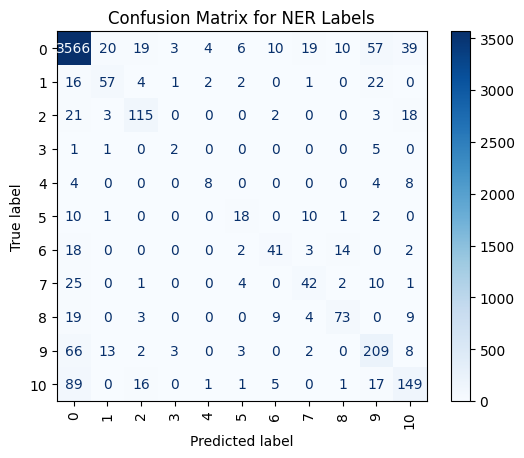


 64%|██████▍   | 5953/9300 [23:15<35:14,  1.58it/s]

{'eval_loss': 1.473625898361206, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.859281487040453, 'eval_runtime': 1.503, 'eval_samples_per_second': 123.083, 'eval_steps_per_second': 15.968, 'epoch': 64.0}


 65%|██████▍   | 6000/9300 [23:25<11:38,  4.72it/s]

{'loss': 0.0029, 'grad_norm': 0.0008891824400052428, 'learning_rate': 7.096774193548388e-06, 'epoch': 64.52}


 65%|██████▌   | 6045/9300 [23:43<10:26,  5.20it/s]  

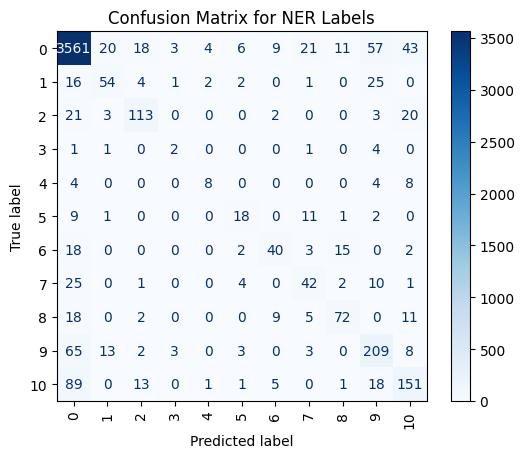


 65%|██████▌   | 6046/9300 [23:45<34:37,  1.57it/s]

{'eval_loss': 1.480323314666748, 'eval_accuracy': 0.860540104796453, 'eval_f1': 0.8576032646965187, 'eval_runtime': 1.5153, 'eval_samples_per_second': 122.084, 'eval_steps_per_second': 15.838, 'epoch': 65.0}


 66%|██████▌   | 6138/9300 [24:04<09:51,  5.35it/s]

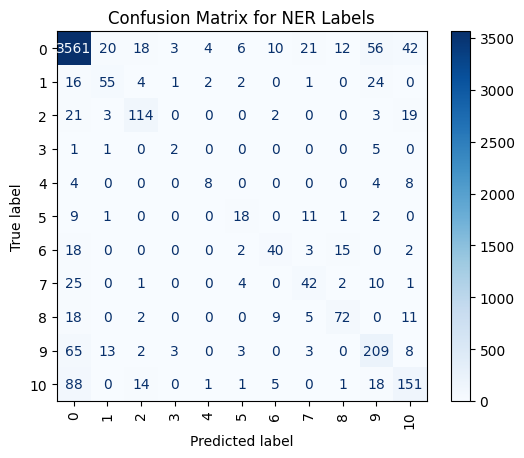


 66%|██████▌   | 6139/9300 [24:06<37:00,  1.42it/s]

{'eval_loss': 1.4730082750320435, 'eval_accuracy': 0.8609431680773881, 'eval_f1': 0.8580159721886161, 'eval_runtime': 1.7387, 'eval_samples_per_second': 106.399, 'eval_steps_per_second': 13.803, 'epoch': 66.0}


 67%|██████▋   | 6231/9300 [24:25<09:33,  5.35it/s]

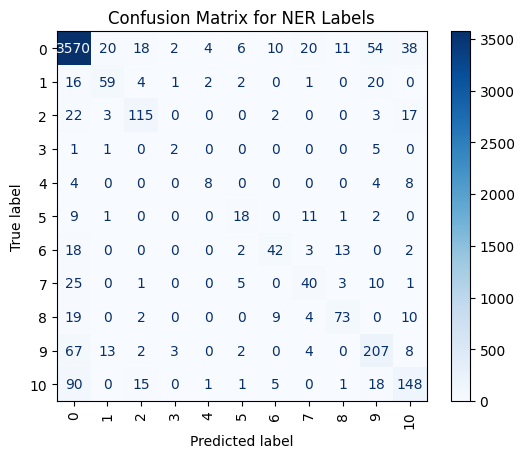


 67%|██████▋   | 6232/9300 [24:27<32:24,  1.58it/s]

{'eval_loss': 1.471784234046936, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8595359897823824, 'eval_runtime': 1.5082, 'eval_samples_per_second': 122.666, 'eval_steps_per_second': 15.913, 'epoch': 67.0}


 68%|██████▊   | 6324/9300 [24:46<09:13,  5.38it/s]

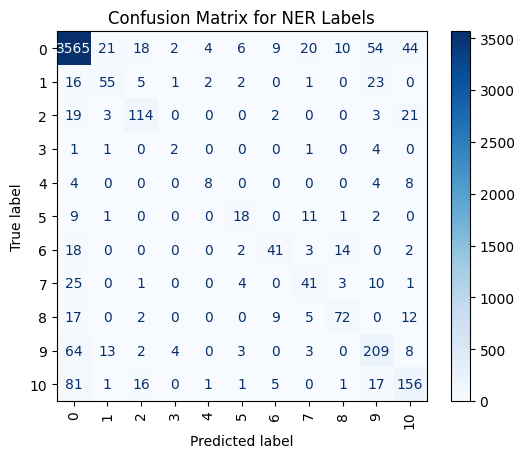


 68%|██████▊   | 6325/9300 [24:48<31:02,  1.60it/s]

{'eval_loss': 1.4677273035049438, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8601100899914352, 'eval_runtime': 1.4854, 'eval_samples_per_second': 124.545, 'eval_steps_per_second': 16.157, 'epoch': 68.0}


 69%|██████▉   | 6417/9300 [25:07<08:59,  5.34it/s]

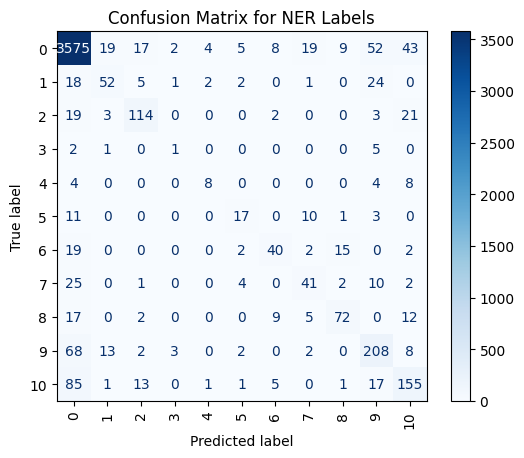


 69%|██████▉   | 6418/9300 [25:09<30:22,  1.58it/s]

{'eval_loss': 1.474421501159668, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8594844603245976, 'eval_runtime': 1.5091, 'eval_samples_per_second': 122.592, 'eval_steps_per_second': 15.904, 'epoch': 69.0}


 70%|██████▉   | 6500/9300 [25:26<09:33,  4.88it/s]

{'loss': 0.0029, 'grad_norm': 0.0036584818735718727, 'learning_rate': 6.021505376344087e-06, 'epoch': 69.89}


 70%|███████   | 6510/9300 [25:37<13:46,  3.38it/s]  

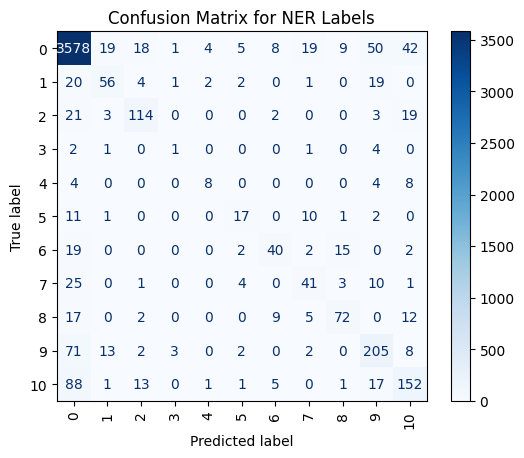


 70%|███████   | 6511/9300 [25:38<33:15,  1.40it/s]

{'eval_loss': 1.4777525663375854, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8593062213138019, 'eval_runtime': 1.5284, 'eval_samples_per_second': 121.045, 'eval_steps_per_second': 15.703, 'epoch': 70.0}


 71%|███████   | 6603/9300 [25:57<08:19,  5.40it/s]

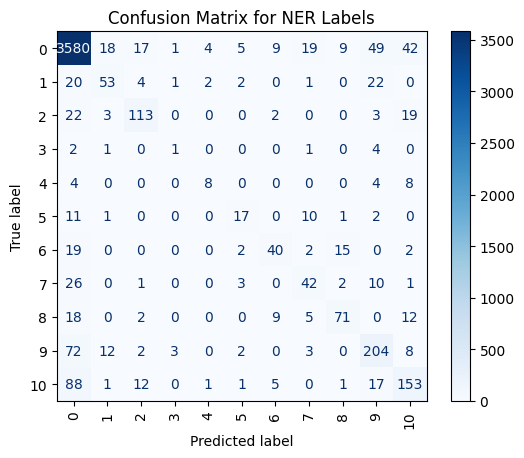


 71%|███████   | 6604/9300 [25:59<28:01,  1.60it/s]

{'eval_loss': 1.482955813407898, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8587198286753298, 'eval_runtime': 1.4868, 'eval_samples_per_second': 124.43, 'eval_steps_per_second': 16.142, 'epoch': 71.0}


 72%|███████▏  | 6696/9300 [26:18<08:08,  5.33it/s]

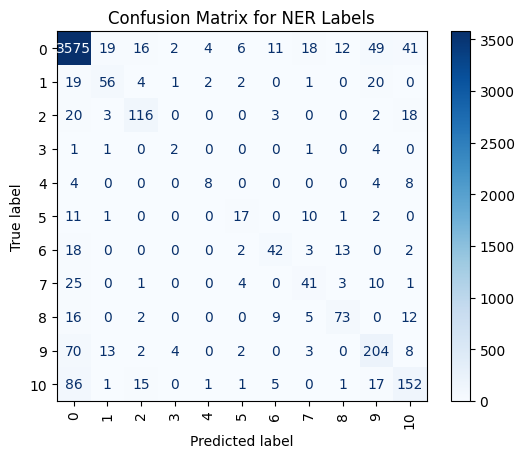


 72%|███████▏  | 6697/9300 [26:20<27:27,  1.58it/s]

{'eval_loss': 1.4735876321792603, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8602636238529323, 'eval_runtime': 1.5093, 'eval_samples_per_second': 122.569, 'eval_steps_per_second': 15.901, 'epoch': 72.0}


 73%|███████▎  | 6789/9300 [26:39<07:47,  5.37it/s]

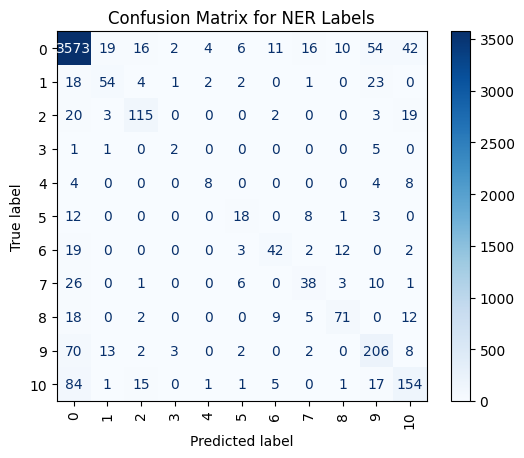


 73%|███████▎  | 6790/9300 [26:41<26:21,  1.59it/s]

{'eval_loss': 1.47563636302948, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8591285005023275, 'eval_runtime': 1.4983, 'eval_samples_per_second': 123.476, 'eval_steps_per_second': 16.019, 'epoch': 73.0}


 74%|███████▍  | 6882/9300 [27:00<07:30,  5.37it/s]

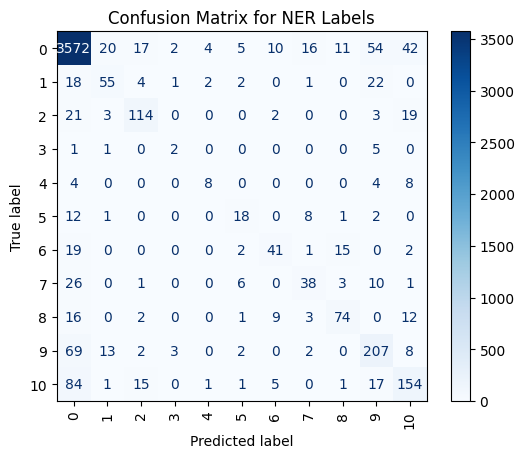


 74%|███████▍  | 6883/9300 [27:01<25:22,  1.59it/s]

{'eval_loss': 1.474353313446045, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8595611993740653, 'eval_runtime': 1.4966, 'eval_samples_per_second': 123.612, 'eval_steps_per_second': 16.036, 'epoch': 74.0}


 75%|███████▌  | 6975/9300 [27:20<07:12,  5.38it/s]

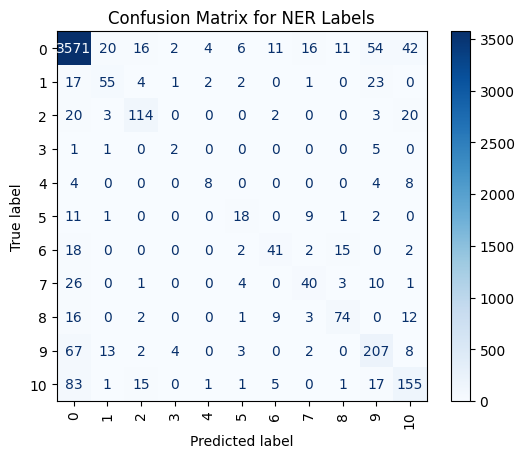


 75%|███████▌  | 6976/9300 [27:22<24:15,  1.60it/s]

{'eval_loss': 1.4768604040145874, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8603454451155793, 'eval_runtime': 1.4926, 'eval_samples_per_second': 123.942, 'eval_steps_per_second': 16.079, 'epoch': 75.0}


 75%|███████▌  | 7000/9300 [27:27<08:10,  4.69it/s]

{'loss': 0.0028, 'grad_norm': 0.32366660237312317, 'learning_rate': 4.946236559139785e-06, 'epoch': 75.27}


 76%|███████▌  | 7068/9300 [27:49<06:59,  5.32it/s]  

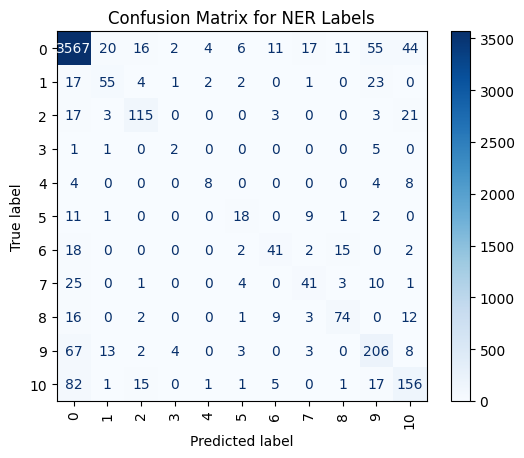


 76%|███████▌  | 7069/9300 [27:51<23:38,  1.57it/s]

{'eval_loss': 1.4795596599578857, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8602826306067064, 'eval_runtime': 1.5122, 'eval_samples_per_second': 122.338, 'eval_steps_per_second': 15.871, 'epoch': 76.0}


 77%|███████▋  | 7161/9300 [28:10<06:32,  5.45it/s]

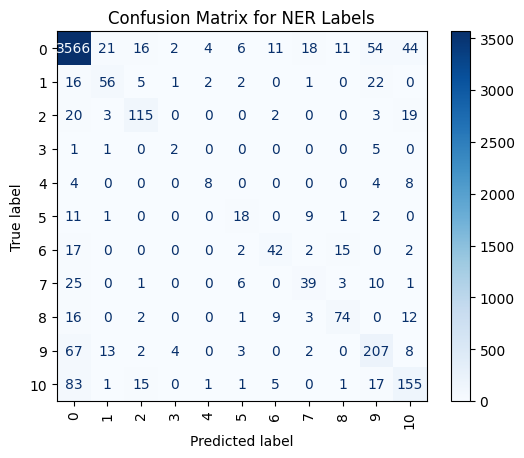


 77%|███████▋  | 7162/9300 [28:11<22:11,  1.61it/s]

{'eval_loss': 1.4828211069107056, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8600431551733208, 'eval_runtime': 1.4848, 'eval_samples_per_second': 124.593, 'eval_steps_per_second': 16.163, 'epoch': 77.0}


 78%|███████▊  | 7254/9300 [28:31<06:22,  5.35it/s]

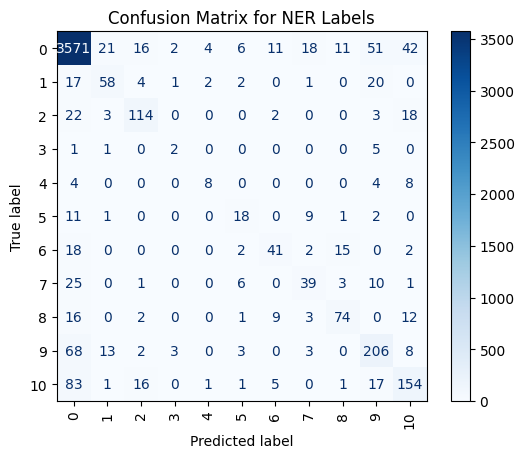


 78%|███████▊  | 7255/9300 [28:32<21:23,  1.59it/s]

{'eval_loss': 1.4845142364501953, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8603153694488226, 'eval_runtime': 1.4899, 'eval_samples_per_second': 124.173, 'eval_steps_per_second': 16.109, 'epoch': 78.0}


 79%|███████▉  | 7347/9300 [28:51<06:04,  5.36it/s]

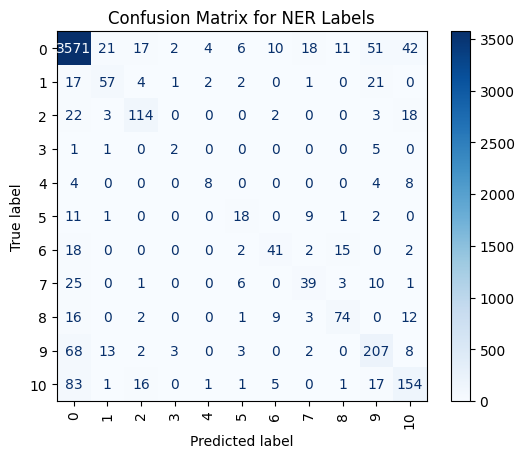


 79%|███████▉  | 7348/9300 [28:53<22:57,  1.42it/s]

{'eval_loss': 1.4868069887161255, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8602721013502179, 'eval_runtime': 1.7517, 'eval_samples_per_second': 105.613, 'eval_steps_per_second': 13.701, 'epoch': 79.0}


 80%|████████  | 7440/9300 [29:12<05:48,  5.33it/s]

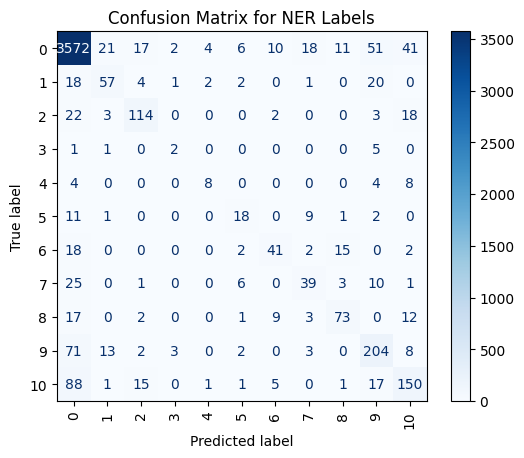


 80%|████████  | 7441/9300 [29:14<19:26,  1.59it/s]

{'eval_loss': 1.4926279783248901, 'eval_accuracy': 0.8621523579201935, 'eval_f1': 0.8584860899491696, 'eval_runtime': 1.4923, 'eval_samples_per_second': 123.973, 'eval_steps_per_second': 16.083, 'epoch': 80.0}


 81%|████████  | 7500/9300 [29:27<06:08,  4.89it/s]

{'loss': 0.0027, 'grad_norm': 0.09037906676530838, 'learning_rate': 3.870967741935484e-06, 'epoch': 80.65}


 81%|████████  | 7533/9300 [29:41<05:37,  5.23it/s]  

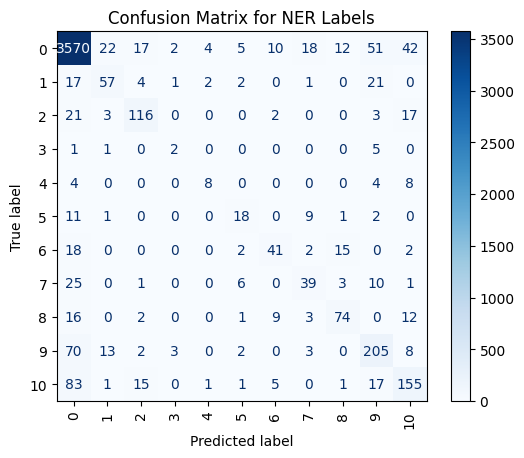


 81%|████████  | 7534/9300 [29:43<19:03,  1.54it/s]

{'eval_loss': 1.4887704849243164, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8602721864823367, 'eval_runtime': 1.5424, 'eval_samples_per_second': 119.946, 'eval_steps_per_second': 15.561, 'epoch': 81.0}


 82%|████████▏ | 7626/9300 [30:02<05:14,  5.32it/s]

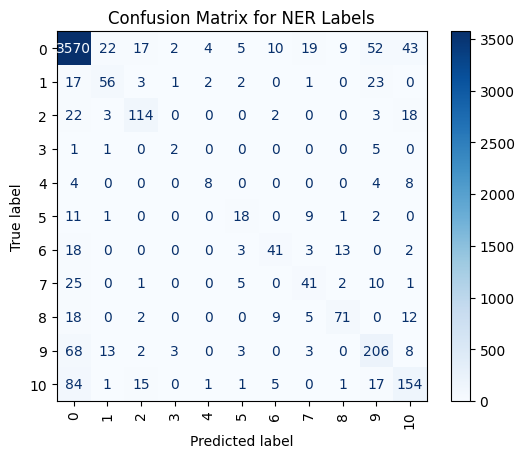


 82%|████████▏ | 7627/9300 [30:04<17:27,  1.60it/s]

{'eval_loss': 1.491623044013977, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8595148886146635, 'eval_runtime': 1.4858, 'eval_samples_per_second': 124.515, 'eval_steps_per_second': 16.153, 'epoch': 82.0}


 83%|████████▎ | 7719/9300 [30:23<04:55,  5.36it/s]

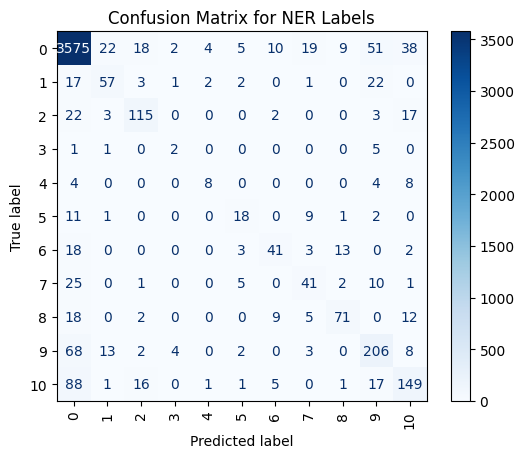


 83%|████████▎ | 7720/9300 [30:24<16:38,  1.58it/s]

{'eval_loss': 1.4961934089660645, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8595684885673667, 'eval_runtime': 1.5155, 'eval_samples_per_second': 122.075, 'eval_steps_per_second': 15.837, 'epoch': 83.0}


 84%|████████▍ | 7812/9300 [30:44<04:34,  5.43it/s]

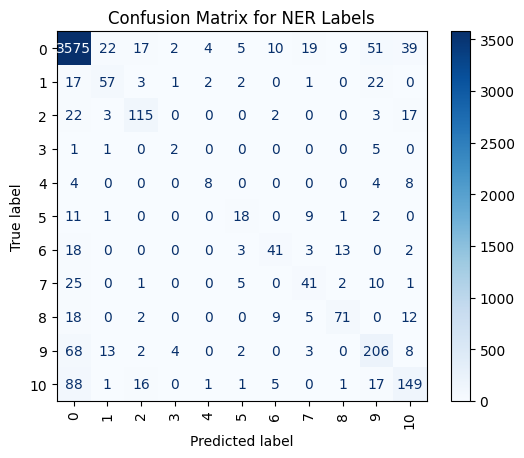


 84%|████████▍ | 7813/9300 [30:45<15:27,  1.60it/s]

{'eval_loss': 1.4993137121200562, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8595792133496247, 'eval_runtime': 1.4864, 'eval_samples_per_second': 124.459, 'eval_steps_per_second': 16.146, 'epoch': 84.0}


 85%|████████▌ | 7905/9300 [31:05<04:21,  5.33it/s]

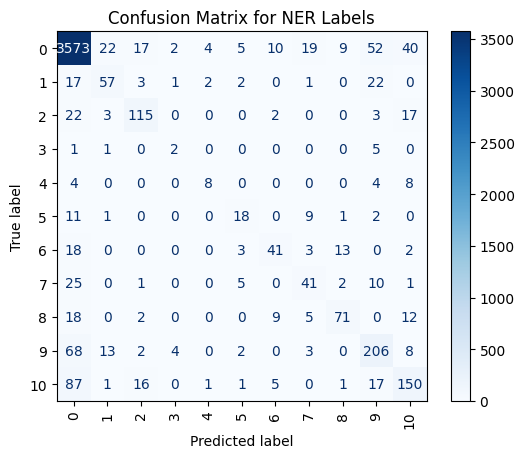


 85%|████████▌ | 7906/9300 [31:06<14:40,  1.58it/s]

{'eval_loss': 1.5008587837219238, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8594888890723381, 'eval_runtime': 1.5036, 'eval_samples_per_second': 123.039, 'eval_steps_per_second': 15.962, 'epoch': 85.0}


 86%|████████▌ | 7998/9300 [31:25<04:02,  5.38it/s]

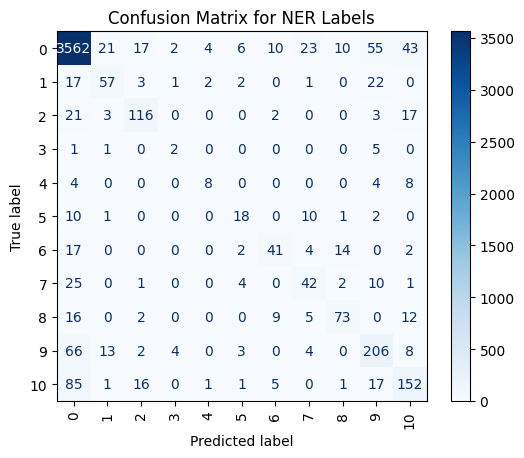


 86%|████████▌ | 7999/9300 [31:27<13:36,  1.59it/s]

{'eval_loss': 1.4951958656311035, 'eval_accuracy': 0.861950826279726, 'eval_f1': 0.8592390089309083, 'eval_runtime': 1.4894, 'eval_samples_per_second': 124.21, 'eval_steps_per_second': 16.114, 'epoch': 86.0}


 86%|████████▌ | 8000/9300 [31:27<10:51,  1.99it/s]

{'loss': 0.0028, 'grad_norm': 0.00719344662502408, 'learning_rate': 2.7956989247311827e-06, 'epoch': 86.02}


 87%|████████▋ | 8091/9300 [31:55<03:46,  5.33it/s]  

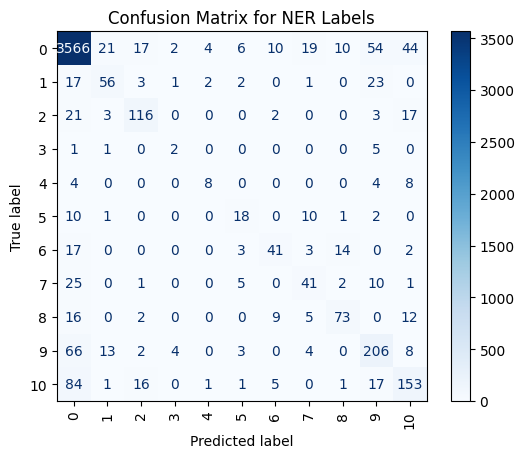


 87%|████████▋ | 8092/9300 [31:56<12:37,  1.60it/s]

{'eval_loss': 1.493933081626892, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.859688052420889, 'eval_runtime': 1.4852, 'eval_samples_per_second': 124.558, 'eval_steps_per_second': 16.159, 'epoch': 87.0}


 88%|████████▊ | 8184/9300 [32:15<03:27,  5.39it/s]

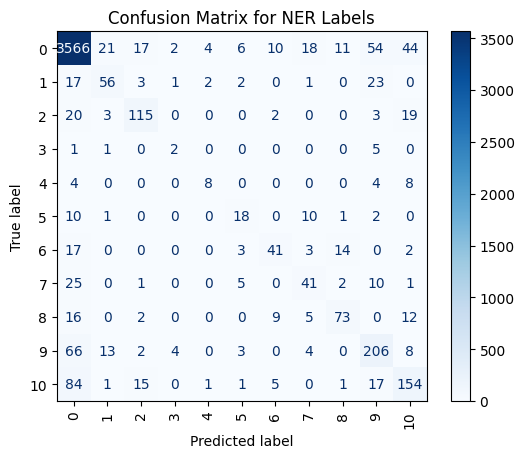


 88%|████████▊ | 8185/9300 [32:17<11:45,  1.58it/s]

{'eval_loss': 1.4944515228271484, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8597302015060813, 'eval_runtime': 1.5116, 'eval_samples_per_second': 122.383, 'eval_steps_per_second': 15.877, 'epoch': 88.0}


 89%|████████▉ | 8277/9300 [32:36<03:10,  5.36it/s]

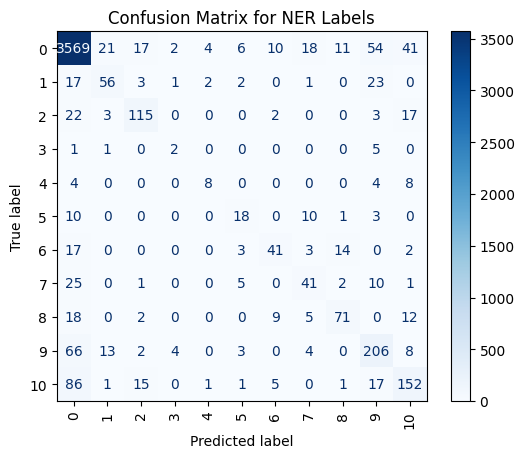


 89%|████████▉ | 8278/9300 [32:38<10:46,  1.58it/s]

{'eval_loss': 1.4961506128311157, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.8591992111500797, 'eval_runtime': 1.5055, 'eval_samples_per_second': 122.884, 'eval_steps_per_second': 15.942, 'epoch': 89.0}


 90%|█████████ | 8370/9300 [32:57<02:55,  5.30it/s]

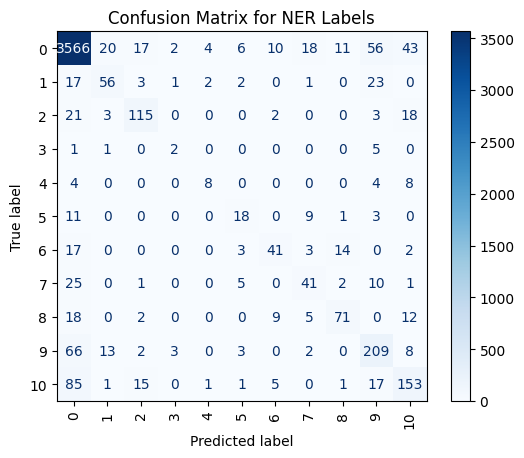


 90%|█████████ | 8371/9300 [32:59<09:49,  1.58it/s]

{'eval_loss': 1.4973747730255127, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8594421258246834, 'eval_runtime': 1.5092, 'eval_samples_per_second': 122.579, 'eval_steps_per_second': 15.902, 'epoch': 90.0}


 91%|█████████ | 8463/9300 [33:18<02:35,  5.38it/s]

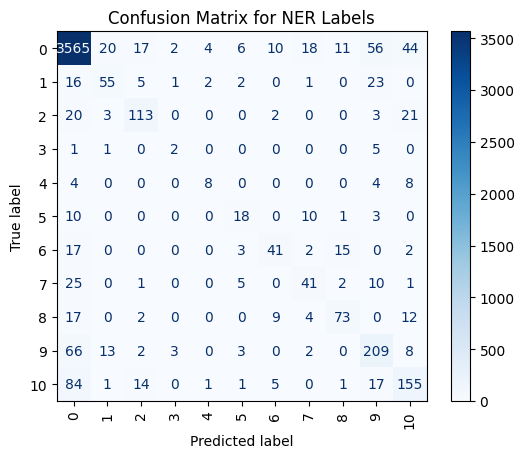


 91%|█████████ | 8464/9300 [33:20<08:47,  1.58it/s]

{'eval_loss': 1.4969066381454468, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8596372607093105, 'eval_runtime': 1.5076, 'eval_samples_per_second': 122.714, 'eval_steps_per_second': 15.92, 'epoch': 91.0}


 91%|█████████▏| 8500/9300 [33:27<02:48,  4.75it/s]

{'loss': 0.0027, 'grad_norm': 0.002863408997654915, 'learning_rate': 1.720430107526882e-06, 'epoch': 91.4}


 92%|█████████▏| 8556/9300 [33:48<02:19,  5.32it/s]

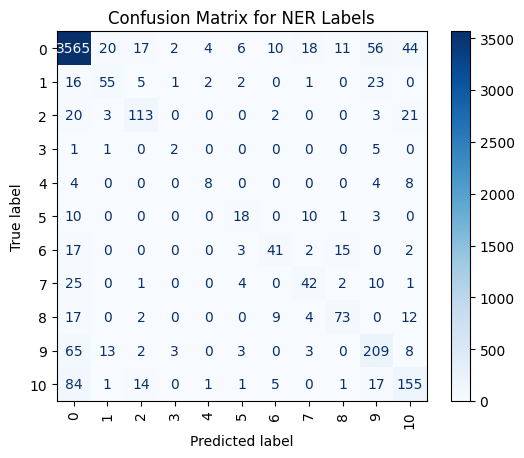


 92%|█████████▏| 8557/9300 [33:50<08:44,  1.42it/s]

{'eval_loss': 1.4976773262023926, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8598825779371467, 'eval_runtime': 1.7538, 'eval_samples_per_second': 105.486, 'eval_steps_per_second': 13.685, 'epoch': 92.0}


 93%|█████████▎| 8649/9300 [34:09<02:00,  5.39it/s]

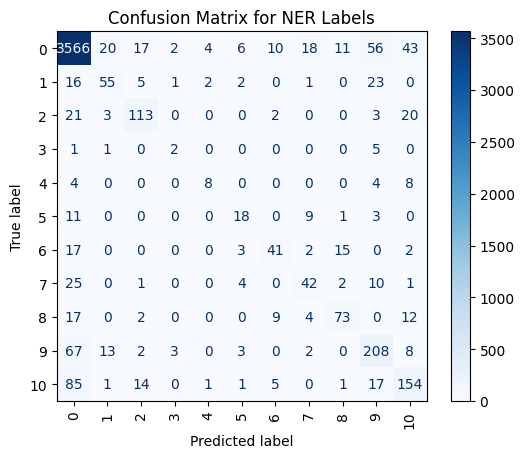


 93%|█████████▎| 8650/9300 [34:10<06:51,  1.58it/s]

{'eval_loss': 1.4970669746398926, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8594693426693115, 'eval_runtime': 1.5111, 'eval_samples_per_second': 122.427, 'eval_steps_per_second': 15.882, 'epoch': 93.0}


 94%|█████████▍| 8742/9300 [34:30<01:43,  5.40it/s]

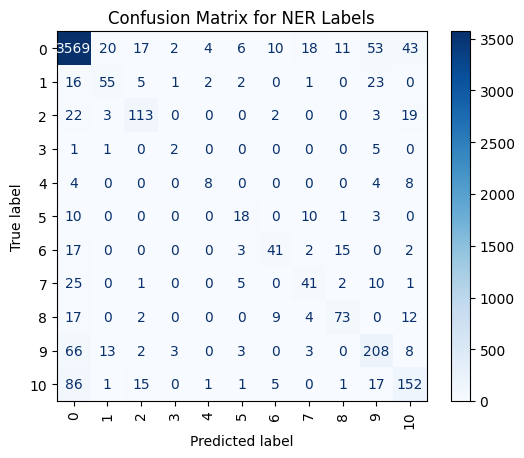


 94%|█████████▍| 8743/9300 [34:31<05:50,  1.59it/s]

{'eval_loss': 1.4975440502166748, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8593523318106844, 'eval_runtime': 1.5008, 'eval_samples_per_second': 123.269, 'eval_steps_per_second': 15.992, 'epoch': 94.0}


 95%|█████████▌| 8835/9300 [34:50<01:27,  5.34it/s]

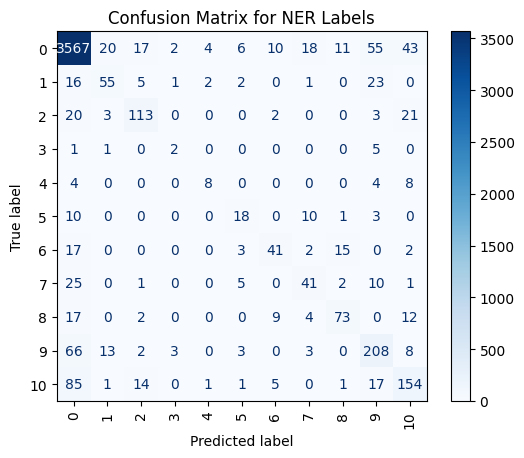


 95%|█████████▌| 8836/9300 [34:52<04:54,  1.58it/s]

{'eval_loss': 1.4981465339660645, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8595470884537397, 'eval_runtime': 1.5109, 'eval_samples_per_second': 122.44, 'eval_steps_per_second': 15.884, 'epoch': 95.0}


 96%|█████████▌| 8928/9300 [35:11<01:08,  5.44it/s]

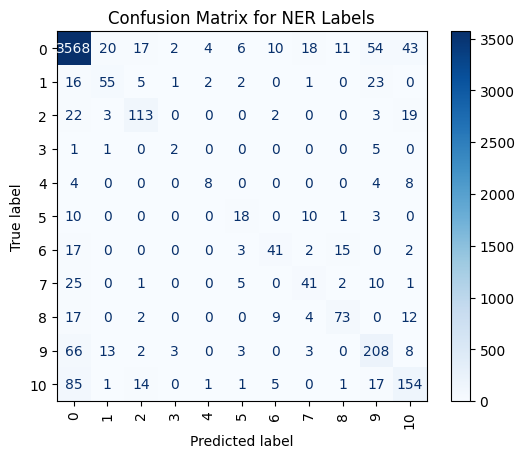


 96%|█████████▌| 8929/9300 [35:13<03:52,  1.59it/s]

{'eval_loss': 1.4985651969909668, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8596536363250813, 'eval_runtime': 1.4989, 'eval_samples_per_second': 123.423, 'eval_steps_per_second': 16.012, 'epoch': 96.0}


 97%|█████████▋| 9000/9300 [35:28<01:01,  4.86it/s]

{'loss': 0.0028, 'grad_norm': 0.023532532155513763, 'learning_rate': 6.451612903225807e-07, 'epoch': 96.77}


 97%|█████████▋| 9021/9300 [35:41<00:53,  5.17it/s]

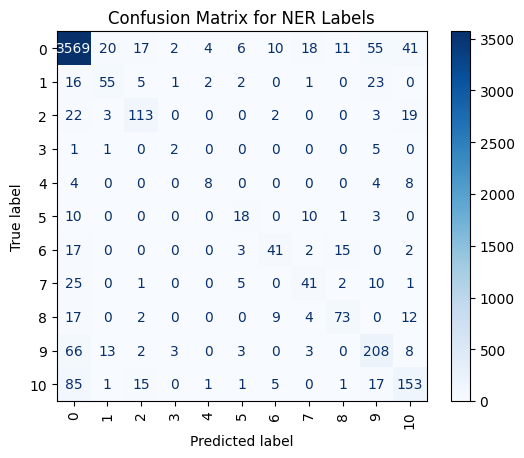


 97%|█████████▋| 9022/9300 [35:42<02:59,  1.55it/s]

{'eval_loss': 1.4989274740219116, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8595954988806254, 'eval_runtime': 1.5307, 'eval_samples_per_second': 120.863, 'eval_steps_per_second': 15.679, 'epoch': 97.0}


 98%|█████████▊| 9114/9300 [36:01<00:34,  5.42it/s]

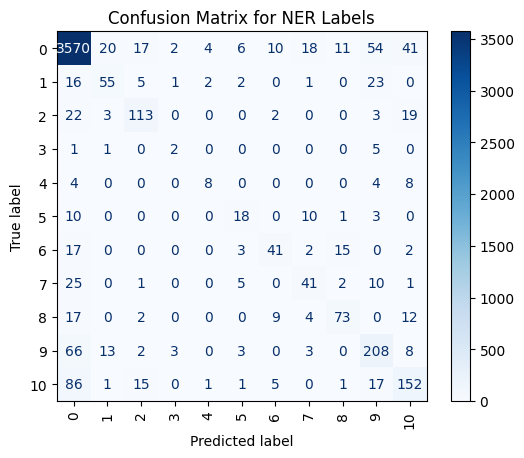


 98%|█████████▊| 9115/9300 [36:03<01:55,  1.60it/s]

{'eval_loss': 1.5001375675201416, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8595187652047931, 'eval_runtime': 1.483, 'eval_samples_per_second': 124.746, 'eval_steps_per_second': 16.183, 'epoch': 98.0}


 99%|█████████▉| 9207/9300 [36:22<00:17,  5.37it/s]

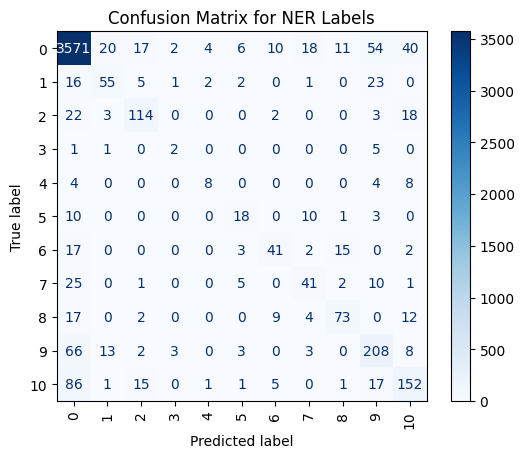


 99%|█████████▉| 9208/9300 [36:24<00:57,  1.60it/s]

{'eval_loss': 1.4998092651367188, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8598823979371576, 'eval_runtime': 1.4796, 'eval_samples_per_second': 125.033, 'eval_steps_per_second': 16.221, 'epoch': 99.0}


100%|██████████| 9300/9300 [36:43<00:00,  5.34it/s]

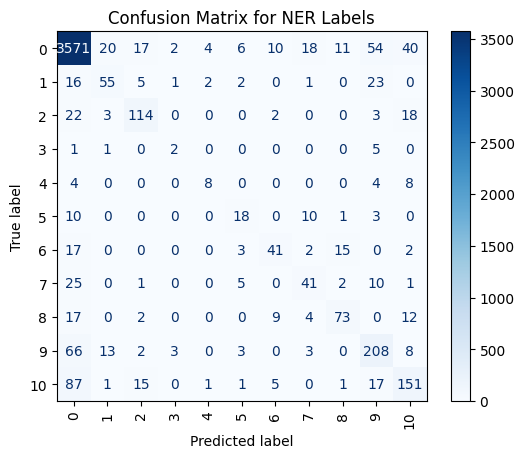


100%|██████████| 9300/9300 [36:52<00:00,  4.20it/s]


{'eval_loss': 1.4999351501464844, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8596352524378097, 'eval_runtime': 1.4504, 'eval_samples_per_second': 127.555, 'eval_steps_per_second': 16.548, 'epoch': 100.0}
{'train_runtime': 2212.316, 'train_samples_per_second': 33.494, 'train_steps_per_second': 4.204, 'train_loss': 0.0029743912399456066, 'epoch': 100.0}


: 

In [ ]:
# Train the model
trainer.train()

# Save the model
trainer.save_model("./saved_model_gpt2_for_tokens_2")


In [85]:
# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",
    evaluation_strategy="epoch",
    learning_rate=2e-6,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=100,
    weight_decay=0.1,
    logging_dir='./logs',
)

# Define the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_sampled,
    eval_dataset=val_sampled,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)


/home/iza/Desktop/Studia/sem2/nlp/NLP_task1/.venv/lib/python3.10/site-packages/transformers/training_args.py:1545: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


  1%|          | 93/9300 [00:19<29:11,  5.26it/s]

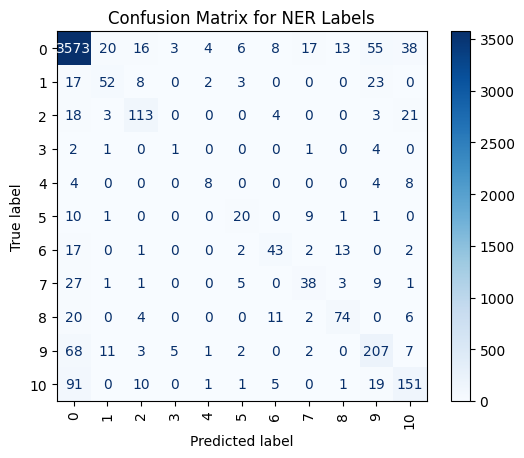


  1%|          | 94/9300 [00:20<1:36:25,  1.59it/s]

{'eval_loss': 1.2288410663604736, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8588381556606024, 'eval_runtime': 1.4761, 'eval_samples_per_second': 125.329, 'eval_steps_per_second': 16.259, 'epoch': 1.0}


  2%|▏         | 186/9300 [00:39<27:50,  5.46it/s] 

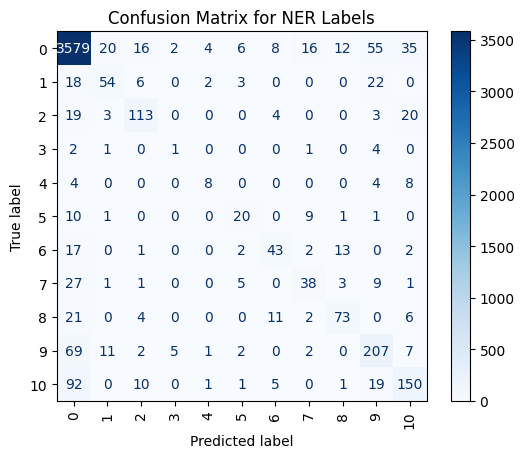


  2%|▏         | 187/9300 [00:41<1:36:42,  1.57it/s]

{'eval_loss': 1.2345051765441895, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8597028040755252, 'eval_runtime': 1.5335, 'eval_samples_per_second': 120.639, 'eval_steps_per_second': 15.65, 'epoch': 2.0}


  3%|▎         | 279/9300 [01:00<27:17,  5.51it/s]  

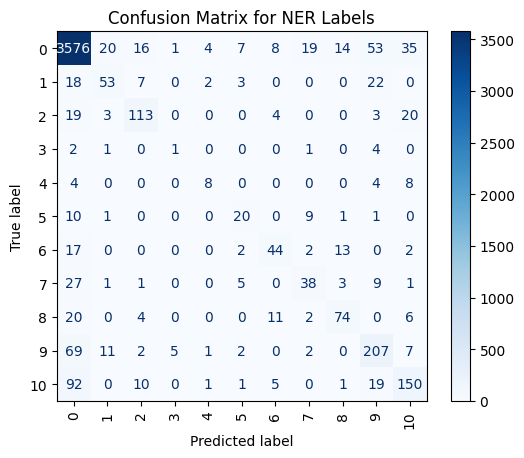


  3%|▎         | 280/9300 [01:01<1:36:31,  1.56it/s]

{'eval_loss': 1.2358685731887817, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8594076695597307, 'eval_runtime': 1.5413, 'eval_samples_per_second': 120.032, 'eval_steps_per_second': 15.572, 'epoch': 3.0}


  4%|▍         | 372/9300 [01:20<27:40,  5.38it/s]  

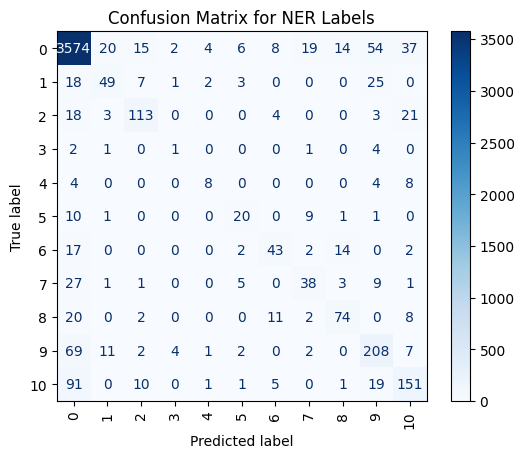


  4%|▍         | 373/9300 [01:22<1:32:51,  1.60it/s]

{'eval_loss': 1.239499568939209, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.8584846218792164, 'eval_runtime': 1.4845, 'eval_samples_per_second': 124.617, 'eval_steps_per_second': 16.167, 'epoch': 4.0}


  5%|▌         | 465/9300 [01:40<27:45,  5.31it/s]  

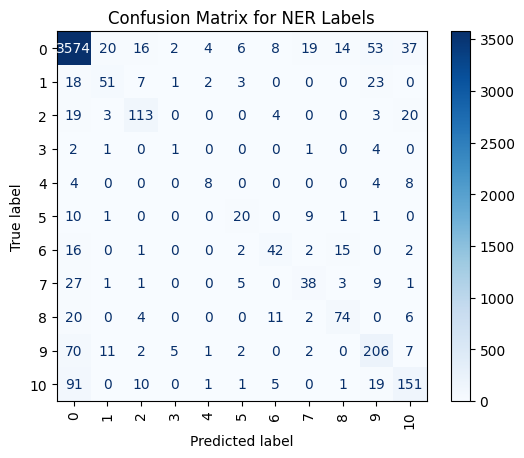


  5%|▌         | 466/9300 [01:42<1:32:35,  1.59it/s]

{'eval_loss': 1.2396128177642822, 'eval_accuracy': 0.8621523579201935, 'eval_f1': 0.8583067924177827, 'eval_runtime': 1.4869, 'eval_samples_per_second': 124.416, 'eval_steps_per_second': 16.14, 'epoch': 5.0}


  5%|▌         | 500/9300 [01:49<30:39,  4.78it/s]  

{'loss': 0.0037, 'grad_norm': 0.08174095302820206, 'learning_rate': 1.89247311827957e-06, 'epoch': 5.38}


  6%|▌         | 558/9300 [02:10<27:32,  5.29it/s]  

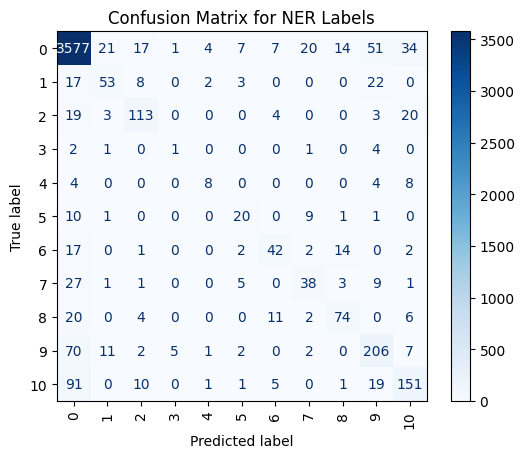


  6%|▌         | 559/9300 [02:11<1:32:18,  1.58it/s]

{'eval_loss': 1.2422672510147095, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8591794576095632, 'eval_runtime': 1.4974, 'eval_samples_per_second': 123.548, 'eval_steps_per_second': 16.028, 'epoch': 6.0}


  7%|▋         | 651/9300 [02:30<26:58,  5.34it/s]  

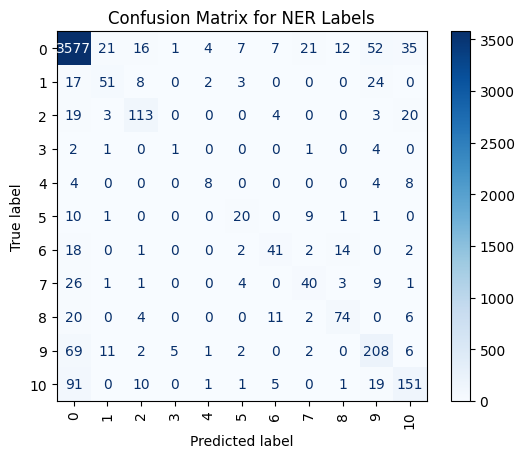


  7%|▋         | 652/9300 [02:32<1:30:16,  1.60it/s]

{'eval_loss': 1.2430801391601562, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8594029652179451, 'eval_runtime': 1.4874, 'eval_samples_per_second': 124.378, 'eval_steps_per_second': 16.136, 'epoch': 7.0}


  8%|▊         | 744/9300 [02:51<26:29,  5.38it/s]  

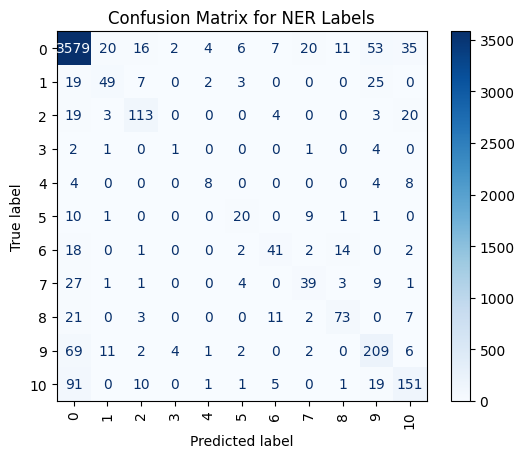


  8%|▊         | 745/9300 [02:52<1:28:06,  1.62it/s]

{'eval_loss': 1.2475203275680542, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8589276408337144, 'eval_runtime': 1.4619, 'eval_samples_per_second': 126.55, 'eval_steps_per_second': 16.417, 'epoch': 8.0}


  9%|▉         | 837/9300 [03:11<25:41,  5.49it/s]  

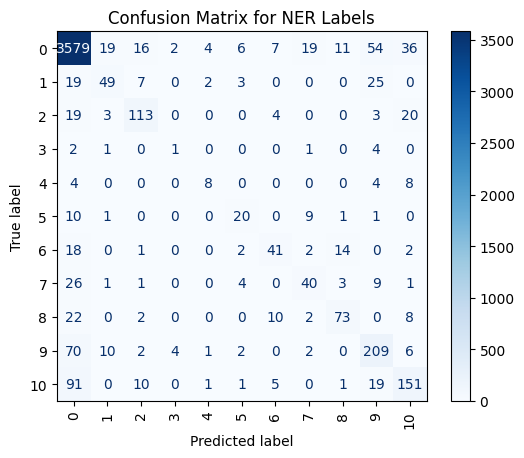


  9%|▉         | 838/9300 [03:13<1:27:46,  1.61it/s]

{'eval_loss': 1.2482398748397827, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8591037998104422, 'eval_runtime': 1.4814, 'eval_samples_per_second': 124.88, 'eval_steps_per_second': 16.201, 'epoch': 9.0}


 10%|█         | 930/9300 [03:30<25:01,  5.57it/s]  

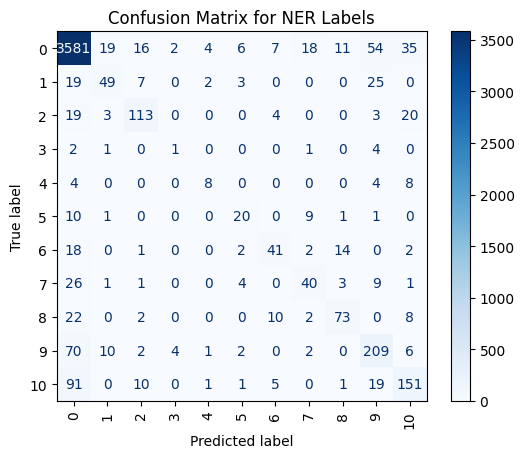


 10%|█         | 931/9300 [03:32<1:25:38,  1.63it/s]

{'eval_loss': 1.2509772777557373, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8594333449822035, 'eval_runtime': 1.461, 'eval_samples_per_second': 126.629, 'eval_steps_per_second': 16.428, 'epoch': 10.0}


 11%|█         | 1000/9300 [03:45<27:00,  5.12it/s] 

{'loss': 0.0035, 'grad_norm': 0.003407915122807026, 'learning_rate': 1.7849462365591396e-06, 'epoch': 10.75}


 11%|█         | 1023/9300 [03:59<25:13,  5.47it/s]  

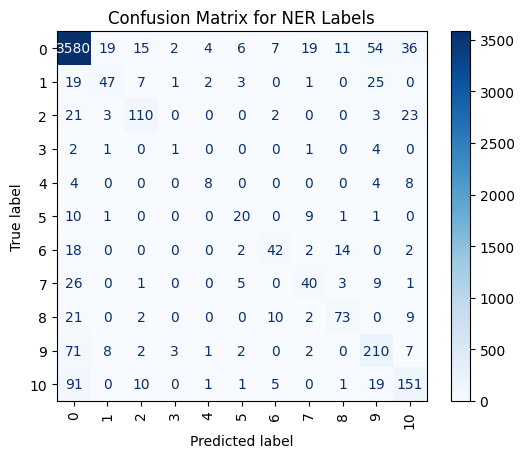


 11%|█         | 1024/9300 [04:00<1:22:40,  1.67it/s]

{'eval_loss': 1.256896734237671, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8585919373746412, 'eval_runtime': 1.4222, 'eval_samples_per_second': 130.084, 'eval_steps_per_second': 16.876, 'epoch': 11.0}


 12%|█▏        | 1116/9300 [04:18<24:00,  5.68it/s]  

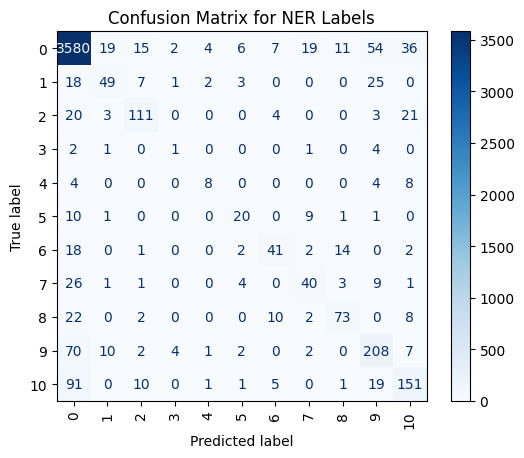


 12%|█▏        | 1117/9300 [04:20<1:20:38,  1.69it/s]

{'eval_loss': 1.2543483972549438, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8587423302095021, 'eval_runtime': 1.4049, 'eval_samples_per_second': 131.686, 'eval_steps_per_second': 17.084, 'epoch': 12.0}


 13%|█▎        | 1209/9300 [04:38<25:17,  5.33it/s]  

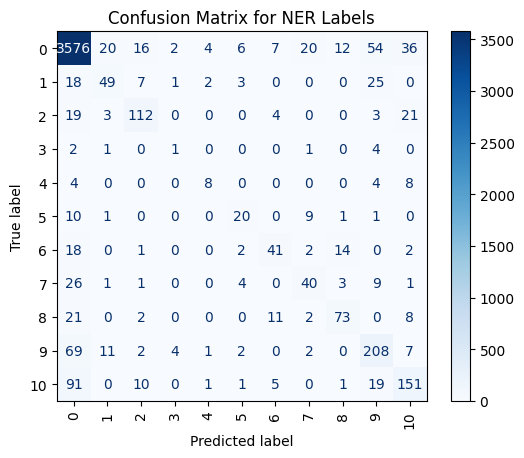


 13%|█▎        | 1210/9300 [04:40<1:32:13,  1.46it/s]

{'eval_loss': 1.2534292936325073, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.8583614372006082, 'eval_runtime': 1.6679, 'eval_samples_per_second': 110.916, 'eval_steps_per_second': 14.389, 'epoch': 13.0}


 14%|█▍        | 1302/9300 [04:58<25:23,  5.25it/s]  

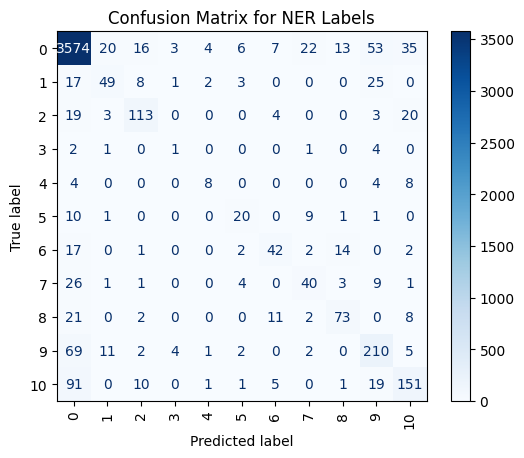


 14%|█▍        | 1303/9300 [05:00<1:25:49,  1.55it/s]

{'eval_loss': 1.2530839443206787, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8589518495998296, 'eval_runtime': 1.5324, 'eval_samples_per_second': 120.724, 'eval_steps_per_second': 15.661, 'epoch': 14.0}


 15%|█▌        | 1395/9300 [05:19<25:15,  5.22it/s]  

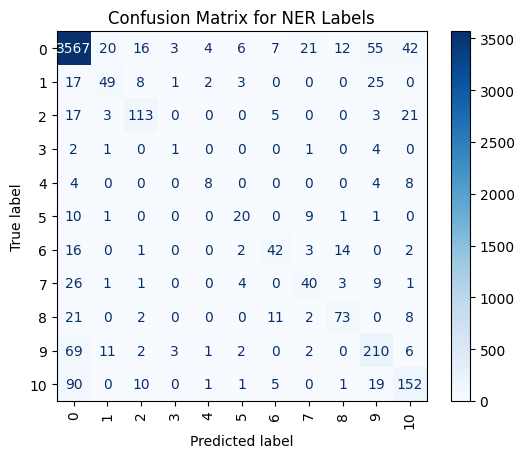


 15%|█▌        | 1396/9300 [05:21<1:24:59,  1.55it/s]

{'eval_loss': 1.2523598670959473, 'eval_accuracy': 0.8615477629987908, 'eval_f1': 0.858054238804202, 'eval_runtime': 1.5294, 'eval_samples_per_second': 120.961, 'eval_steps_per_second': 15.692, 'epoch': 15.0}


 16%|█▌        | 1488/9300 [05:40<24:53,  5.23it/s]  

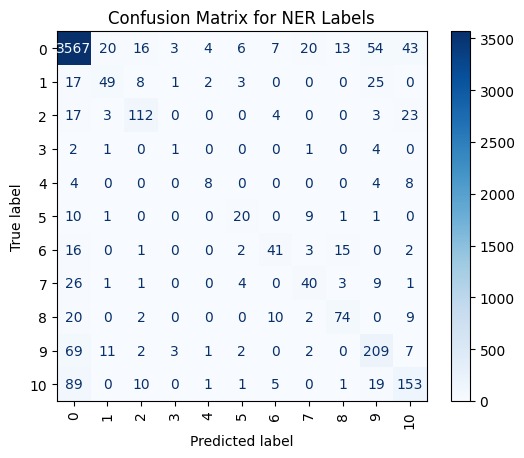


 16%|█▌        | 1489/9300 [05:42<1:23:40,  1.56it/s]

{'eval_loss': 1.2529196739196777, 'eval_accuracy': 0.8613462313583232, 'eval_f1': 0.8578986045053145, 'eval_runtime': 1.5267, 'eval_samples_per_second': 121.177, 'eval_steps_per_second': 15.72, 'epoch': 16.0}


 16%|█▌        | 1500/9300 [05:44<28:43,  4.53it/s]  

{'loss': 0.0038, 'grad_norm': 0.18046823143959045, 'learning_rate': 1.6774193548387097e-06, 'epoch': 16.13}


 17%|█▋        | 1581/9300 [06:09<23:32,  5.46it/s]  

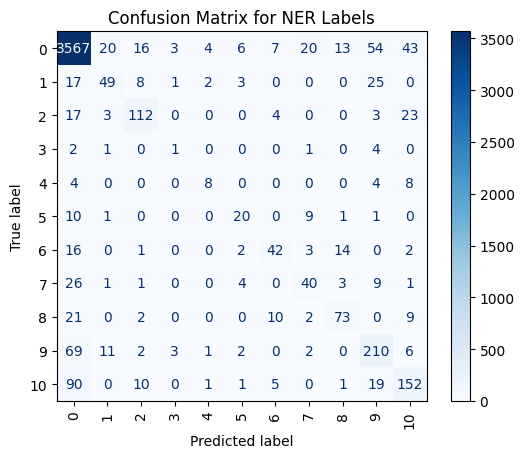


 17%|█▋        | 1582/9300 [06:11<1:19:23,  1.62it/s]

{'eval_loss': 1.2538126707077026, 'eval_accuracy': 0.8613462313583232, 'eval_f1': 0.8578368680643659, 'eval_runtime': 1.4604, 'eval_samples_per_second': 126.675, 'eval_steps_per_second': 16.433, 'epoch': 17.0}


 18%|█▊        | 1674/9300 [06:29<23:07,  5.50it/s]  

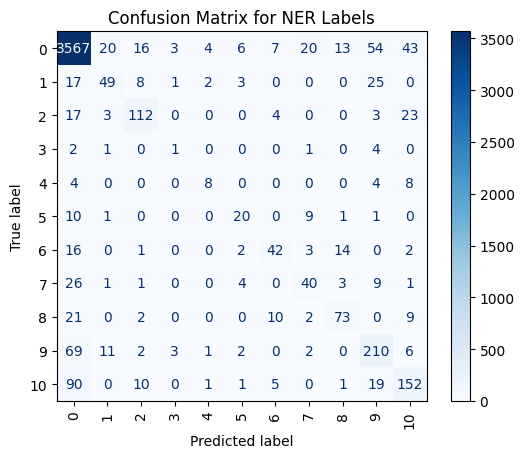


 18%|█▊        | 1675/9300 [06:31<1:18:26,  1.62it/s]

{'eval_loss': 1.2555766105651855, 'eval_accuracy': 0.8613462313583232, 'eval_f1': 0.8578368680643659, 'eval_runtime': 1.468, 'eval_samples_per_second': 126.022, 'eval_steps_per_second': 16.349, 'epoch': 18.0}


 19%|█▉        | 1767/9300 [06:49<22:56,  5.47it/s]  

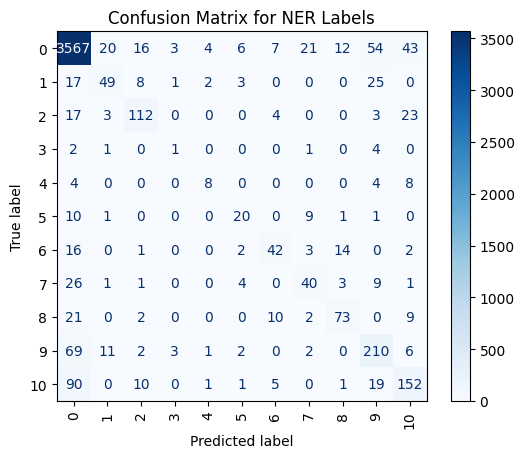


 19%|█▉        | 1768/9300 [06:51<1:17:03,  1.63it/s]

{'eval_loss': 1.2579164505004883, 'eval_accuracy': 0.8613462313583232, 'eval_f1': 0.8578551378084571, 'eval_runtime': 1.452, 'eval_samples_per_second': 127.409, 'eval_steps_per_second': 16.529, 'epoch': 19.0}


 20%|██        | 1860/9300 [07:09<22:34,  5.49it/s]  

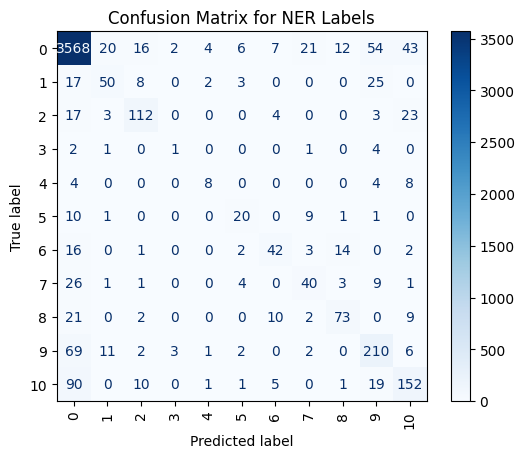


 20%|██        | 1861/9300 [07:11<1:17:00,  1.61it/s]

{'eval_loss': 1.2575244903564453, 'eval_accuracy': 0.8617492946392583, 'eval_f1': 0.8581530861520106, 'eval_runtime': 1.4778, 'eval_samples_per_second': 125.187, 'eval_steps_per_second': 16.24, 'epoch': 20.0}


 21%|██        | 1953/9300 [07:29<22:25,  5.46it/s]  

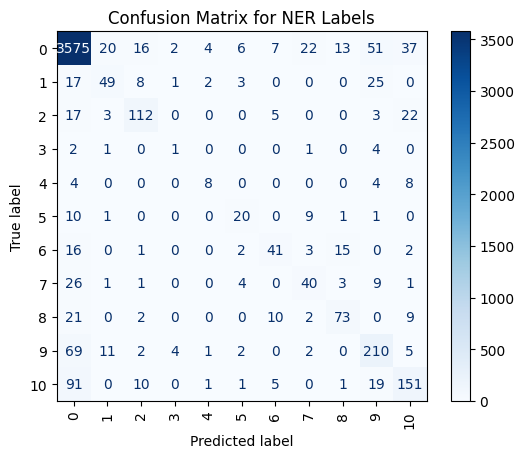


 21%|██        | 1954/9300 [07:31<1:15:00,  1.63it/s]

{'eval_loss': 1.2596120834350586, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8587439668397407, 'eval_runtime': 1.4416, 'eval_samples_per_second': 128.333, 'eval_steps_per_second': 16.649, 'epoch': 21.0}


 22%|██▏       | 2000/9300 [07:40<24:17,  5.01it/s]  

{'loss': 0.0035, 'grad_norm': 0.3104662597179413, 'learning_rate': 1.5698924731182794e-06, 'epoch': 21.51}


 22%|██▏       | 2046/9300 [07:58<21:52,  5.53it/s]  

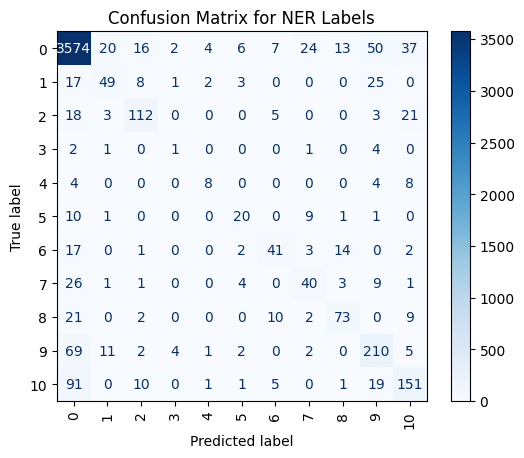


 22%|██▏       | 2047/9300 [08:00<1:14:21,  1.63it/s]

{'eval_loss': 1.261702299118042, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.8585495980413198, 'eval_runtime': 1.4588, 'eval_samples_per_second': 126.82, 'eval_steps_per_second': 16.452, 'epoch': 22.0}


 23%|██▎       | 2139/9300 [08:18<21:44,  5.49it/s]  

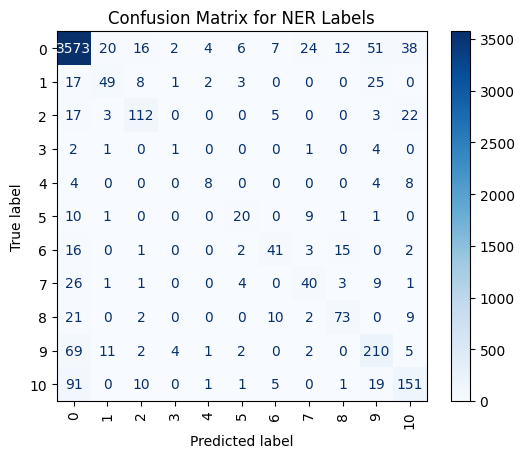


 23%|██▎       | 2140/9300 [08:20<1:13:18,  1.63it/s]

{'eval_loss': 1.2623822689056396, 'eval_accuracy': 0.8621523579201935, 'eval_f1': 0.8584378034254267, 'eval_runtime': 1.4547, 'eval_samples_per_second': 127.178, 'eval_steps_per_second': 16.499, 'epoch': 23.0}


 24%|██▍       | 2232/9300 [08:38<21:27,  5.49it/s]  

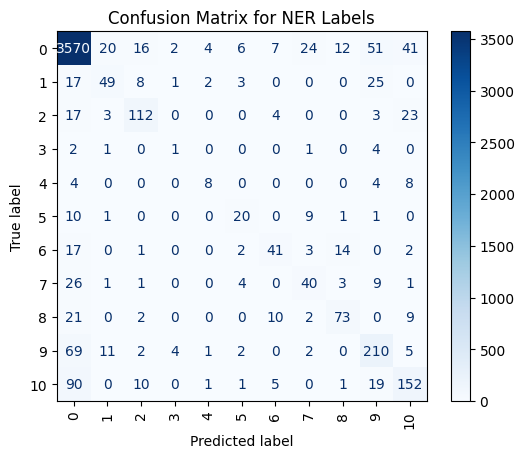


 24%|██▍       | 2233/9300 [08:40<1:12:12,  1.63it/s]

{'eval_loss': 1.2636784315109253, 'eval_accuracy': 0.8617492946392583, 'eval_f1': 0.8581514340905504, 'eval_runtime': 1.4541, 'eval_samples_per_second': 127.226, 'eval_steps_per_second': 16.505, 'epoch': 24.0}


 25%|██▌       | 2325/9300 [08:58<21:09,  5.50it/s]  

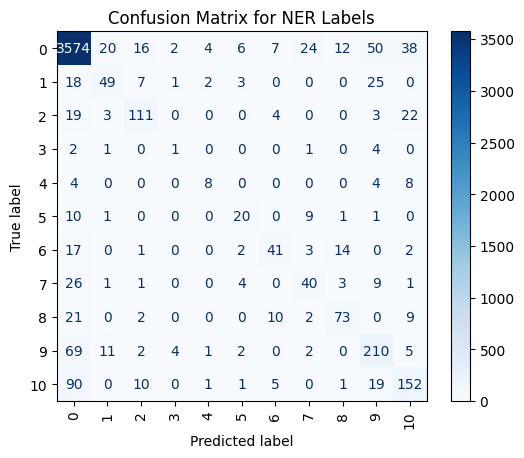


 25%|██▌       | 2326/9300 [09:00<1:11:23,  1.63it/s]

{'eval_loss': 1.266021728515625, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.8585524975077929, 'eval_runtime': 1.4551, 'eval_samples_per_second': 127.137, 'eval_steps_per_second': 16.493, 'epoch': 25.0}


 26%|██▌       | 2418/9300 [09:18<20:33,  5.58it/s]  

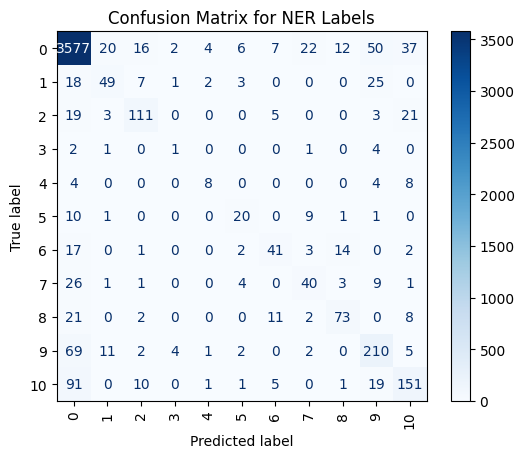


 26%|██▌       | 2419/9300 [09:20<1:18:10,  1.47it/s]

{'eval_loss': 1.267460823059082, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8587942731910193, 'eval_runtime': 1.688, 'eval_samples_per_second': 109.598, 'eval_steps_per_second': 14.218, 'epoch': 26.0}


 27%|██▋       | 2500/9300 [09:37<23:26,  4.84it/s]  

{'loss': 0.0031, 'grad_norm': 0.007633781060576439, 'learning_rate': 1.4623655913978494e-06, 'epoch': 26.88}


 27%|██▋       | 2511/9300 [09:47<28:08,  4.02it/s]  

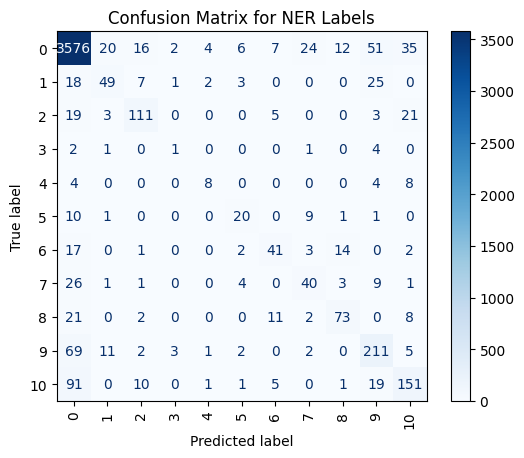


 27%|██▋       | 2512/9300 [09:49<1:12:35,  1.56it/s]

{'eval_loss': 1.2688937187194824, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8587967846963603, 'eval_runtime': 1.4027, 'eval_samples_per_second': 131.885, 'eval_steps_per_second': 17.109, 'epoch': 27.0}


 28%|██▊       | 2604/9300 [10:07<19:39,  5.68it/s]  

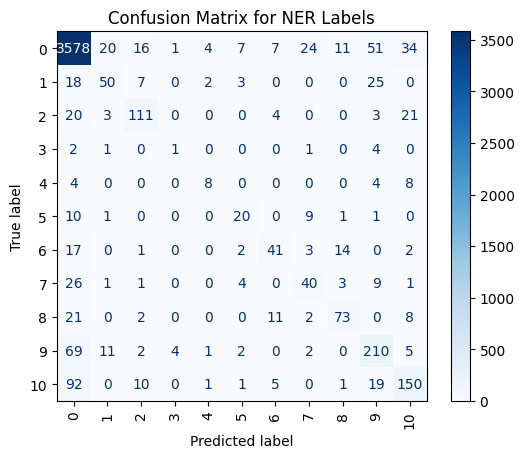


 28%|██▊       | 2605/9300 [10:08<1:05:55,  1.69it/s]

{'eval_loss': 1.2726062536239624, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.858857627894297, 'eval_runtime': 1.3986, 'eval_samples_per_second': 132.278, 'eval_steps_per_second': 17.16, 'epoch': 28.0}


 29%|██▉       | 2697/9300 [10:26<18:41,  5.89it/s]  

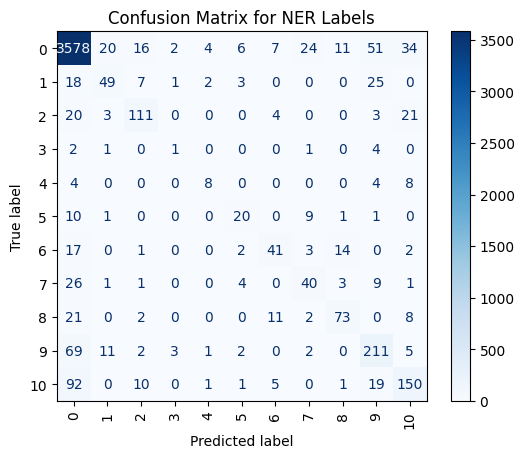


 29%|██▉       | 2698/9300 [10:27<1:04:06,  1.72it/s]

{'eval_loss': 1.272881031036377, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.858860988319378, 'eval_runtime': 1.3941, 'eval_samples_per_second': 132.7, 'eval_steps_per_second': 17.215, 'epoch': 29.0}


 30%|███       | 2790/9300 [10:44<18:15,  5.94it/s]  

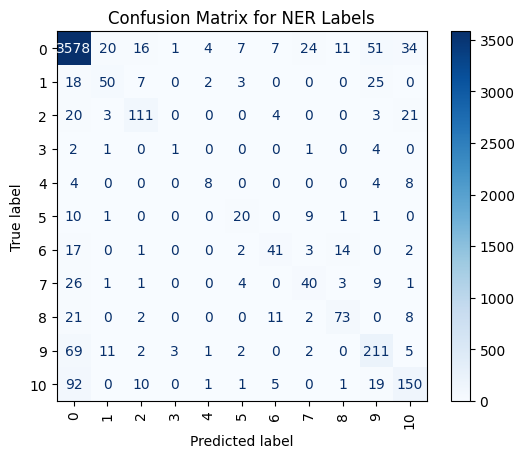


 30%|███       | 2791/9300 [10:46<1:02:42,  1.73it/s]

{'eval_loss': 1.2732020616531372, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8590050047395142, 'eval_runtime': 1.3787, 'eval_samples_per_second': 134.18, 'eval_steps_per_second': 17.407, 'epoch': 30.0}


 31%|███       | 2883/9300 [11:03<18:19,  5.84it/s]  

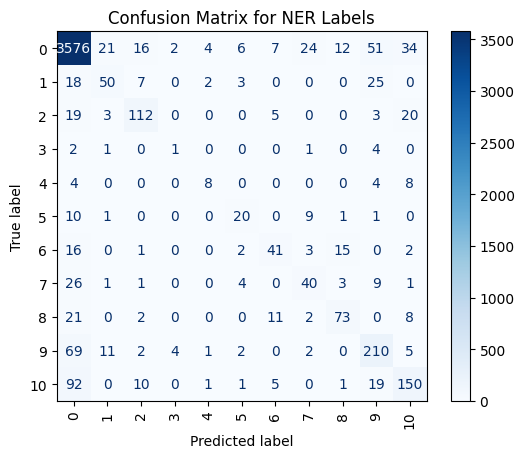


 31%|███       | 2884/9300 [11:05<1:03:43,  1.68it/s]

{'eval_loss': 1.273485779762268, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8588128915815628, 'eval_runtime': 1.4363, 'eval_samples_per_second': 128.802, 'eval_steps_per_second': 16.71, 'epoch': 31.0}


 32%|███▏      | 2976/9300 [11:23<18:14,  5.78it/s]  

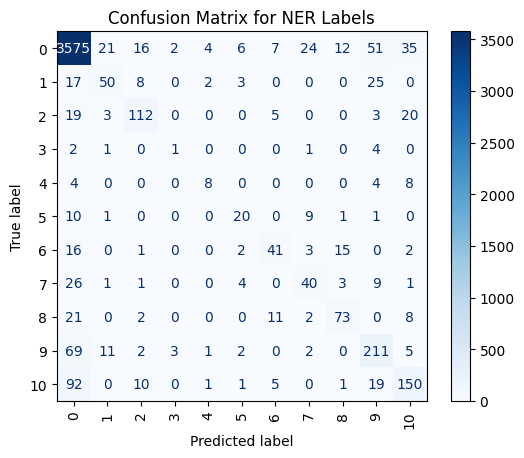


 32%|███▏      | 2977/9300 [11:24<1:05:09,  1.62it/s]

{'eval_loss': 1.273452639579773, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8588063313347912, 'eval_runtime': 1.4882, 'eval_samples_per_second': 124.31, 'eval_steps_per_second': 16.127, 'epoch': 32.0}


 32%|███▏      | 3000/9300 [11:29<20:55,  5.02it/s]  

{'loss': 0.0034, 'grad_norm': 0.159758061170578, 'learning_rate': 1.354838709677419e-06, 'epoch': 32.26}


 33%|███▎      | 3069/9300 [11:50<18:24,  5.64it/s]  

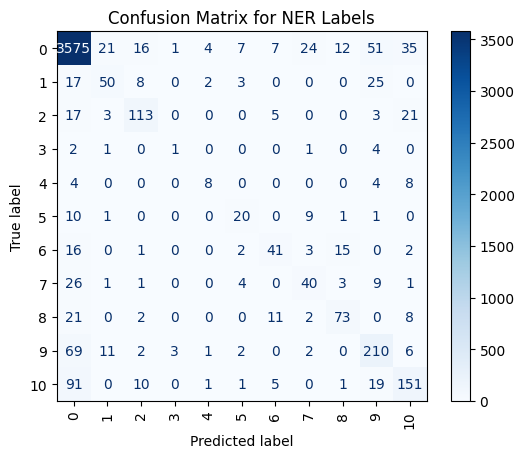


 33%|███▎      | 3070/9300 [11:52<1:04:26,  1.61it/s]

{'eval_loss': 1.2731670141220093, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8590804276682967, 'eval_runtime': 1.4799, 'eval_samples_per_second': 125.008, 'eval_steps_per_second': 16.217, 'epoch': 33.0}


 34%|███▍      | 3162/9300 [12:10<19:29,  5.25it/s]  

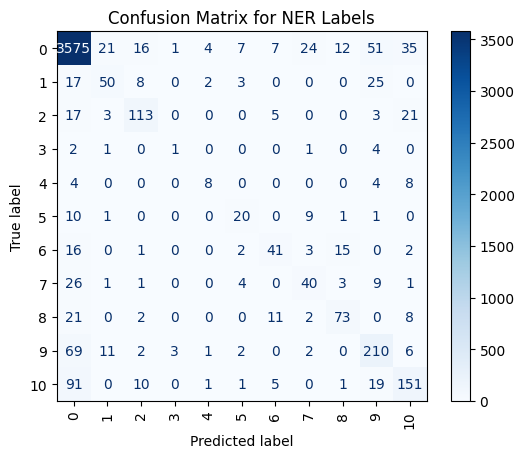


 34%|███▍      | 3163/9300 [12:12<1:05:51,  1.55it/s]

{'eval_loss': 1.2741756439208984, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8590804276682967, 'eval_runtime': 1.5318, 'eval_samples_per_second': 120.774, 'eval_steps_per_second': 15.668, 'epoch': 34.0}


 35%|███▌      | 3255/9300 [12:32<20:00,  5.04it/s]  

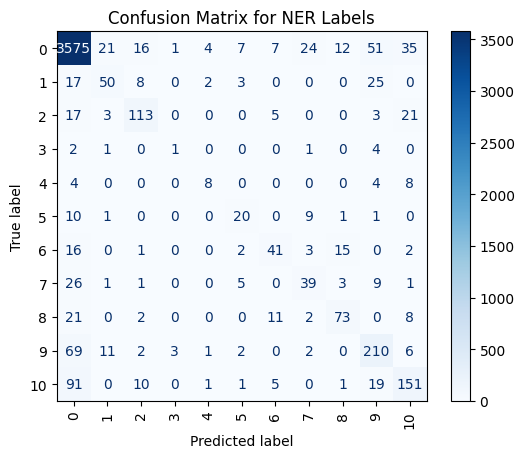


 35%|███▌      | 3256/9300 [12:33<1:06:13,  1.52it/s]

{'eval_loss': 1.273850679397583, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8588718478410978, 'eval_runtime': 1.5547, 'eval_samples_per_second': 118.99, 'eval_steps_per_second': 15.437, 'epoch': 35.0}


 36%|███▌      | 3348/9300 [12:52<18:37,  5.32it/s]  

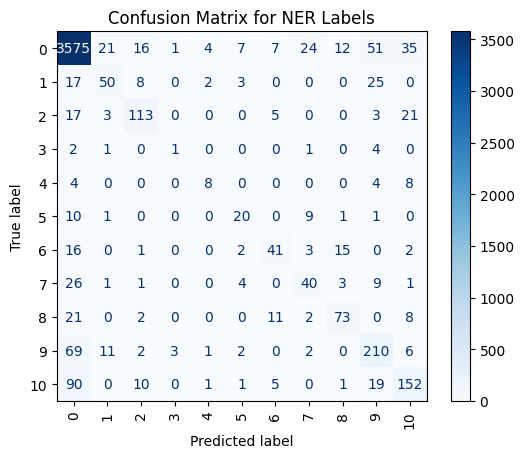


 36%|███▌      | 3349/9300 [12:54<1:03:01,  1.57it/s]

{'eval_loss': 1.2745990753173828, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8593287774394502, 'eval_runtime': 1.5104, 'eval_samples_per_second': 122.483, 'eval_steps_per_second': 15.89, 'epoch': 36.0}


 37%|███▋      | 3441/9300 [13:13<18:22,  5.31it/s]  

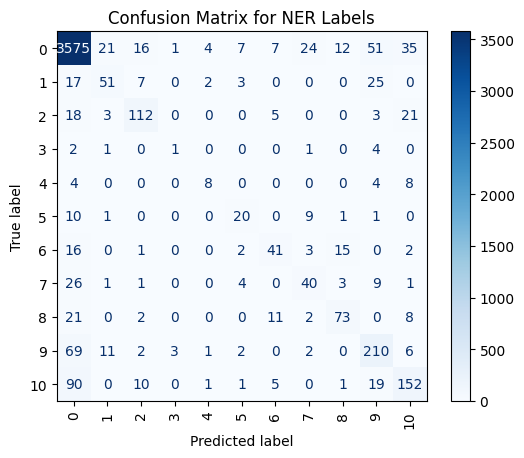


 37%|███▋      | 3442/9300 [13:15<1:02:50,  1.55it/s]

{'eval_loss': 1.2769577503204346, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8593378575928028, 'eval_runtime': 1.5299, 'eval_samples_per_second': 120.925, 'eval_steps_per_second': 15.688, 'epoch': 37.0}


 38%|███▊      | 3500/9300 [13:27<20:32,  4.70it/s]  

{'loss': 0.003, 'grad_norm': 0.06372572481632233, 'learning_rate': 1.2473118279569892e-06, 'epoch': 37.63}


 38%|███▊      | 3534/9300 [13:42<18:41,  5.14it/s]  

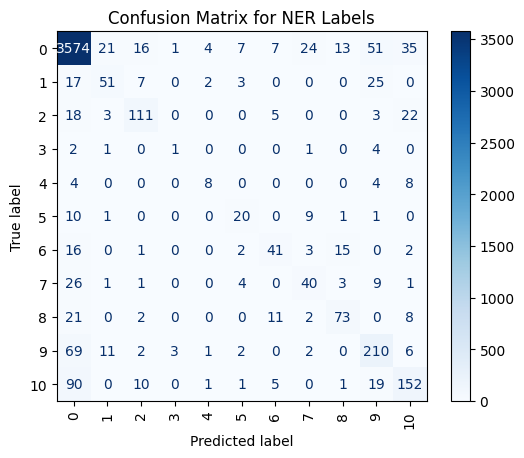


 38%|███▊      | 3535/9300 [13:43<1:02:25,  1.54it/s]

{'eval_loss': 1.2770308256149292, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.85896342123215, 'eval_runtime': 1.5413, 'eval_samples_per_second': 120.028, 'eval_steps_per_second': 15.571, 'epoch': 38.0}


 39%|███▉      | 3627/9300 [14:02<18:14,  5.18it/s]  

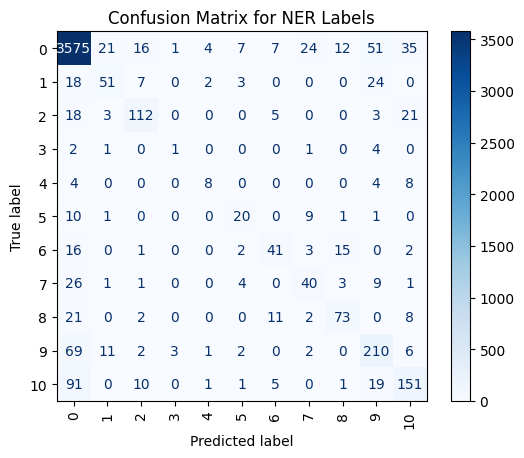


 39%|███▉      | 3628/9300 [14:04<1:01:32,  1.54it/s]

{'eval_loss': 1.279894232749939, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8590609153724709, 'eval_runtime': 1.541, 'eval_samples_per_second': 120.049, 'eval_steps_per_second': 15.574, 'epoch': 39.0}


 40%|████      | 3720/9300 [14:23<17:36,  5.28it/s]  

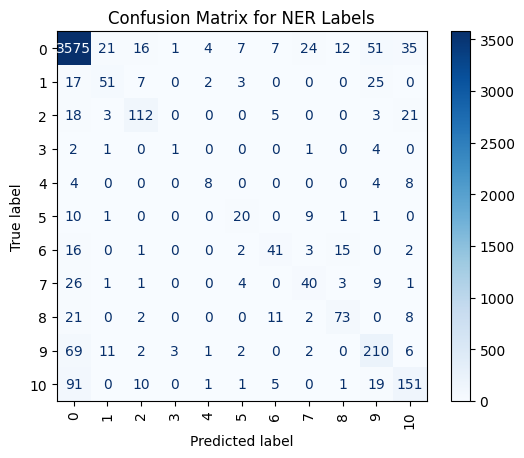


 40%|████      | 3721/9300 [14:25<1:07:09,  1.38it/s]

{'eval_loss': 1.2795785665512085, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8590895324505852, 'eval_runtime': 1.7927, 'eval_samples_per_second': 103.193, 'eval_steps_per_second': 13.387, 'epoch': 40.0}


 41%|████      | 3813/9300 [14:44<16:41,  5.48it/s]  

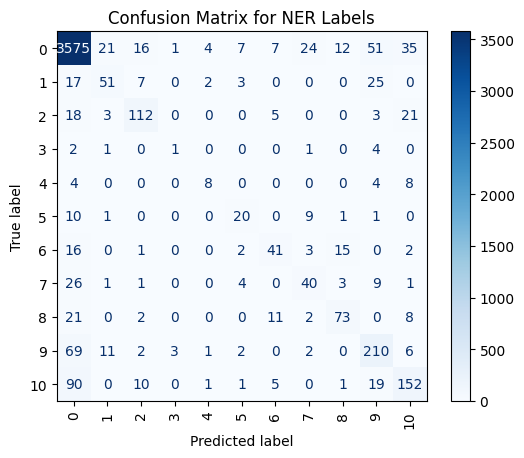


 41%|████      | 3814/9300 [14:46<56:38,  1.61it/s]

{'eval_loss': 1.2800641059875488, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8593378575928028, 'eval_runtime': 1.4736, 'eval_samples_per_second': 125.544, 'eval_steps_per_second': 16.287, 'epoch': 41.0}


 42%|████▏     | 3906/9300 [15:04<17:07,  5.25it/s]

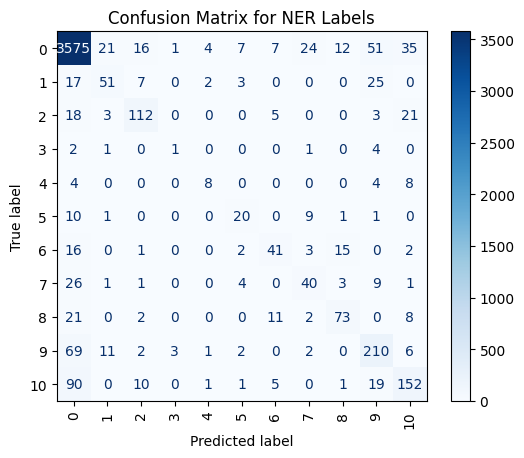


 42%|████▏     | 3907/9300 [15:06<56:53,  1.58it/s]

{'eval_loss': 1.2803350687026978, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8593378575928028, 'eval_runtime': 1.4974, 'eval_samples_per_second': 123.545, 'eval_steps_per_second': 16.027, 'epoch': 42.0}


 43%|████▎     | 3999/9300 [15:25<16:23,  5.39it/s]

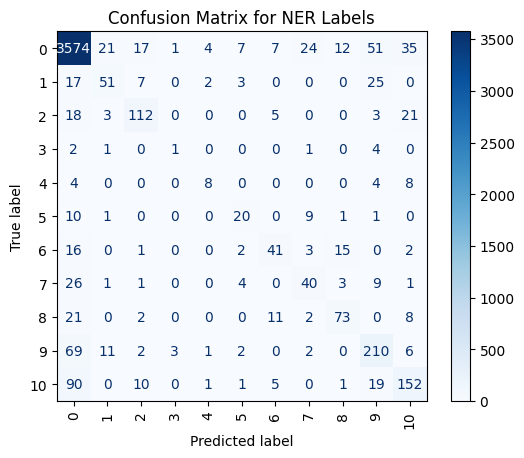


 43%|████▎     | 4000/9300 [15:27<54:54,  1.61it/s]

{'eval_loss': 1.2814018726348877, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8591580229982296, 'eval_runtime': 1.4733, 'eval_samples_per_second': 125.566, 'eval_steps_per_second': 16.29, 'epoch': 43.0}


 43%|████▎     | 4000/9300 [15:27<54:54,  1.61it/s]

{'loss': 0.0033, 'grad_norm': 0.4567700922489166, 'learning_rate': 1.1397849462365593e-06, 'epoch': 43.01}


 44%|████▍     | 4092/9300 [15:54<15:46,  5.50it/s]  

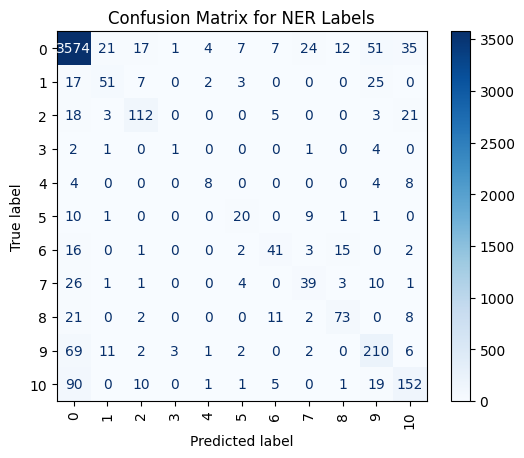


 44%|████▍     | 4093/9300 [15:55<53:45,  1.61it/s]

{'eval_loss': 1.2815885543823242, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.8589356746983172, 'eval_runtime': 1.4783, 'eval_samples_per_second': 125.144, 'eval_steps_per_second': 16.235, 'epoch': 44.0}


 45%|████▌     | 4185/9300 [16:14<15:34,  5.47it/s]

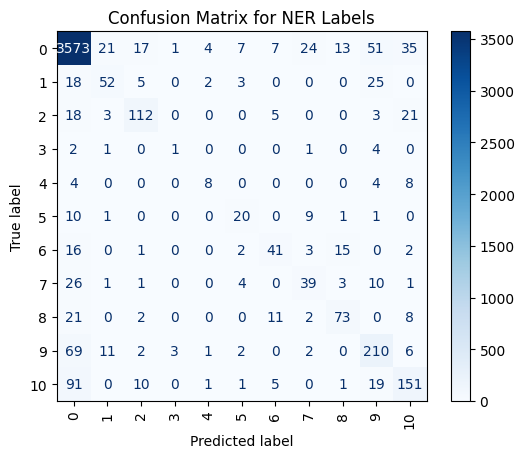


 45%|████▌     | 4186/9300 [16:15<52:45,  1.62it/s]

{'eval_loss': 1.2826378345489502, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.8587280760284811, 'eval_runtime': 1.4719, 'eval_samples_per_second': 125.688, 'eval_steps_per_second': 16.305, 'epoch': 45.0}


 46%|████▌     | 4278/9300 [16:34<15:21,  5.45it/s]

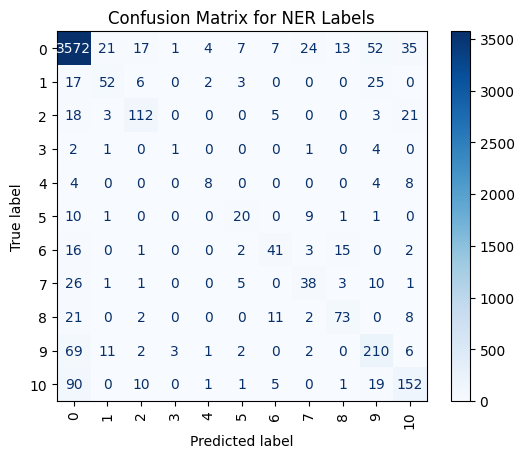


 46%|████▌     | 4279/9300 [16:36<51:55,  1.61it/s]

{'eval_loss': 1.2826488018035889, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.8586145525216689, 'eval_runtime': 1.4761, 'eval_samples_per_second': 125.332, 'eval_steps_per_second': 16.259, 'epoch': 46.0}


 47%|████▋     | 4371/9300 [16:54<15:02,  5.46it/s]

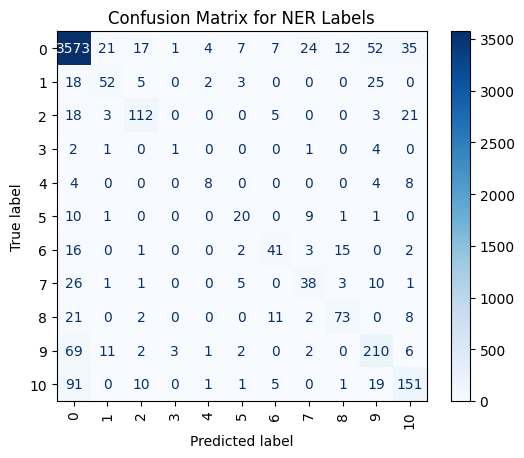


 47%|████▋     | 4372/9300 [16:56<51:03,  1.61it/s]

{'eval_loss': 1.282691478729248, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.8585225736789007, 'eval_runtime': 1.4804, 'eval_samples_per_second': 124.963, 'eval_steps_per_second': 16.211, 'epoch': 47.0}


 48%|████▊     | 4464/9300 [17:14<14:48,  5.44it/s]

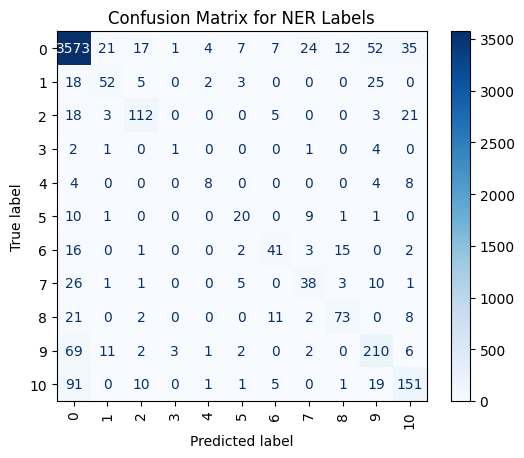


 48%|████▊     | 4465/9300 [17:16<50:02,  1.61it/s]

{'eval_loss': 1.2833646535873413, 'eval_accuracy': 0.8623538895606611, 'eval_f1': 0.8585225736789007, 'eval_runtime': 1.4769, 'eval_samples_per_second': 125.261, 'eval_steps_per_second': 16.25, 'epoch': 48.0}


 48%|████▊     | 4500/9300 [17:23<16:15,  4.92it/s]

{'loss': 0.0033, 'grad_norm': 0.29407545924186707, 'learning_rate': 1.032258064516129e-06, 'epoch': 48.39}


 49%|████▉     | 4557/9300 [17:43<14:29,  5.46it/s]  

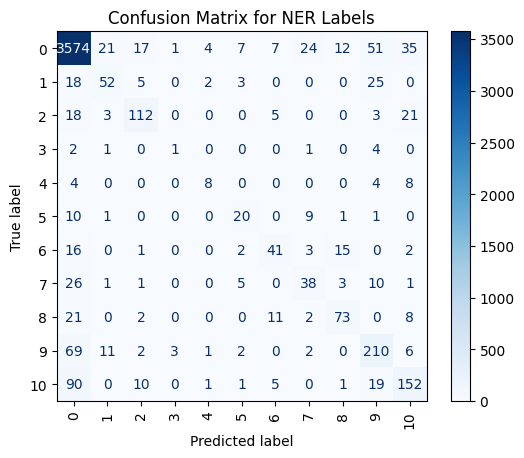


 49%|████▉     | 4558/9300 [17:45<48:50,  1.62it/s]

{'eval_loss': 1.284017562866211, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.858940860505641, 'eval_runtime': 1.4688, 'eval_samples_per_second': 125.955, 'eval_steps_per_second': 16.34, 'epoch': 49.0}


 50%|█████     | 4650/9300 [18:03<14:09,  5.48it/s]

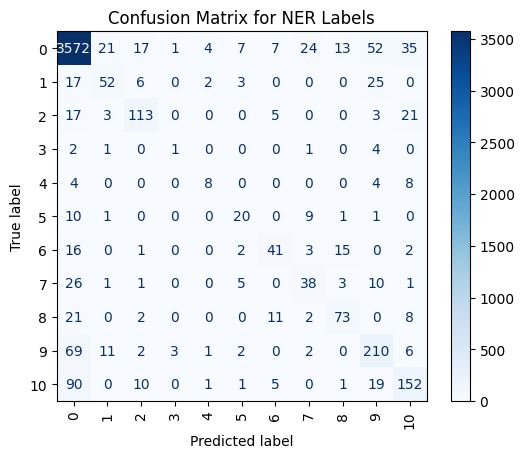


 50%|█████     | 4651/9300 [18:05<47:53,  1.62it/s]

{'eval_loss': 1.2833107709884644, 'eval_accuracy': 0.8625554212011286, 'eval_f1': 0.858841702110378, 'eval_runtime': 1.4748, 'eval_samples_per_second': 125.444, 'eval_steps_per_second': 16.274, 'epoch': 50.0}


 51%|█████     | 4743/9300 [18:23<13:52,  5.48it/s]

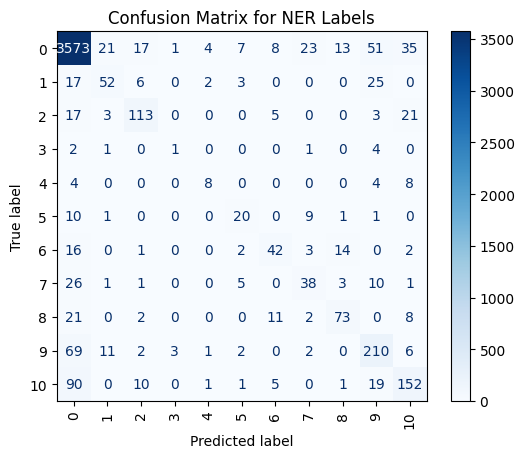


 51%|█████     | 4744/9300 [18:25<47:28,  1.60it/s]

{'eval_loss': 1.283826231956482, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8592259853459028, 'eval_runtime': 1.4923, 'eval_samples_per_second': 123.969, 'eval_steps_per_second': 16.082, 'epoch': 51.0}


 52%|█████▏    | 4836/9300 [18:43<13:37,  5.46it/s]

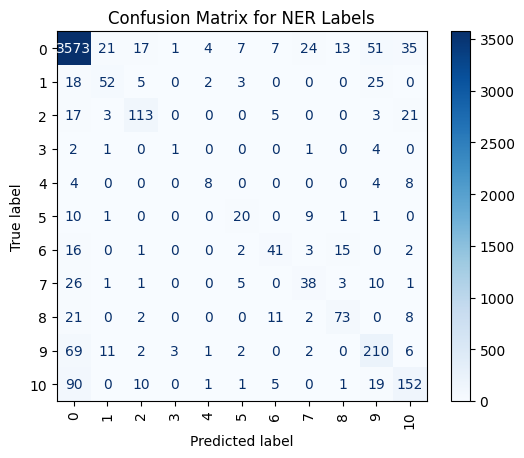


 52%|█████▏    | 4837/9300 [18:45<46:29,  1.60it/s]

{'eval_loss': 1.2851815223693848, 'eval_accuracy': 0.8627569528415961, 'eval_f1': 0.858993185490033, 'eval_runtime': 1.494, 'eval_samples_per_second': 123.828, 'eval_steps_per_second': 16.064, 'epoch': 52.0}


 53%|█████▎    | 4929/9300 [19:04<13:12,  5.51it/s]

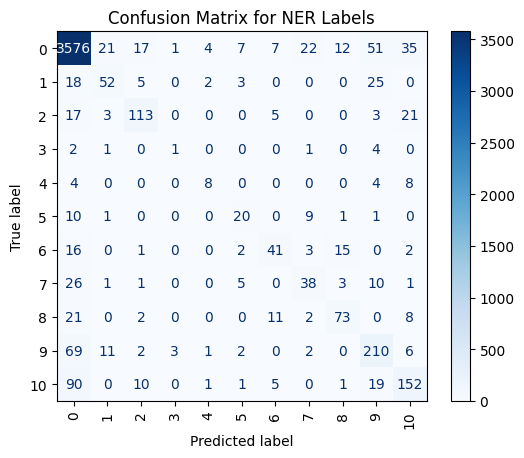


 53%|█████▎    | 4930/9300 [19:05<50:21,  1.45it/s]

{'eval_loss': 1.2880510091781616, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.859477001784865, 'eval_runtime': 1.7168, 'eval_samples_per_second': 107.76, 'eval_steps_per_second': 13.98, 'epoch': 53.0}


 54%|█████▍    | 5000/9300 [19:20<14:28,  4.95it/s]

{'loss': 0.0035, 'grad_norm': 0.1959192305803299, 'learning_rate': 9.247311827956989e-07, 'epoch': 53.76}


 54%|█████▍    | 5022/9300 [19:29<13:07,  5.43it/s]  

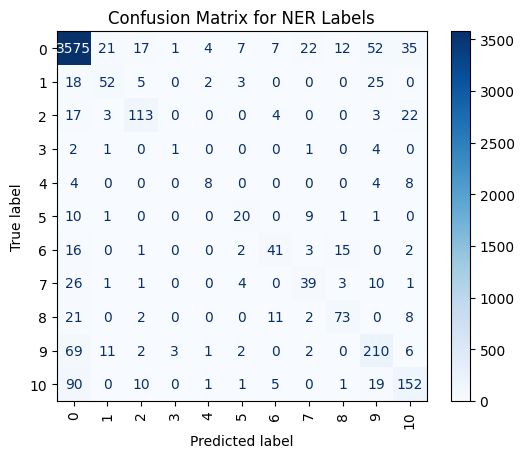


 54%|█████▍    | 5023/9300 [19:31<43:43,  1.63it/s]

{'eval_loss': 1.2880806922912598, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8595137976978627, 'eval_runtime': 1.4535, 'eval_samples_per_second': 127.278, 'eval_steps_per_second': 16.512, 'epoch': 54.0}


 55%|█████▌    | 5115/9300 [19:49<12:46,  5.46it/s]

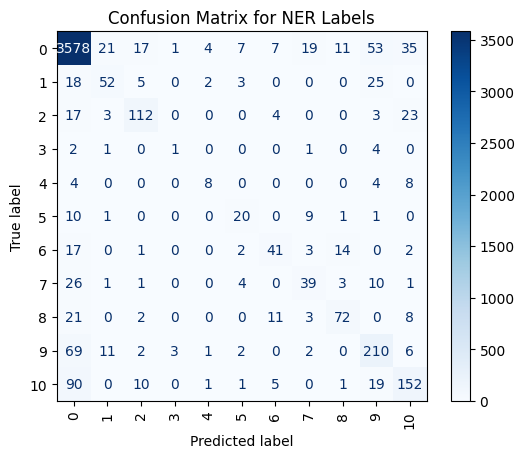


 55%|█████▌    | 5116/9300 [19:51<43:04,  1.62it/s]

{'eval_loss': 1.2902661561965942, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8595723421760666, 'eval_runtime': 1.4697, 'eval_samples_per_second': 125.877, 'eval_steps_per_second': 16.33, 'epoch': 55.0}


 56%|█████▌    | 5208/9300 [20:10<12:29,  5.46it/s]

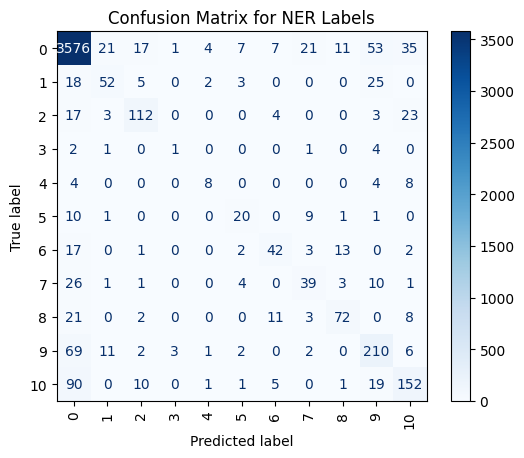


 56%|█████▌    | 5209/9300 [20:11<42:16,  1.61it/s]

{'eval_loss': 1.2897993326187134, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8594873839528988, 'eval_runtime': 1.4731, 'eval_samples_per_second': 125.59, 'eval_steps_per_second': 16.293, 'epoch': 56.0}


 57%|█████▋    | 5301/9300 [20:30<12:15,  5.44it/s]

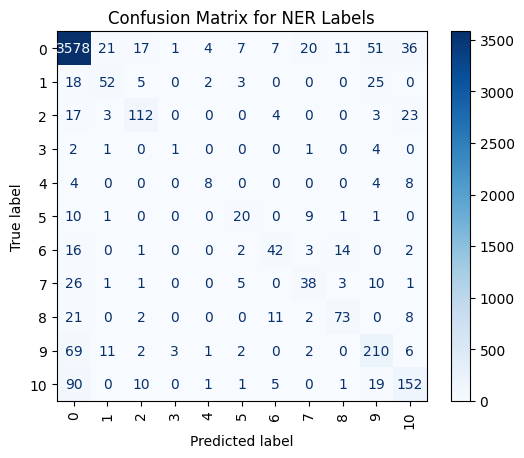


 57%|█████▋    | 5302/9300 [20:31<41:33,  1.60it/s]

{'eval_loss': 1.289442539215088, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8598173470939022, 'eval_runtime': 1.4792, 'eval_samples_per_second': 125.072, 'eval_steps_per_second': 16.226, 'epoch': 57.0}


 58%|█████▊    | 5394/9300 [20:50<11:53,  5.48it/s]

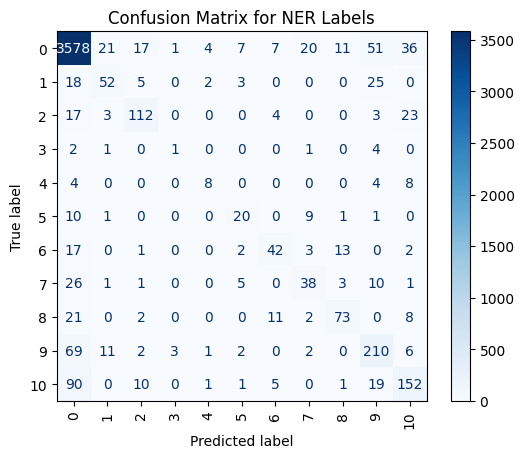


 58%|█████▊    | 5395/9300 [20:52<40:18,  1.61it/s]

{'eval_loss': 1.2903940677642822, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8597952046172649, 'eval_runtime': 1.473, 'eval_samples_per_second': 125.596, 'eval_steps_per_second': 16.294, 'epoch': 58.0}


 59%|█████▉    | 5487/9300 [21:10<11:36,  5.47it/s]

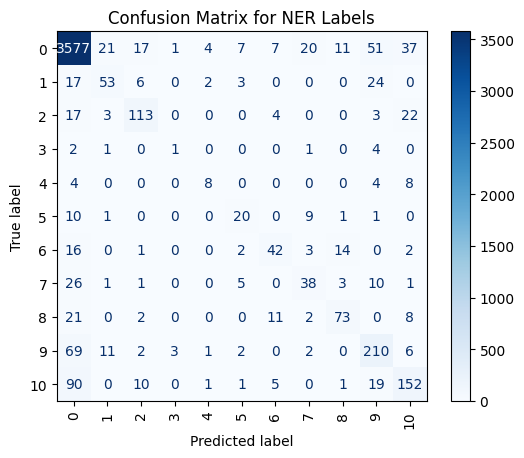


 59%|█████▉    | 5488/9300 [21:12<39:19,  1.62it/s]

{'eval_loss': 1.2891490459442139, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8600873653865292, 'eval_runtime': 1.4744, 'eval_samples_per_second': 125.474, 'eval_steps_per_second': 16.278, 'epoch': 59.0}


 59%|█████▉    | 5500/9300 [21:14<13:02,  4.85it/s]

{'loss': 0.0035, 'grad_norm': 0.108523890376091, 'learning_rate': 8.172043010752689e-07, 'epoch': 59.14}


 60%|██████    | 5580/9300 [21:36<11:24,  5.44it/s]  

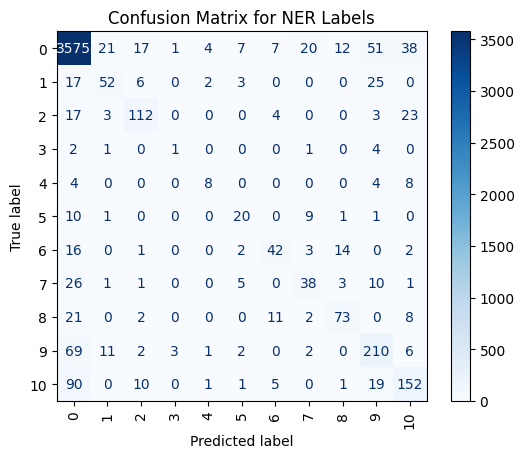


 60%|██████    | 5581/9300 [21:37<38:19,  1.62it/s]

{'eval_loss': 1.2887459993362427, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8593207655960955, 'eval_runtime': 1.4621, 'eval_samples_per_second': 126.532, 'eval_steps_per_second': 16.415, 'epoch': 60.0}


 61%|██████    | 5673/9300 [21:56<11:01,  5.48it/s]

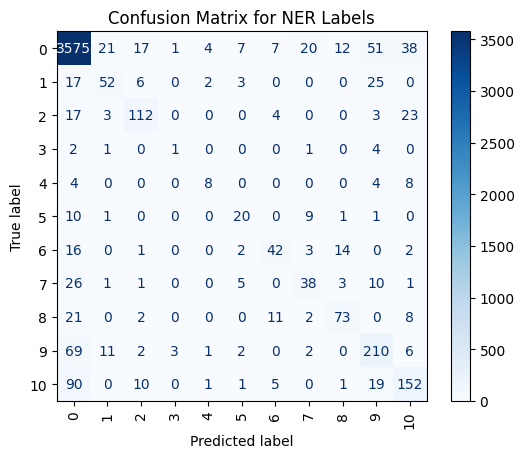


 61%|██████    | 5674/9300 [21:57<37:29,  1.61it/s]

{'eval_loss': 1.2889984846115112, 'eval_accuracy': 0.8631600161225312, 'eval_f1': 0.8593207655960955, 'eval_runtime': 1.4803, 'eval_samples_per_second': 124.974, 'eval_steps_per_second': 16.213, 'epoch': 61.0}


 62%|██████▏   | 5766/9300 [22:16<10:47,  5.45it/s]

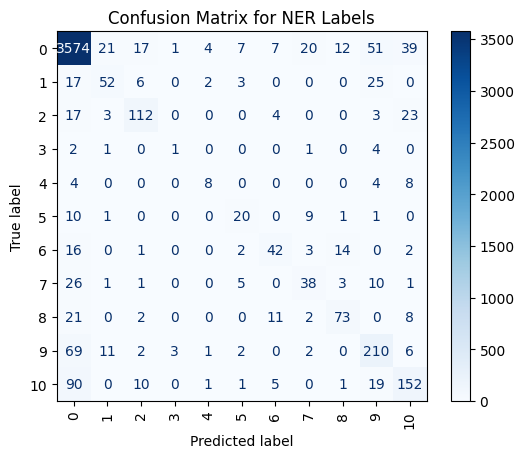


 62%|██████▏   | 5767/9300 [22:17<36:32,  1.61it/s]

{'eval_loss': 1.2891385555267334, 'eval_accuracy': 0.8629584844820637, 'eval_f1': 0.8591515131607393, 'eval_runtime': 1.476, 'eval_samples_per_second': 125.341, 'eval_steps_per_second': 16.26, 'epoch': 62.0}


 63%|██████▎   | 5859/9300 [22:36<10:31,  5.45it/s]

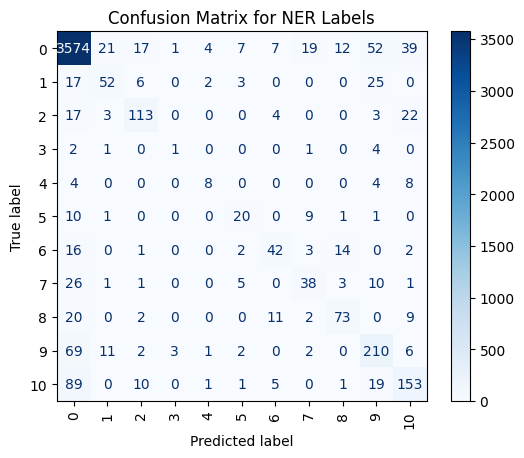


 63%|██████▎   | 5860/9300 [22:38<35:28,  1.62it/s]

{'eval_loss': 1.2893788814544678, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8596120842559094, 'eval_runtime': 1.474, 'eval_samples_per_second': 125.513, 'eval_steps_per_second': 16.283, 'epoch': 63.0}


 64%|██████▍   | 5952/9300 [22:56<10:10,  5.49it/s]

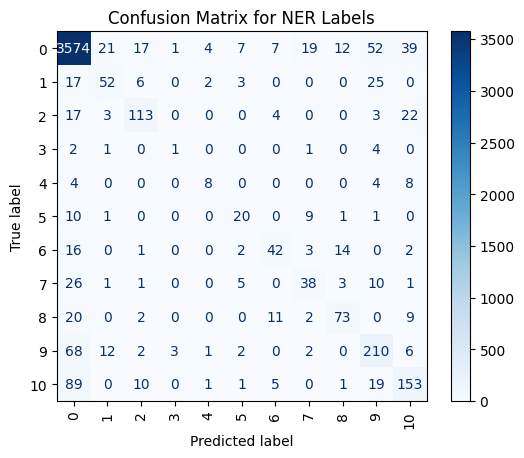


 64%|██████▍   | 5953/9300 [22:58<35:24,  1.58it/s]

{'eval_loss': 1.289961814880371, 'eval_accuracy': 0.8633615477629988, 'eval_f1': 0.8596481907728454, 'eval_runtime': 1.5213, 'eval_samples_per_second': 121.604, 'eval_steps_per_second': 15.776, 'epoch': 64.0}


 65%|██████▍   | 6000/9300 [23:08<11:33,  4.76it/s]

{'loss': 0.0036, 'grad_norm': 0.0014296936569735408, 'learning_rate': 7.096774193548387e-07, 'epoch': 64.52}


 65%|██████▌   | 6045/9300 [23:22<09:51,  5.50it/s]  

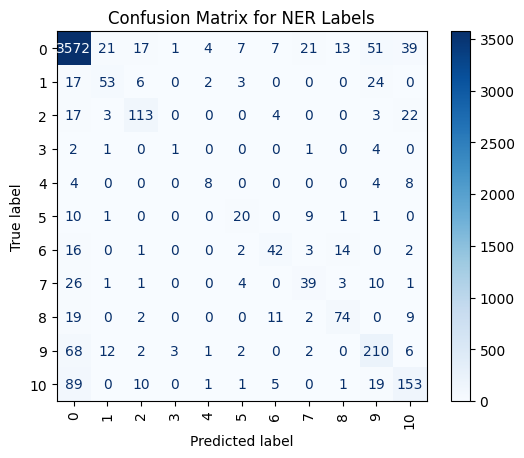


 65%|██████▌   | 6046/9300 [23:24<33:32,  1.62it/s]

{'eval_loss': 1.290216088294983, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8600006666658331, 'eval_runtime': 1.4756, 'eval_samples_per_second': 125.37, 'eval_steps_per_second': 16.264, 'epoch': 65.0}


 66%|██████▌   | 6138/9300 [23:43<09:44,  5.41it/s]

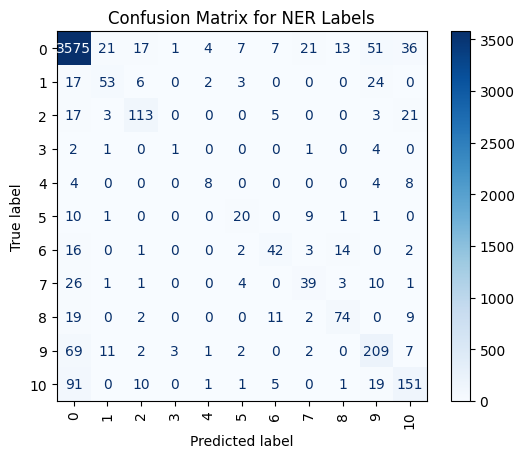


 66%|██████▌   | 6139/9300 [23:44<36:36,  1.44it/s]

{'eval_loss': 1.2907466888427734, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8597878804427668, 'eval_runtime': 1.7162, 'eval_samples_per_second': 107.795, 'eval_steps_per_second': 13.984, 'epoch': 66.0}


 67%|██████▋   | 6231/9300 [24:03<09:22,  5.45it/s]

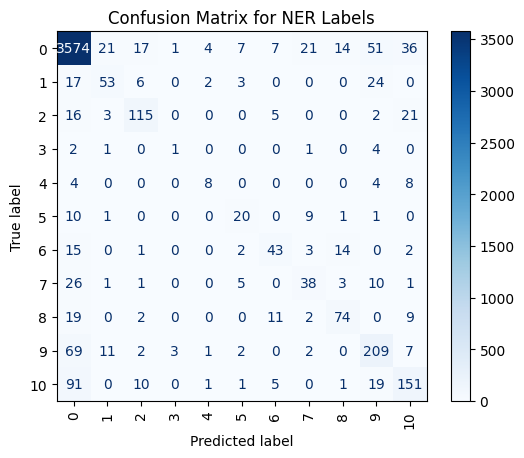


 67%|██████▋   | 6232/9300 [24:05<31:45,  1.61it/s]

{'eval_loss': 1.29005765914917, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8600705370206333, 'eval_runtime': 1.4752, 'eval_samples_per_second': 125.408, 'eval_steps_per_second': 16.269, 'epoch': 67.0}


 68%|██████▊   | 6324/9300 [24:23<09:07,  5.43it/s]

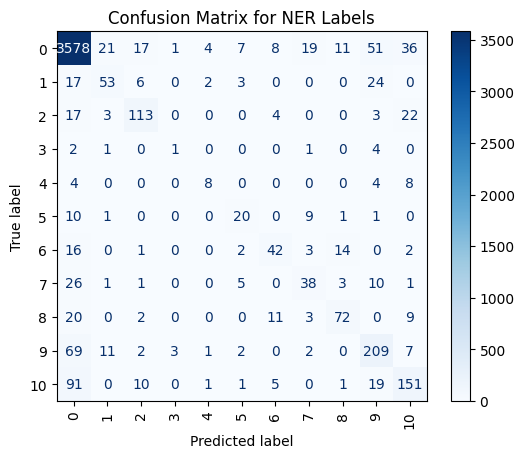


 68%|██████▊   | 6325/9300 [24:25<30:36,  1.62it/s]

{'eval_loss': 1.2912073135375977, 'eval_accuracy': 0.8635630794034663, 'eval_f1': 0.8596393567522632, 'eval_runtime': 1.4636, 'eval_samples_per_second': 126.402, 'eval_steps_per_second': 16.398, 'epoch': 68.0}


 69%|██████▉   | 6417/9300 [24:43<08:45,  5.49it/s]

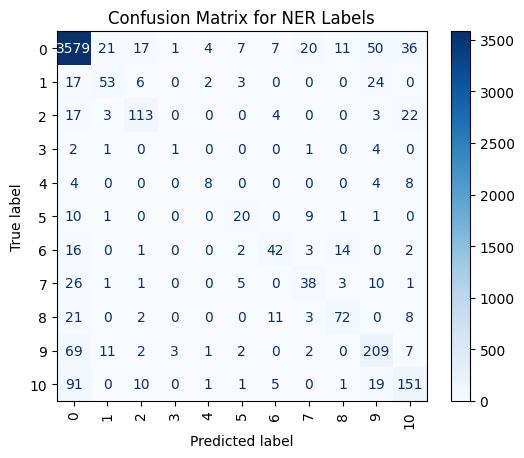


 69%|██████▉   | 6418/9300 [24:45<29:44,  1.62it/s]

{'eval_loss': 1.2924786806106567, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8597900987666202, 'eval_runtime': 1.4732, 'eval_samples_per_second': 125.574, 'eval_steps_per_second': 16.291, 'epoch': 69.0}


 70%|██████▉   | 6500/9300 [25:01<09:24,  4.96it/s]

{'loss': 0.0036, 'grad_norm': 0.0028585700783878565, 'learning_rate': 6.021505376344086e-07, 'epoch': 69.89}


 70%|███████   | 6510/9300 [25:09<11:30,  4.04it/s]  

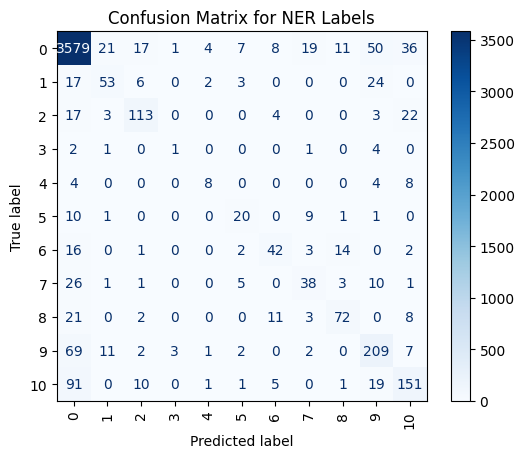


 70%|███████   | 6511/9300 [25:10<30:41,  1.51it/s]

{'eval_loss': 1.294190764427185, 'eval_accuracy': 0.8637646110439339, 'eval_f1': 0.8597800433971272, 'eval_runtime': 1.4637, 'eval_samples_per_second': 126.393, 'eval_steps_per_second': 16.397, 'epoch': 70.0}


 71%|███████   | 6603/9300 [25:28<07:47,  5.77it/s]

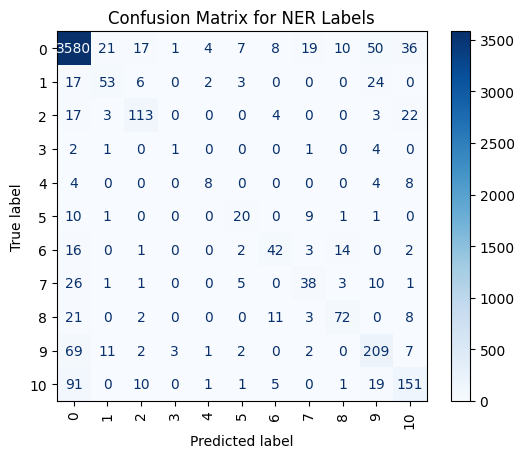


 71%|███████   | 6604/9300 [25:30<26:44,  1.68it/s]

{'eval_loss': 1.2946776151657104, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8599564491279753, 'eval_runtime': 1.4284, 'eval_samples_per_second': 129.515, 'eval_steps_per_second': 16.802, 'epoch': 71.0}


 72%|███████▏  | 6696/9300 [25:49<07:55,  5.47it/s]

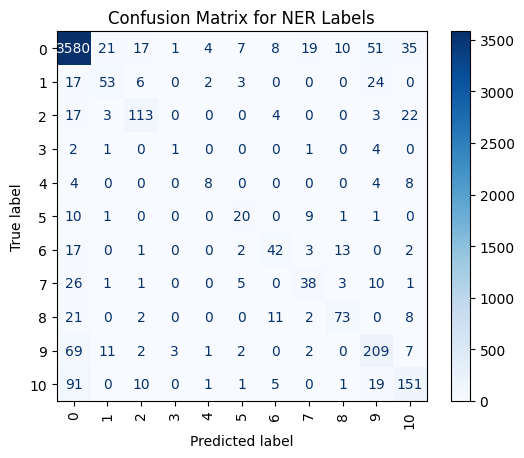


 72%|███████▏  | 6697/9300 [25:50<26:39,  1.63it/s]

{'eval_loss': 1.2946605682373047, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8601299035348094, 'eval_runtime': 1.4596, 'eval_samples_per_second': 126.75, 'eval_steps_per_second': 16.443, 'epoch': 72.0}


 73%|███████▎  | 6789/9300 [26:09<07:34,  5.52it/s]

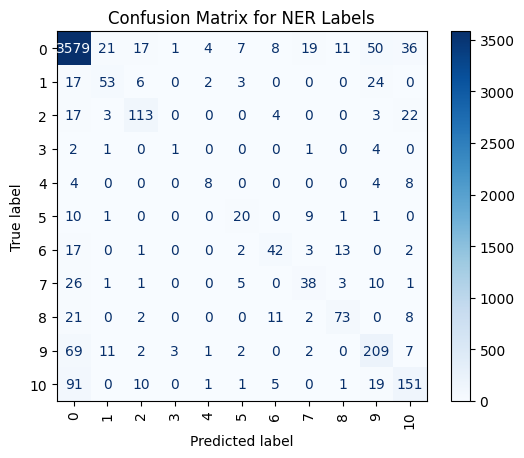


 73%|███████▎  | 6790/9300 [26:10<25:37,  1.63it/s]

{'eval_loss': 1.2949107885360718, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.859952957524389, 'eval_runtime': 1.4575, 'eval_samples_per_second': 126.925, 'eval_steps_per_second': 16.466, 'epoch': 73.0}


 74%|███████▍  | 6882/9300 [26:29<07:19,  5.50it/s]

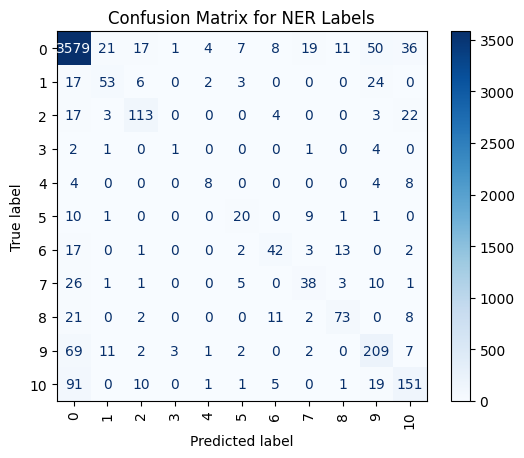


 74%|███████▍  | 6883/9300 [26:30<24:53,  1.62it/s]

{'eval_loss': 1.2948960065841675, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.859952957524389, 'eval_runtime': 1.4685, 'eval_samples_per_second': 125.98, 'eval_steps_per_second': 16.343, 'epoch': 74.0}


 75%|███████▌  | 6975/9300 [26:49<07:04,  5.48it/s]

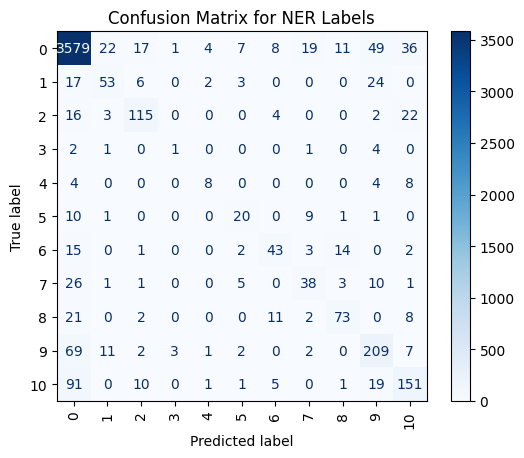


 75%|███████▌  | 6976/9300 [26:50<23:54,  1.62it/s]

{'eval_loss': 1.293383240699768, 'eval_accuracy': 0.8645707376058042, 'eval_f1': 0.8606528787065418, 'eval_runtime': 1.465, 'eval_samples_per_second': 126.278, 'eval_steps_per_second': 16.382, 'epoch': 75.0}


 75%|███████▌  | 7000/9300 [26:55<07:40,  5.00it/s]

{'loss': 0.0037, 'grad_norm': 0.4264833629131317, 'learning_rate': 4.946236559139784e-07, 'epoch': 75.27}


 76%|███████▌  | 7068/9300 [27:14<06:43,  5.53it/s]  

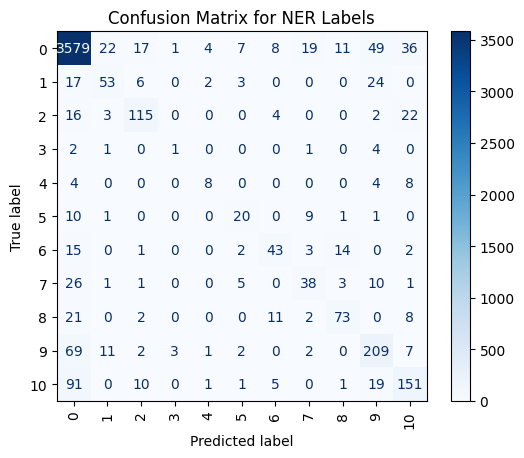


 76%|███████▌  | 7069/9300 [27:16<22:48,  1.63it/s]

{'eval_loss': 1.293592095375061, 'eval_accuracy': 0.8645707376058042, 'eval_f1': 0.8606528787065418, 'eval_runtime': 1.4592, 'eval_samples_per_second': 126.781, 'eval_steps_per_second': 16.447, 'epoch': 76.0}


 77%|███████▋  | 7161/9300 [27:34<06:27,  5.51it/s]

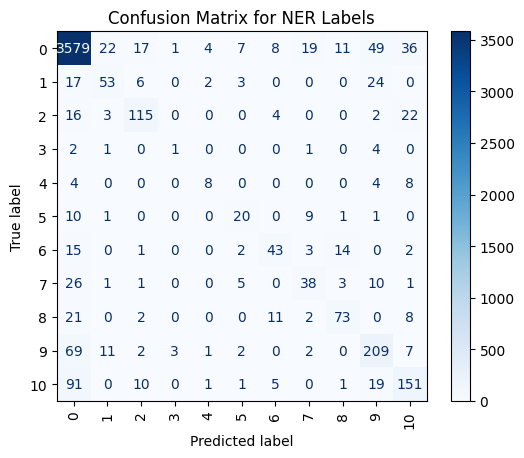


 77%|███████▋  | 7162/9300 [27:36<22:03,  1.62it/s]

{'eval_loss': 1.2937438488006592, 'eval_accuracy': 0.8645707376058042, 'eval_f1': 0.8606528787065418, 'eval_runtime': 1.471, 'eval_samples_per_second': 125.769, 'eval_steps_per_second': 16.316, 'epoch': 77.0}


 78%|███████▊  | 7254/9300 [27:54<06:12,  5.50it/s]

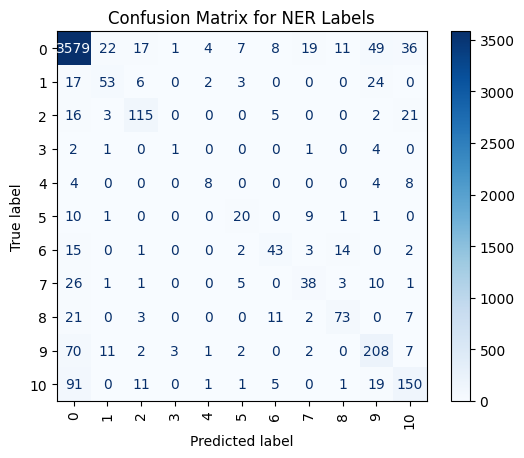


 78%|███████▊  | 7255/9300 [27:56<21:06,  1.62it/s]

{'eval_loss': 1.294171690940857, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8601920093285669, 'eval_runtime': 1.475, 'eval_samples_per_second': 125.428, 'eval_steps_per_second': 16.272, 'epoch': 78.0}


 79%|███████▉  | 7347/9300 [28:14<05:55,  5.49it/s]

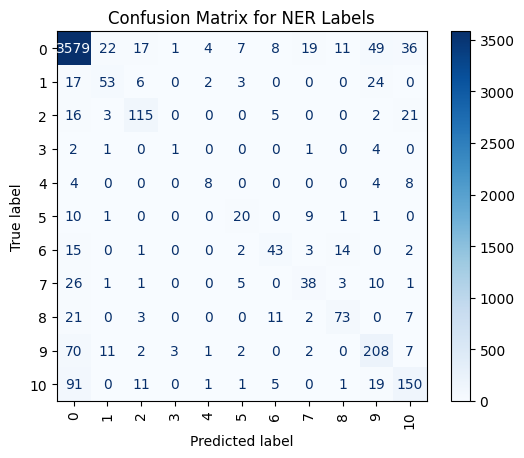


 79%|███████▉  | 7348/9300 [28:16<19:58,  1.63it/s]

{'eval_loss': 1.2943626642227173, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8601920093285669, 'eval_runtime': 1.4622, 'eval_samples_per_second': 126.526, 'eval_steps_per_second': 16.414, 'epoch': 79.0}


 80%|████████  | 7440/9300 [28:34<05:39,  5.47it/s]

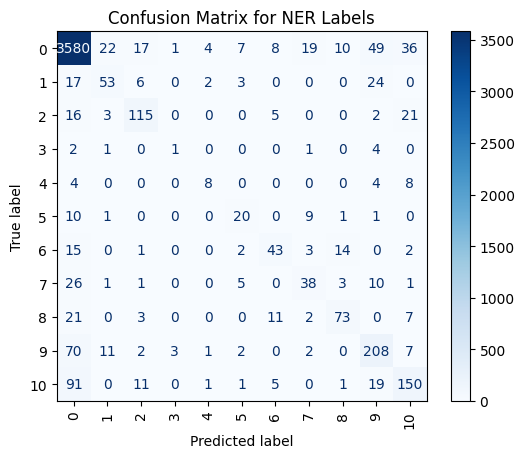


 80%|████████  | 7441/9300 [28:36<21:28,  1.44it/s]

{'eval_loss': 1.294691801071167, 'eval_accuracy': 0.8643692059653365, 'eval_f1': 0.8603687488452287, 'eval_runtime': 1.7236, 'eval_samples_per_second': 107.333, 'eval_steps_per_second': 13.924, 'epoch': 80.0}


 81%|████████  | 7500/9300 [28:48<05:59,  5.00it/s]

{'loss': 0.0035, 'grad_norm': 0.0846175029873848, 'learning_rate': 3.8709677419354837e-07, 'epoch': 80.65}


 81%|████████  | 7533/9300 [29:00<05:20,  5.51it/s]

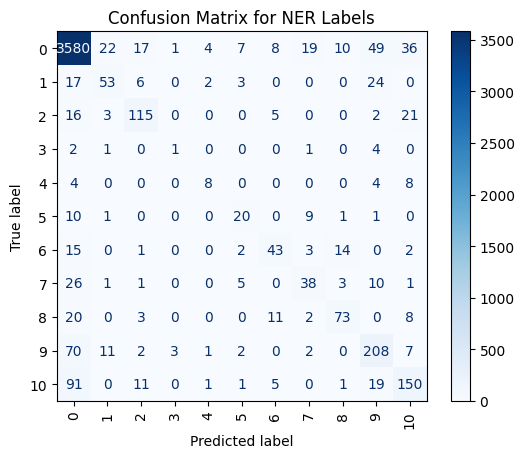


 81%|████████  | 7534/9300 [29:01<18:05,  1.63it/s]

{'eval_loss': 1.2943471670150757, 'eval_accuracy': 0.8643692059653365, 'eval_f1': 0.8603979227718819, 'eval_runtime': 1.4609, 'eval_samples_per_second': 126.638, 'eval_steps_per_second': 16.429, 'epoch': 81.0}


 82%|████████▏ | 7626/9300 [29:20<05:04,  5.50it/s]

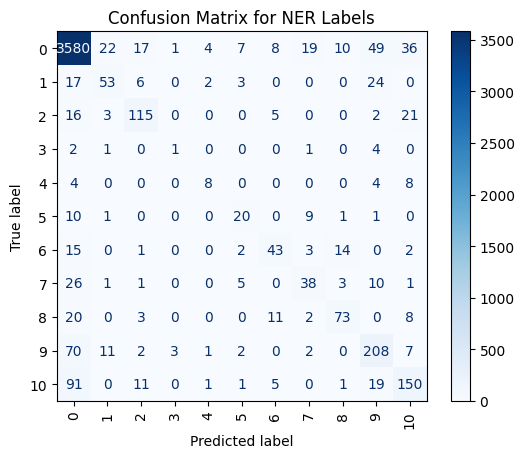


 82%|████████▏ | 7627/9300 [29:21<17:11,  1.62it/s]

{'eval_loss': 1.2942675352096558, 'eval_accuracy': 0.8643692059653365, 'eval_f1': 0.8603979227718819, 'eval_runtime': 1.4634, 'eval_samples_per_second': 126.419, 'eval_steps_per_second': 16.4, 'epoch': 82.0}


 83%|████████▎ | 7719/9300 [29:40<05:03,  5.21it/s]

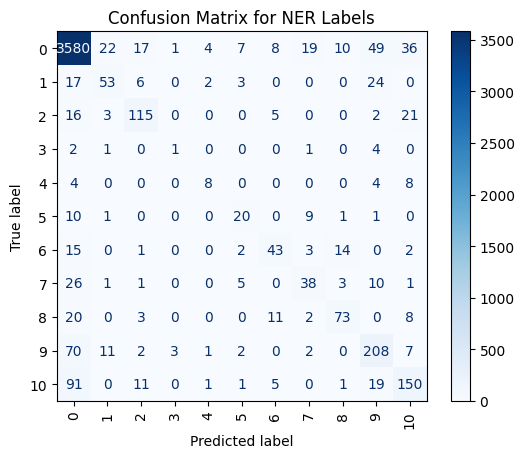


 83%|████████▎ | 7720/9300 [29:42<17:01,  1.55it/s]

{'eval_loss': 1.2947763204574585, 'eval_accuracy': 0.8643692059653365, 'eval_f1': 0.8603979227718819, 'eval_runtime': 1.5348, 'eval_samples_per_second': 120.536, 'eval_steps_per_second': 15.637, 'epoch': 83.0}


 84%|████████▍ | 7812/9300 [30:01<04:46,  5.19it/s]

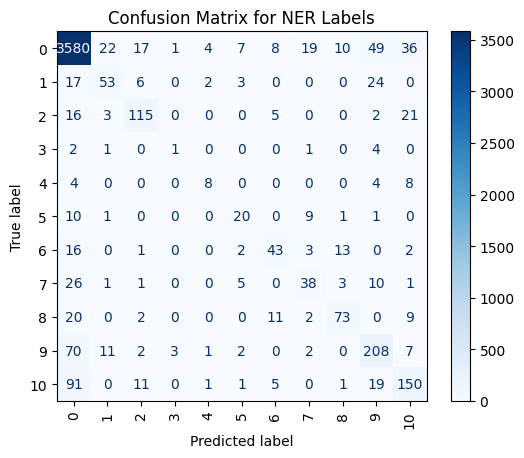


 84%|████████▍ | 7813/9300 [30:03<16:33,  1.50it/s]

{'eval_loss': 1.2950530052185059, 'eval_accuracy': 0.8643692059653365, 'eval_f1': 0.8603866521629984, 'eval_runtime': 1.6018, 'eval_samples_per_second': 115.493, 'eval_steps_per_second': 14.983, 'epoch': 84.0}


 85%|████████▌ | 7905/9300 [30:22<04:24,  5.27it/s]

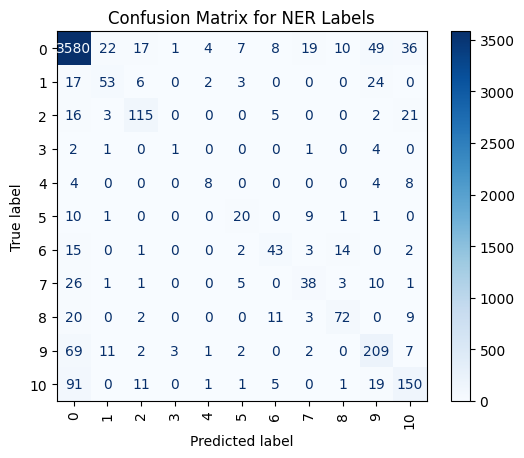


 85%|████████▌ | 7906/9300 [30:24<15:00,  1.55it/s]

{'eval_loss': 1.2955173254013062, 'eval_accuracy': 0.8643692059653365, 'eval_f1': 0.8604377172075178, 'eval_runtime': 1.5476, 'eval_samples_per_second': 119.54, 'eval_steps_per_second': 15.508, 'epoch': 85.0}


 86%|████████▌ | 7998/9300 [30:43<03:59,  5.43it/s]

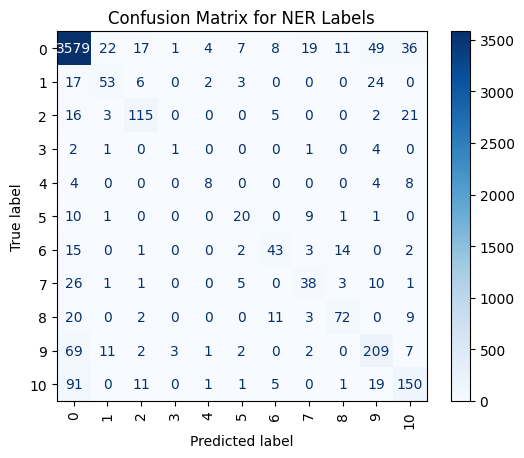


 86%|████████▌ | 7999/9300 [30:45<13:33,  1.60it/s]

{'eval_loss': 1.2952604293823242, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8602613068835633, 'eval_runtime': 1.4879, 'eval_samples_per_second': 124.34, 'eval_steps_per_second': 16.131, 'epoch': 86.0}


 86%|████████▌ | 8000/9300 [30:45<10:47,  2.01it/s]

{'loss': 0.0036, 'grad_norm': 0.02497825026512146, 'learning_rate': 2.7956989247311823e-07, 'epoch': 86.02}


 87%|████████▋ | 8091/9300 [31:08<03:34,  5.64it/s]

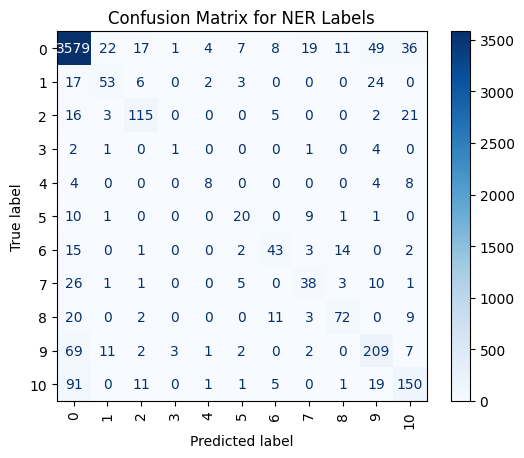


 87%|████████▋ | 8092/9300 [31:10<12:01,  1.67it/s]

{'eval_loss': 1.295394778251648, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8602613068835633, 'eval_runtime': 1.4232, 'eval_samples_per_second': 129.986, 'eval_steps_per_second': 16.863, 'epoch': 87.0}


 88%|████████▊ | 8184/9300 [31:29<03:30,  5.29it/s]

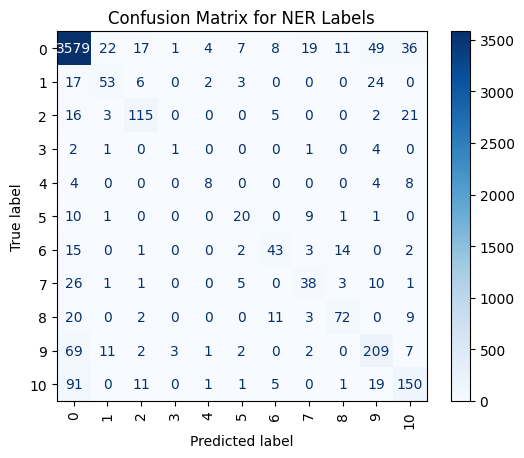


 88%|████████▊ | 8185/9300 [31:30<11:55,  1.56it/s]

{'eval_loss': 1.2954388856887817, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8602613068835633, 'eval_runtime': 1.5248, 'eval_samples_per_second': 121.327, 'eval_steps_per_second': 15.74, 'epoch': 88.0}


 89%|████████▉ | 8277/9300 [31:49<03:09,  5.41it/s]

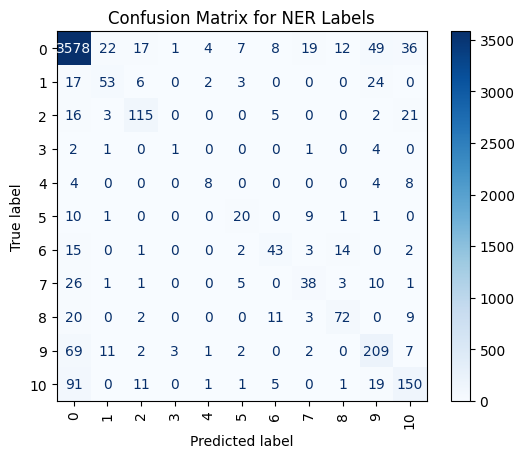


 89%|████████▉ | 8278/9300 [31:51<10:44,  1.58it/s]

{'eval_loss': 1.2958238124847412, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8600855153995602, 'eval_runtime': 1.5045, 'eval_samples_per_second': 122.965, 'eval_steps_per_second': 15.952, 'epoch': 89.0}


 90%|█████████ | 8370/9300 [32:10<02:53,  5.36it/s]

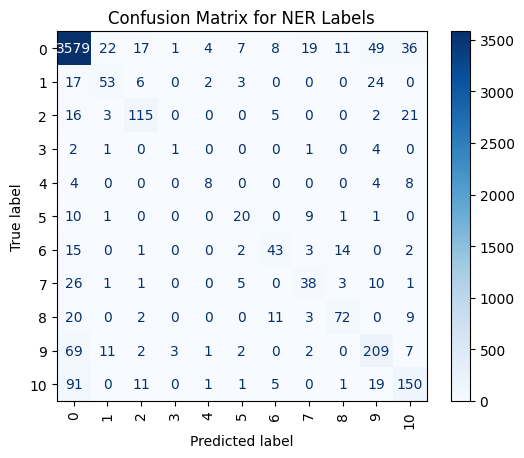


 90%|█████████ | 8371/9300 [32:12<09:50,  1.57it/s]

{'eval_loss': 1.2958568334579468, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8602613068835633, 'eval_runtime': 1.5141, 'eval_samples_per_second': 122.187, 'eval_steps_per_second': 15.851, 'epoch': 90.0}


 91%|█████████ | 8463/9300 [32:31<02:36,  5.34it/s]

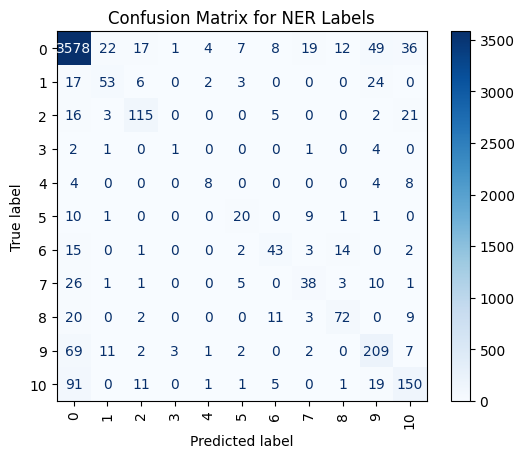


 91%|█████████ | 8464/9300 [32:33<08:52,  1.57it/s]

{'eval_loss': 1.2957669496536255, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8600855153995602, 'eval_runtime': 1.5213, 'eval_samples_per_second': 121.605, 'eval_steps_per_second': 15.776, 'epoch': 91.0}


 91%|█████████▏| 8500/9300 [32:41<02:49,  4.71it/s]

{'loss': 0.0035, 'grad_norm': 0.008819589391350746, 'learning_rate': 1.7204301075268818e-07, 'epoch': 91.4}


 92%|█████████▏| 8556/9300 [32:58<02:18,  5.38it/s]

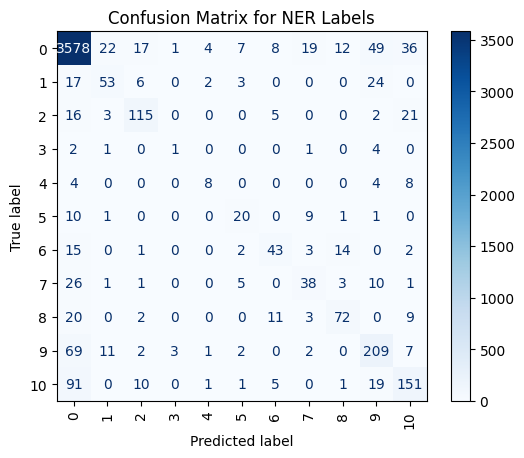


 92%|█████████▏| 8557/9300 [32:59<07:51,  1.57it/s]

{'eval_loss': 1.296004295349121, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8603152887833723, 'eval_runtime': 1.5153, 'eval_samples_per_second': 122.089, 'eval_steps_per_second': 15.839, 'epoch': 92.0}


 93%|█████████▎| 8649/9300 [33:19<02:03,  5.28it/s]

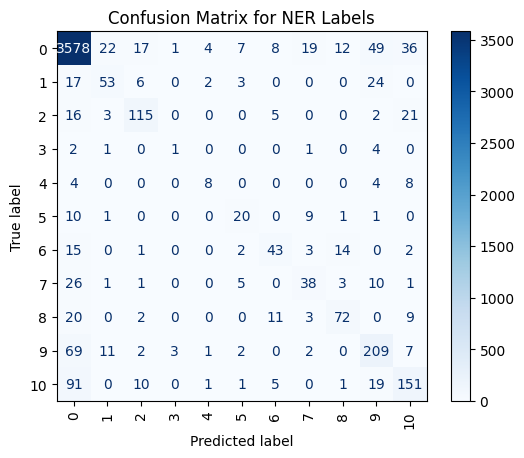


 93%|█████████▎| 8650/9300 [33:21<07:46,  1.39it/s]

{'eval_loss': 1.2959779500961304, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8603152887833723, 'eval_runtime': 1.7781, 'eval_samples_per_second': 104.046, 'eval_steps_per_second': 13.498, 'epoch': 93.0}


 94%|█████████▍| 8742/9300 [33:40<01:45,  5.30it/s]

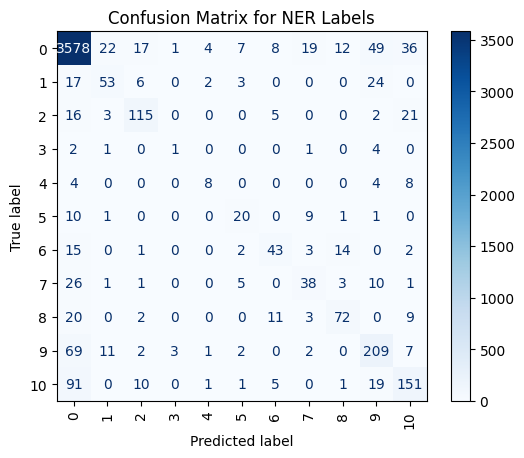


 94%|█████████▍| 8743/9300 [33:41<05:53,  1.57it/s]

{'eval_loss': 1.296044945716858, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8603152887833723, 'eval_runtime': 1.5075, 'eval_samples_per_second': 122.723, 'eval_steps_per_second': 15.921, 'epoch': 94.0}


 95%|█████████▌| 8835/9300 [34:01<01:27,  5.32it/s]

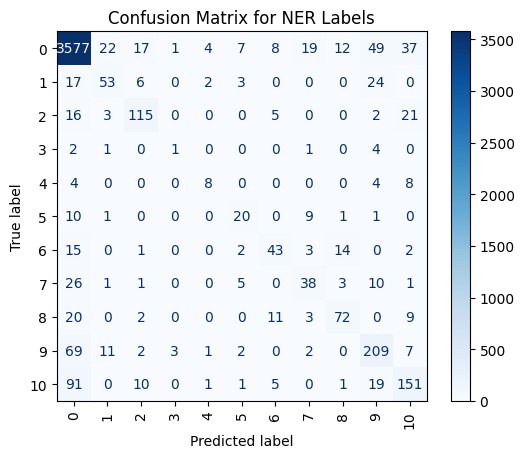


 95%|█████████▌| 8836/9300 [34:02<04:56,  1.57it/s]

{'eval_loss': 1.2959625720977783, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8601457947793255, 'eval_runtime': 1.5222, 'eval_samples_per_second': 121.537, 'eval_steps_per_second': 15.767, 'epoch': 95.0}


 96%|█████████▌| 8928/9300 [34:22<01:09,  5.33it/s]

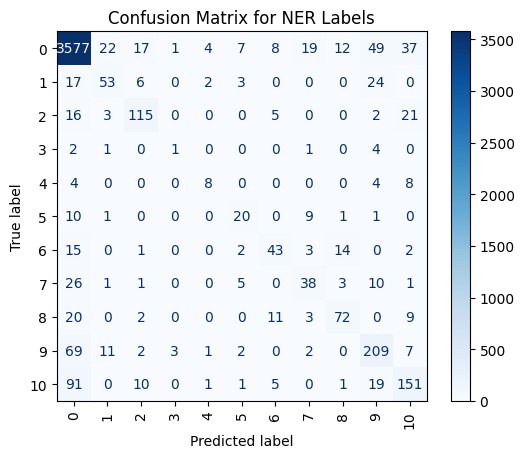


 96%|█████████▌| 8929/9300 [34:23<03:57,  1.56it/s]

{'eval_loss': 1.2960625886917114, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8601457947793255, 'eval_runtime': 1.5221, 'eval_samples_per_second': 121.546, 'eval_steps_per_second': 15.768, 'epoch': 96.0}


 97%|█████████▋| 9000/9300 [34:38<01:02,  4.81it/s]

{'loss': 0.0036, 'grad_norm': 0.02859569527208805, 'learning_rate': 6.451612903225806e-08, 'epoch': 96.77}


 97%|█████████▋| 9021/9300 [34:48<00:54,  5.11it/s]

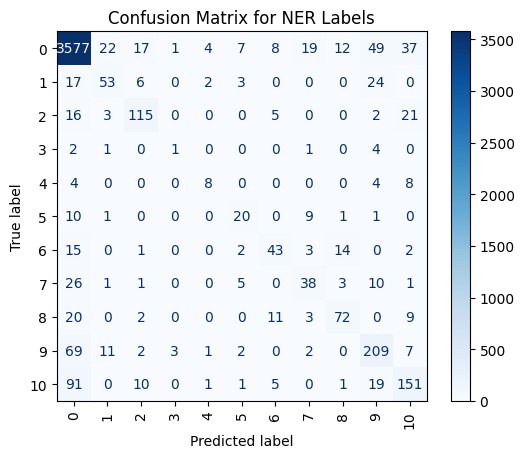


 97%|█████████▋| 9022/9300 [34:50<03:02,  1.53it/s]

{'eval_loss': 1.2960890531539917, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8601457947793255, 'eval_runtime': 1.5599, 'eval_samples_per_second': 118.597, 'eval_steps_per_second': 15.386, 'epoch': 97.0}


 98%|█████████▊| 9114/9300 [35:09<00:34,  5.38it/s]

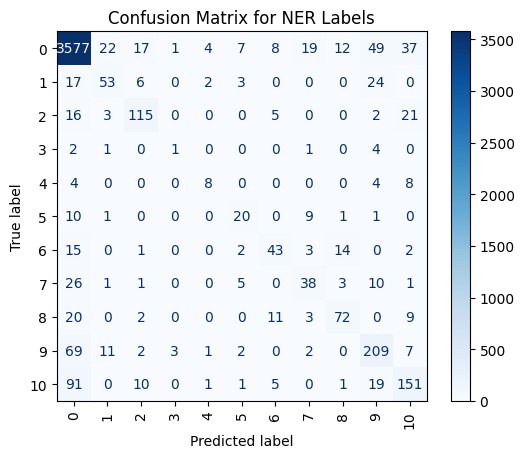


 98%|█████████▊| 9115/9300 [35:11<01:57,  1.57it/s]

{'eval_loss': 1.2961968183517456, 'eval_accuracy': 0.8639661426844014, 'eval_f1': 0.8601457947793255, 'eval_runtime': 1.5123, 'eval_samples_per_second': 122.328, 'eval_steps_per_second': 15.87, 'epoch': 98.0}


 99%|█████████▉| 9207/9300 [35:30<00:17,  5.33it/s]

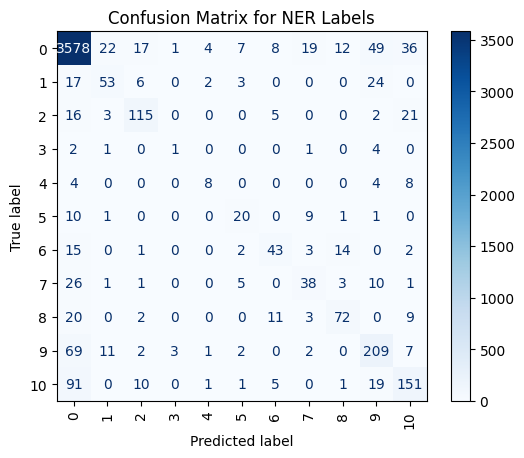


 99%|█████████▉| 9208/9300 [35:32<00:58,  1.57it/s]

{'eval_loss': 1.296217679977417, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8603152887833723, 'eval_runtime': 1.522, 'eval_samples_per_second': 121.55, 'eval_steps_per_second': 15.769, 'epoch': 99.0}


100%|██████████| 9300/9300 [35:51<00:00,  5.32it/s]

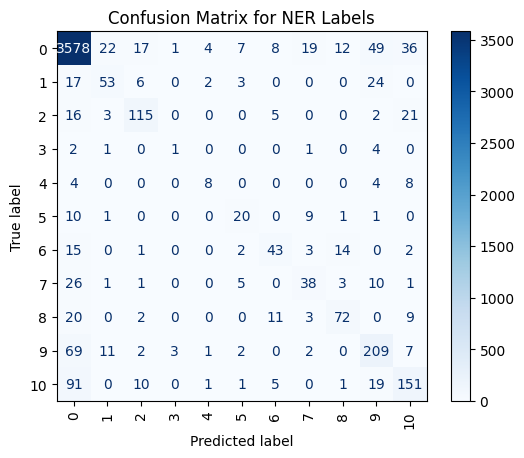


100%|██████████| 9300/9300 [35:54<00:00,  4.32it/s]


{'eval_loss': 1.2962329387664795, 'eval_accuracy': 0.864167674324869, 'eval_f1': 0.8603152887833723, 'eval_runtime': 1.4778, 'eval_samples_per_second': 125.183, 'eval_steps_per_second': 16.24, 'epoch': 100.0}
{'train_runtime': 2154.3874, 'train_samples_per_second': 34.395, 'train_steps_per_second': 4.317, 'train_loss': 0.0034904460624981953, 'epoch': 100.0}


In [86]:
# Train the model
trainer.train()

# Save the model
trainer.save_model("./saved_model_gpt2_for_tokens_3")
